In [0]:
'''
Durch Eingeben eines der folgenden selbsterklärenden Kurzsätze in die Suchleiste des Browsers
wird ein Sprung zu entsprechenden Stelle ermöglicht

"Beginn Training Split-Mengen A"
"Beginn Training Split-Mengen B"
"Beginn Training Split-Mengen C"
'''

In [0]:
#import os
#os.environ['PYTHONHASHSEED']='0'
#if os.environ.get("PYTHONHASHSEED")!="0":
 # raise Exception("You must set PYTHONHASHSEED=0 when starting the Jupyther server ")

#from __future__ import print_function
#import numpy as np
#import tensorflow as tf
#print(tf.test.gpu_device_name())
#import random as rn
# https://keras.io/getting-started/faq/#how-can-i-obtain-reproducible-results-using-keras-during-development

#np.random.seed(1)
#rn.seed(1)
#tf.set_random_seed(1) 
#session_conf = tf.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)

In [0]:
import tensorflow as tf
print(tf.test.gpu_device_name())

/device:GPU:0


In [0]:
from keras import backend as K

if 'tensorflow' == K.backend():
  import tensorflow as tf
  from keras.backend.tensorflow_backend import set_session
  config = tf.ConfigProto()
  config.gpu_options.allow_growth = True
  config.gpu_options.visible_device_list = "0"
  set_session(tf.Session(config=config))

In [0]:
# PyDrive Wrapper installieren, Bibliotheken importieren.
# Muß nur einmal pro Notebook durchgeführt werden
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
# This only needs to be done once per notebook.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [0]:
# Ältere Version von Matplotlib installieren, da die neueste Version Bugs enthält
!pip install matplotlib==3.0.2
import matplotlib
from matplotlib import pyplot as plt
matplotlib.__version__


'3.0.2'

In [0]:
# choose a local (colab) directory to store the data.
import os
local_root_path = os.path.expanduser("~/data/data")
try:
  os.makedirs(local_root_path, exist_ok=True)    
except: pass

def ListFolder(google_drive_id, destination):
  file_list = drive.ListFile({'q': "'%s' in parents and trashed=false" % google_drive_id}).GetList()
  counter = 0
  for f in file_list:
    # If it is a directory then, create the dicrectory and upload the file inside it
    if f['mimeType']=='application/vnd.google-apps.folder': 
      folder_path = os.path.join(destination, f['title'])
      os.makedirs(folder_path, exist_ok=True)
      print('creating directory {}'.format(folder_path))
      ListFolder(f['id'], folder_path)
    else:
      fname = os.path.join(destination, f['title'])
      f_ = drive.CreateFile({'id': f['id']})
      f_.GetContentFile(fname)
      counter += 1
  print('{} files were uploaded in {}'.format(counter, destination))
ListFolder("1DyM_D2ZJ5UHIXmXq4uHzKqXSkLTH-lSo", local_root_path)

creating directory /root/data/data/310 - Bilderkennung (Autos)
creating directory /root/data/data/310 - Bilderkennung (Autos)/.ipynb_checkpoints
6 files were uploaded in /root/data/data/310 - Bilderkennung (Autos)/.ipynb_checkpoints
8 files were uploaded in /root/data/data/310 - Bilderkennung (Autos)
creating directory /root/data/data/data
creating directory /root/data/data/data/GTSRB
11 files were uploaded in /root/data/data/data/GTSRB
creating directory /root/data/data/data/fashion
creating directory /root/data/data/data/fashion/VGG16
creating directory /root/data/data/data/fashion/VGG16/RGB
0 files were uploaded in /root/data/data/data/fashion/VGG16/RGB
creating directory /root/data/data/data/fashion/VGG16/LinearSVC
creating directory /root/data/data/data/fashion/VGG16/LinearSVC/60000
creating directory /root/data/data/data/fashion/VGG16/LinearSVC/60000/without_scaler
0 files were uploaded in /root/data/data/data/fashion/VGG16/LinearSVC/60000/without_scaler
0 files were uploaded in 

In [0]:
import glob
import h5py
import gzip

import time
import timeit
from timeit import default_timer as timer

from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential, load_model
from keras.layers import Dense, Dropout, Activation, Flatten, BatchNormalization
from keras.layers import Conv2D, Convolution2D, MaxPooling2D
from keras.optimizers import SGD, Adam, RMSprop
from keras.utils import np_utils
from keras.utils import to_categorical
from keras.callbacks import LearningRateScheduler, ModelCheckpoint, TensorBoard, ReduceLROnPlateau
from keras.layers.advanced_activations import LeakyReLU, ELU
from keras.wrappers.scikit_learn import KerasClassifier

#from matplotlib import pyplot as plt
#%matplotlib inline

from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten

#from keras.datasets import fashion_mnist

import numpy as np
from numpy import mean, std

from sklearn.model_selection import KFold, StratifiedKFold, train_test_split
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import average_precision_score, cohen_kappa_score, precision_recall_fscore_support
from sklearn.metrics import roc_curve, auc, precision_recall_curve

from sklearn.preprocessing import LabelBinarizer

from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

import seaborn as sns

import pickle as pkl
import csv
from google.colab import files
from PIL import Image

from sklearn.utils import shuffle

In [0]:
'''
konvertieren zu Float
Normalisieren in Bereich [0-1]
One hot encoding

'''
def prepro_data(X, y):
  X_reshape = X.reshape(X.shape[0],28,28,1)
  X_konv_norm = X_reshape.astype('float32')/255.0    
  y_one_hot = to_categorical(y)
  return X_konv_norm, y_one_hot  

In [0]:
# erstellen unterschiedlicher Trainingsmengen aus 60000 Trainingsdaten
# random_state=0
def make_subsets_training_data_A(X_tr, y_tr):    
    #Trainingsmenge mit 40.000 Bilder erzeugen
    X_tr_40000, X_te_10000_b, y_tr_40000, y_te_10000_b = train_test_split(X_tr, y_tr, random_state = 0, test_size=1/3, stratify=y_tr)
    #Trainingsmenge mit 20.000 Bilder erzeugen
    X_tr_20000, X_te_10000_d, y_tr_20000, y_te_10000_d = train_test_split(X_tr_40000, y_tr_40000, random_state = 0, test_size=1/2, stratify=y_tr_40000)
    #Trainingsmenge mit 10.000 Bilder erzeugen
    X_tr_10000, X_te_10000_e, y_tr_10000, y_te_10000_e = train_test_split(X_tr_20000, y_tr_20000, random_state = 0, test_size=1/2, stratify=y_tr_20000)
    #Trainingsmenge mit 5.000 Bilder erzeugen
    X_tr_5000, X_te_5000, y_tr_5000, y_te_5000 = train_test_split(X_tr_10000, y_tr_10000, random_state = 0, test_size=1/2, stratify=y_tr_10000)
    #Trainingsmenge mit 2.000 Bilder erzeugen
    X_tr_2000, X_te_3000, y_tr_2000, y_te_3000 = train_test_split(X_tr_5000, y_tr_5000, random_state = 0, test_size=3/5, stratify=y_tr_5000)
    #Trainingsmenge mit 1.000 Bilder erzeugen
    X_tr_1000, X_te_1000, y_tr_1000, y_te_1000 = train_test_split(X_tr_2000, y_tr_2000, random_state = 0, test_size=1/2, stratify=y_tr_2000)
    #Trainingsmenge mit 500 Bilder erzeugen
    X_tr_500, X_te_500, y_tr_500, y_te_500 = train_test_split(X_tr_1000, y_tr_1000, random_state = 0, test_size=1/2, stratify=y_tr_1000)
    return X_tr_40000, y_tr_40000, X_tr_20000, y_tr_20000, X_tr_10000, y_tr_10000, X_tr_5000, y_tr_5000, X_tr_2000, y_tr_2000, X_tr_1000, y_tr_1000, X_tr_500, y_tr_500

# erstellen unterschiedlicher Trainingsmengen aus 60000 Trainingsdaten
# B
def make_subsets_training_data_B(X_tr, y_tr):    
    #Trainingsmenge mit 40.000 Bilder erzeugen
    X_tr_40000, X_te_10000_b, y_tr_40000, y_te_10000_b = train_test_split(X_tr, y_tr, random_state = 2, test_size=1/3, stratify=y_tr)
    #Trainingsmenge mit 20.000 Bilder erzeugen
    X_tr_20000, X_te_10000_d, y_tr_20000, y_te_10000_d = train_test_split(X_tr_40000, y_tr_40000, random_state = 3, test_size=1/2, stratify=y_tr_40000)
    #Trainingsmenge mit 10.000 Bilder erzeugen
    X_tr_10000, X_te_10000_e, y_tr_10000, y_te_10000_e = train_test_split(X_tr_20000, y_tr_20000, random_state = 4, test_size=1/2, stratify=y_tr_20000)
    #Trainingsmenge mit 5.000 Bilder erzeugen
    X_tr_5000, X_te_5000, y_tr_5000, y_te_5000 = train_test_split(X_tr_10000, y_tr_10000, random_state = 5, test_size=1/2, stratify=y_tr_10000)
    #Trainingsmenge mit 2.000 Bilder erzeugen
    X_tr_2000, X_te_3000, y_tr_2000, y_te_3000 = train_test_split(X_tr_5000, y_tr_5000, random_state = 6, test_size=3/5, stratify=y_tr_5000)
    #Trainingsmenge mit 1.000 Bilder erzeugen
    X_tr_1000, X_te_1000, y_tr_1000, y_te_1000 = train_test_split(X_tr_2000, y_tr_2000, random_state = 7, test_size=1/2, stratify=y_tr_2000)
    #Trainingsmenge mit 500 Bilder erzeugen
    X_tr_500, X_te_500, y_tr_500, y_te_500 = train_test_split(X_tr_1000, y_tr_1000, random_state = 8, test_size=1/2, stratify=y_tr_1000)
    return X_tr_40000, y_tr_40000, X_tr_20000, y_tr_20000, X_tr_10000, y_tr_10000, X_tr_5000, y_tr_5000, X_tr_2000, y_tr_2000, X_tr_1000, y_tr_1000, X_tr_500, y_tr_500   

# erstellen unterschiedlicher Trainingsmengen aus 60000 Trainingsdaten
# C
def make_subsets_training_data_C(X_tr, y_tr):    
    #Trainingsmenge mit 40.000 Bilder erzeugen
    X_tr_40000, X_te_10000_b, y_tr_40000, y_te_10000_b = train_test_split(X_tr, y_tr, random_state = 12, test_size=1/3, stratify=y_tr)
    #Trainingsmenge mit 20.000 Bilder erzeugen
    X_tr_20000, X_te_10000_d, y_tr_20000, y_te_10000_d = train_test_split(X_tr_40000, y_tr_40000, random_state = 14, test_size=1/2, stratify=y_tr_40000)
    #Trainingsmenge mit 10.000 Bilder erzeugen
    X_tr_10000, X_te_10000_e, y_tr_10000, y_te_10000_e = train_test_split(X_tr_20000, y_tr_20000, random_state = 19, test_size=1/2, stratify=y_tr_20000)
    #Trainingsmenge mit 5.000 Bilder erzeugen
    X_tr_5000, X_te_5000, y_tr_5000, y_te_5000 = train_test_split(X_tr_10000, y_tr_10000, random_state = 20, test_size=1/2, stratify=y_tr_10000)
    #Trainingsmenge mit 2.000 Bilder erzeugen
    X_tr_2000, X_te_3000, y_tr_2000, y_te_3000 = train_test_split(X_tr_5000, y_tr_5000, random_state = 30, test_size=3/5, stratify=y_tr_5000)
    #Trainingsmenge mit 1.000 Bilder erzeugen
    X_tr_1000, X_te_1000, y_tr_1000, y_te_1000 = train_test_split(X_tr_2000, y_tr_2000, random_state =50, test_size=1/2, stratify=y_tr_2000)
    #Trainingsmenge mit 500 Bilder erzeugen
    X_tr_500, X_te_500, y_tr_500, y_te_500 = train_test_split(X_tr_1000, y_tr_1000, random_state = 770, test_size=1/2, stratify=y_tr_1000)
    return X_tr_40000, y_tr_40000, X_tr_20000, y_tr_20000, X_tr_10000, y_tr_10000, X_tr_5000, y_tr_5000, X_tr_2000, y_tr_2000, X_tr_1000, y_tr_1000, X_tr_500, y_tr_500   
   

In [0]:
# show summary of model_cnn_Stergiou()
show_summary = model_cnn_Stergiou()
show_summary.summary()


Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 28, 28, 32)        320       
_________________________________________________________________
batch_normalization_2 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
elu_1 (ELU)                  (None, 28, 28, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 28, 28, 32)        9248      
_________________________________________________________________
batch_normalization_3 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
elu_2 (ELU)                  (None, 28, 28, 32)        0         
__

In [0]:
# CNN-Modell mit 6 Convolutional Layer, Dropout-Rate der Conv Layer = 0.2
def model_cnn_Stergiou(spat=False, extra_pool = False, avg_pool=False, numb_conv = 6, drop_conv=0.2, drop_dense=0.5):  
  model = Sequential() 
  model.add(Conv2D(32, kernel_size=(3,3), input_shape=(28,28,1),padding='same'))
  model.add(BatchNormalization())
  model.add(ELU(alpha=1.0))  
  model.add(Conv2D(32, kernel_size=(3,3), padding='same'))
  model.add(BatchNormalization())
  model.add(ELU(alpha=1.0)) 
  model.add(MaxPooling2D(pool_size=(2,2)))
  model.add(Dropout(0.2))
  
  model.add(Conv2D(64, kernel_size=(3,3), padding='same'))
  model.add(BatchNormalization())
  model.add(ELU(alpha=1.0))  
  model.add(Conv2D(64, kernel_size=(3,3), padding='same'))
  model.add(BatchNormalization())
  model.add(ELU(alpha=1.0)) 
  model.add(MaxPooling2D(pool_size=(2,2)))
  model.add(Dropout(0.2))
  
  model.add(Conv2D(128, kernel_size=(3,3), padding='same'))
  model.add(BatchNormalization())
  model.add(ELU(alpha=1.0))  
  model.add(Conv2D(128, kernel_size=(3,3), padding='same'))
  model.add(BatchNormalization())
  model.add(ELU(alpha=1.0)) 
  model.add(MaxPooling2D(pool_size=(2,2)))
  model.add(Dropout(0.2))  
  model.add(Flatten())   
  model.add(Dense(512))
  model.add(BatchNormalization()) 
  model.add(ELU(alpha=1.0))
  model.add(Dropout(0.5))  
  model.add(Dense(10, activation='softmax'))  
  # Lernrate 0.001 für Optimizer Adam
  model.compile(loss="categorical_crossentropy", optimizer=Adam(lr=0.001), metrics=['accuracy'])
  return model

In [0]:
# Speichern der Trainings- und Testzeiten als CSV-Datei
def save_as_csv(list,name):    
    with open(name, "w") as file:
        csv_wr = csv.writer(file)
        csv_wr.writerows(list)

def save_dict(dictionary, name):
  with open(name, "wb") as file:
    writer = csv.DictWriter(file, dictionary.keys())
    writer.writeheader()
    writer.writerow(dictionary)

In [0]:
# trainiert das übergebene Modelle mit 50 Epochen unter Verwendung von Batches mit je 32 Trainingsmuster
# als Validierungsdaten werden die Testdaten übergeben, dies dient jedoch lediglich zur Darstellung
# des Lernfortschrittes im Laufe der Trainingsepochen
def train_model(model, X, y, X_test, y_test, number, dl):
  start = time.time()
  start2 = time.process_time()
  start3 = time.perf_counter()
  history = model.fit(X, y, batch_size=32, epochs=50, verbose=1, validation_data=(X_test, y_test))
  cnn_train_time = time.time()-start
  cnn_train_time2 = time.process_time()-start2
  cnn_train_time3 = time.perf_counter()-start3
  # Trainingszeiten speichern
  time_list=[]
  time_list.append([cnn_train_time, cnn_train_time2, cnn_train_time3])
  cnn_train_time_per_sample = cnn_train_time/int(number)
  cnn_train_time2_per_sample = cnn_train_time2/int(number)
  cnn_train_time3_per_sample = cnn_train_time3/int(number)
  time_list.append([cnn_train_time_per_sample, cnn_train_time2_per_sample, cnn_train_time3_per_sample])
  save_as_csv(time_list, str(dl)+"._DL_"+str(number)+"_Trainingszeiten.csv")
  print("Trainingszeit beträgt {0:2f} Minuten".format(cnn_train_time/60.0))
  print("Trainingszeit in Sekunden: ", cnn_train_time)
  # Evaluation
  evaluate_model(model, history, X, y, number, dl)
  return model

In [0]:
# Mehrmaliges trainieren der Modelle mit Numerierung der Durchläufe
# "start" entspricht der Startnummer und "end" der Endnummer 
# "number" entspricht der Trainingsgröße z.B. 500, wenn 500 Trainingsmuster

def runningModels_A(start, end, X_train, y_train, X_test, y_test, number):
  for i in range(start, (end+1)):
    print("***************************************************************************** ")
    print(i,"._Trainingsdurchlauf")
    print(" ")
    X_train, y_train = shuffle(X_train, y_train)
    cnn_FM = train_model(model_cnn_Stergiou(), X_train, y_train, X_test, y_test, number, i)
    name1 = str(i)+"._DL_"+str(number)+"_CNN_6Conv_epochs50_A.hdf5"
    cnn_FM.save(name1)
    name2 = str(i)+"._DL_"+str(number)+"_CNN_6Conv_epochs50_A_weights.hdf5"
    cnn_FM.save_weights(name2)

def runningModels_B(start, end, X_train, y_train, X_test, y_test, number):
  for i in range(start, (end+1)):
    print("***************************************************************************** ")
    print(i,"._Trainingsdurchlauf")
    print(" ")
    X_train, y_train = shuffle(X_train, y_train)
    cnn_FM = train_model(model_cnn_Stergiou(), X_train, y_train, X_test, y_test, number, i)
    name1 = str(i)+"._DL_"+str(number)+"_CNN_6Conv_epochs50_B.hdf5"
    cnn_FM.save(name1)
    name2 = str(i)+"._DL_"+str(number)+"_CNN_6Conv_epochs50_B_weights.hdf5"
    cnn_FM.save_weights(name2)

def runningModels_C(start, end, X_train, y_train, X_test, y_test, number):
  for i in range(start, (end+1)):
    print("***************************************************************************** ")
    print(i,"._Trainingsdurchlauf")
    print(" ")
    X_train, y_train = shuffle(X_train, y_train)
    cnn_FM = train_model(model_cnn_Stergiou(), X_train, y_train, X_test, y_test, number, i)
    name1 = str(i)+"._DL_"+str(number)+"_CNN_6Conv_epochs50_C.hdf5"
    cnn_FM.save(name1)
    name2 = str(i)+"._DL_"+str(number)+"_CNN_6Conv_epochs50_C_weights.hdf5"
    cnn_FM.save_weights(name2)

In [0]:
'''
dieser ImageDataGenerator wurde lt. Email von Greeshma im Paper verwendet
'''
def gen_Image_data_A():
  datagen = ImageDataGenerator(      
      width_shift_range=0.1,
      height_shift_range=0.1,
      horizontal_flip=True,
      vertical_flip=False)    
  return datagen


'''
ImageDataGenerator für Validierungsdaten
'''
def gen_Image_data_A_test():
  datagen = ImageDataGenerator()    
  return datagen


def gen_Image_data_B():
  datagen = ImageDataGenerator(
      zoom_range=0.2,
      rotation_range=10.,      
      width_shift_range=0.1,
      height_shift_range=0.1,
      horizontal_flip=True,
      vertical_flip=False)    
  return datagen



'''
Modell mit Data Augmentation trainieren
'''
def train_model_with_DA(model, X, y, number, dl): 
  # ImageDataGenerator initialisieren  
  test_gen = ImageDataGenerator()
  #train_gen = gen_Image_data_A()
  train_gen = gen_Image_data_B()


  train_samples = train_gen.flow(X, y, batch_size=64)
  #test_samples = test_gen.flow(X_test, y_test, batch_size=64)

  start = time.time() 
  start2 = time.process_time()
  start3 = time.perf_counter()

  model.fit_generator(train_samples, 
                      steps_per_epoch = np.ceil(60000/32),   #Menge des Originaldatensatzes
                      epochs=50)  
  cnn_train_time = time.time()-start
  cnn_train_time2 = time.process_time()-start2
  cnn_train_time3 = time.perf_counter()-start3
  # Trainingszeiten speichern
  time_list = []
  time_list.append([cnn_train_time, cnn_train_time2, cnn_train_time3])
  cnn_train_time_per_sample = cnn_train_time/int(number)
  cnn_train_time2_per_sample = cnn_train_time2/int(number)
  cnn_train_time3_per_sample = cnn_train_time3/int(number)
  time_list.append([cnn_train_time_per_sample, cnn_train_time2_per_sample, cnn_train_time3_per_sample])
  save_as_csv(time_list, str(dl)+"._DL_"+str(number)+"_Trainingszeiten.csv")
  print("Trainingszeit beträgt {0:2f} Minuten".format(cnn_train_time/60.0))
  print("Trainingszeit in Sekunden: ", cnn_train_time)  
  # Evaluation
  evaluate_model(model, X, y, number, dl) ###### war noch ohne history-Übergabe
  return model



'''
Roc-Auc-Score Mehrklassenfall mit average='macro'
'''
# https://medium.com/@plog397/auc-roc-curve-scoring-function-for-multi-class-classification-9822871a6659
def roc_auc_score_multiclass(y_te, y_pr, average='macro'):
    labelBinarizer = LabelBinarizer()
    labelBinarizer.fit(y_te)    
    y_test = labelBinarizer.transform(y_te)
    y_pred = labelBinarizer.transform(y_pr)
    return roc_auc_score(y_test, y_pred, average=average)


'''
Roc-Auc score der einzelnen Klassen berechnen
'''
def roc_auc_score_single_class(y_te, y_pr, average='macro'):
  # Menge der einzelnen Klassen erstellen
  single_classes = set(y_te)
  roc_aucs = {}
  for cl in single_classes:
    # Liste der restlichen Klassen erstellen 
    remain_classes = [x for x in single_classes if x != cl]

    # aktuelle Klasse mit 1 markieren und alle anderen Klassen mit 0
    y_test_roc = [0 if x in remain_classes else 1 for x in y_te]
    y_pred_roc = [0 if x in remain_classes else 1 for x in y_pr]

    # roc_auc_score berechnen
    roc_auc = roc_auc_score(y_test_roc, y_pred_roc, average = average)
    roc_aucs[cl] = roc_auc
  return roc_aucs


'''
Modell evaluieren, scores bestimmen
'''
def evaluate_model(model, history, X, y, number, dl):  
  metrics=[]  # zum speichern der scores 
  time_list_test=[]
  start4 = time.time()
  start5 = time.process_time()
  start6 = time.perf_counter()

  # Modell testen mit Testdatensatz
  eva1 = model.evaluate(X_test, y_test, verbose=0)

  end4 = time.time()-start4
  end5 = time.process_time()-start5
  end6 = time.perf_counter()-start6
  end4_per_sample = end4/int(number)
  end5_per_sample = end5/int(number)
  end6_per_sample = end6/int(number)  
  time_list_test.append([end4, end5,end6])
  time_list_test.append([end4_per_sample, end5_per_sample, end6_per_sample])
  # Testzeit speichern
  save_as_csv(time_list_test, str(dl)+"._DL_" +str(number)+"_Testzeiten.csv")
  
  print("Testgenauigkeit: ", eva1[1], '  ', 'Testfehler: ', eva1[0])
  eva2 = model.evaluate(X, y, verbose=0)
  print('Trainingsgenauigkeit: ', eva2[1], '  ', 'Trainingsfehler: ', eva2[0])
  eva3 = model.evaluate(X_train, y_train, verbose=0)
  print('Genauigkeit aller Trainingsdaten: ', eva3[1], '  ', 'Fehler aller Trainingsdaten: ', eva3[0]) 

  # Trainingsverlauf anzeigen
  plot_training_progress(history, number, dl)
  
  # Klassen der Testmenge vorhersagen und speichern
  y_pred = model.predict(X_test) 
  np.save(str(dl)+"._DL_"+str(number)+"_y_pred_label.npy", np.argmax(y_pred, axis=1))

  # Scores berechnen und speichern 
  acc = accuracy_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  prec = precision_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1), average='macro')
  rec = recall_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1), average='macro')
  f1 = f1_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1), average='macro')  
  roc_auc_multi = roc_auc_score_multiclass(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  kappa = cohen_kappa_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  metrics.append([acc,prec,rec,f1,roc_auc_multi,kappa])
  save_as_csv(metrics, str(dl)+"._DL_"+str(number)+'_metrics.csv')

  # Scores pro Klasse berechnen und speichern
  prec_rec_f1 = precision_recall_fscore_support(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  save_as_csv(prec_rec_f1, str(dl)+"._DL_"+str(number)+'_precision_recall_fscore.csv')
    
  roc_auc_single = roc_auc_score_single_class(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))  
  np.save(str(dl)+"._DL_"+str(number)+'_roc_auc_score_single_class.npy', roc_auc_single)

  # Klassifikationsreport anzeigen
  classifi_report(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  
  # Konfusionsmatrix bestimmen und anzeigen
  title = '(Model Stergiou 50 epochs ' + str(number) + " "+str(dl) + "._DL_"+')'
  cm = plot_conf_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1), number, title)  
  cm.savefig(str(dl)+"._DL_"+str(number)+"_Confusion_matrix.png")  
 

'''
Trainingsverlauf plotten
'''
def plot_training_progress(hist, number, dl):
 acc = hist.history['acc']
 acc_val = hist.history['val_acc']
 loss = hist.history['loss']
 loss_val = hist.history['val_loss']
 epochs = range(len(acc))
 plt.plot(epochs, acc, 'b', label='Trainingsgenauigkeit')
 plt.plot(epochs, acc_val, 'r', label='Validierungsgenauigkeit')
 plt.title('Lernkurven')
 plt.legend()
 name1 = str(dl)+"._"+str(number)+'_Lernkurve_FM_6Conv_acc.png'
 plt.savefig(name1)
 plt.figure()
 plt.plot(epochs, loss, 'b', label='Trainingsfehler')
 plt.plot(epochs, loss_val, 'r', label='Validierungsfehler')
 plt.title('Trainings- und Validierungsfehler')
 plt.legend()
 name2 = str(dl)+'._'+str(number)+'_Lernkurve_FM_6Conv_loss.png'
 plt.savefig(name2)
 plt.show()


'''
Konfusionsmatrix erstellen
'''
def plot_conf_matrix(y_test, y_pred, number, title):
  normalize=False
  cmap = plt.cm.Blues
  classes = ['T-Shirt', 'Trousers', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker','Bag', 'Ankle-boot']
  title = '\n'+title   
  cm = confusion_matrix(y_test, y_pred)
  fig, ax = plt.subplots()  
  fig.suptitle('                 Confusion matrix', fontsize=16, fontweight='medium')
  im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
  ax.figure.colorbar(im, ax=ax)
  ax.set_title(title, fontsize=10, fontweight='normal')
  ax.set(xticks=np.arange(cm.shape[1]),
        yticks=np.arange(cm.shape[0]),
        xticklabels=classes, yticklabels=classes,         
        ylabel = 'True label',
        xlabel = 'Predicted label')
  plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
          rotation_mode="anchor")    
  fmt = '.2f' if normalize else'd'
  thresh = cm.max() / 2.    
  for i in range(cm.shape[0]):
      for j in range(cm.shape[1]):
          ax.text(j, i, format(cm[i, j], fmt),
                  ha="center", va="center",
                  color="white" if cm[i, j] > thresh else "black")  
  
  np.set_printoptions(precision=2)
  fig.tight_layout()
  plt.show()
  return fig


def classifi_report(y_test, y_pred):
  labels = ["T-shirt", "Trousers", "Pullover", "Dress", "Coat", "Sandal", "Shirt", "Sneaker", "Bag", "Ankle-boot"]
  print(classification_report(y_test, y_pred, target_names=labels))

In [0]:
'''
Trainings- und Testdaten laden, welche bereits in Google Drive gespeichert sind.
Bei den Datensätzen handelt es sich um Grauwertbilder, welche eine Größe von 28x28 Pixel
haben und bereits segmentiert sind, sodass jedes Bild nur ein Kleidungsstück enthält
'''
# Trainingsdatensatz laden
with open(os.path.expanduser("~/data/data/data/fashion/raw_train.pkl"), "rb") as f:
  X_train, y_train = pkl.load(f) 
  
#Testdatensatz laden
with open(os.path.expanduser("~/data/data/data/fashion/raw_test.pkl"), "rb") as f:
  X_test, y_test = pkl.load(f)

In [0]:
(X_train, y_train) = prepro_data(X_train, y_train)
(X_test, y_test) = prepro_data(X_test, y_test)

In [0]:
'''
Trainingsdatensätze unterschiedlicher Größe erstellen
random_state=A
'''
##X_tr_40000, y_tr_40000, X_tr_20000, y_tr_20000, X_tr_10000, y_tr_10000, X_tr_5000, y_tr_5000, X_tr_2000, y_tr_2000, X_tr_1000, y_tr_1000, X_tr_500, y_tr_500 = make_subsets_training_data_A(X_train, y_train)

In [0]:
########   ohne Data Augmentation #########

In [0]:
##############################################################################################
###   "Beginn Training Split-Mengen A"
###    1. Aufteilung !!!
###    Trainingsdatensätze unterschiedlicher Größe erstellen
##############################################################################################
X_tr_40000, y_tr_40000, X_tr_20000, y_tr_20000, X_tr_10000, y_tr_10000, X_tr_5000, y_tr_5000, X_tr_2000, y_tr_2000, X_tr_1000, y_tr_1000, X_tr_500, y_tr_500 = make_subsets_training_data_A(X_train, y_train)

In [0]:
###################################################################################
########   ohne Data Augmentation 
########   pro Trainingsmenge 5 Durchläufe
###################################################################################

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 500 samples, validate on 10000 samples
Epoch 1/50
500/500 [==============================] - 10s 20ms/step - loss: 1.7139 - acc: 0.4540 - val_loss: 1.2243 - val_acc: 0.6647
Epoch 2/50
500/500 [==============================] - 1s 2ms/step - loss: 1.0611 - acc: 0.6600 - val_loss: 0.9508 - val_acc: 0.7174
Epoch 3/50
500/500 [==============================] - 1s 2ms/step - loss: 0.8296 - acc: 0.7340 - val_loss: 1.4597 - val_acc: 0.6883
Epoch 4/50
500/500 [==============================] - 1s 2ms/step - loss: 0.7026 - acc: 0.7680 - val_loss: 1.0184 - val_acc: 0.7215
Epoch 5/50
500/500 [==============================] - 1s 2ms/step - loss: 0.7200 - acc: 0.7680 - val_loss: 0.9199 - val_acc: 0.7609
Epoch 6/50
500/500 [==============================] - 1s 2ms/step - loss: 0.5541 - acc: 0.

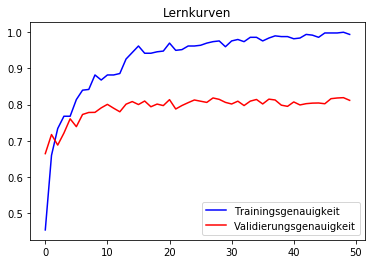

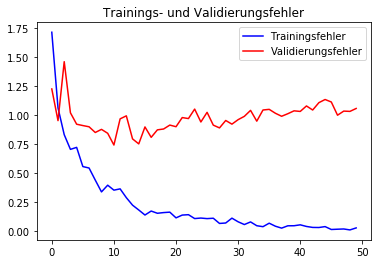

              precision    recall  f1-score   support

     T-shirt       0.76      0.80      0.78      1000
    Trousers       0.99      0.90      0.95      1000
    Pullover       0.67      0.72      0.69      1000
       Dress       0.83      0.77      0.80      1000
        Coat       0.68      0.80      0.73      1000
      Sandal       0.98      0.86      0.92      1000
       Shirt       0.55      0.45      0.49      1000
     Sneaker       0.89      0.92      0.91      1000
         Bag       0.90      0.95      0.92      1000
  Ankle-boot       0.88      0.95      0.91      1000

    accuracy                           0.81     10000
   macro avg       0.81      0.81      0.81     10000
weighted avg       0.81      0.81      0.81     10000



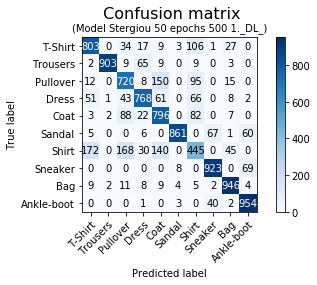

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/50
500/500 [==============================] - 3s 6ms/step - loss: 1.7567 - acc: 0.4720 - val_loss: 2.0314 - val_acc: 0.6445
Epoch 2/50
500/500 [==============================] - 1s 2ms/step - loss: 1.0687 - acc: 0.6580 - val_loss: 1.1391 - val_acc: 0.6970
Epoch 3/50
500/500 [==============================] - 1s 2ms/step - loss: 0.7959 - acc: 0.7360 - val_loss: 1.1283 - val_acc: 0.6890
Epoch 4/50
500/500 [==============================] - 1s 2ms/step - loss: 0.7524 - acc: 0.7440 - val_loss: 0.9202 - val_acc: 0.7384
Epoch 5/50
500/500 [==============================] - 1s 2ms/step - loss: 0.6085 - acc: 0.7920 - val_loss: 0.9191 - val_acc: 0.7420
Epoch 6/50
500/500 [==============================] - 1s 2ms/step - loss: 0.5354 - acc: 0.8080 - val_loss: 0.9095 - val_acc: 0.7253
Epoch 7/50
500/500 [==============================] - 1s

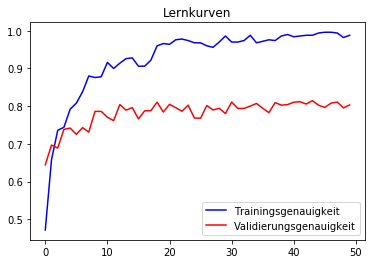

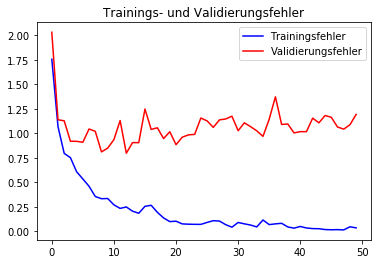

              precision    recall  f1-score   support

     T-shirt       0.73      0.82      0.77      1000
    Trousers       0.98      0.93      0.96      1000
    Pullover       0.75      0.49      0.59      1000
       Dress       0.86      0.78      0.82      1000
        Coat       0.60      0.84      0.70      1000
      Sandal       0.94      0.92      0.93      1000
       Shirt       0.52      0.46      0.49      1000
     Sneaker       0.92      0.88      0.90      1000
         Bag       0.90      0.95      0.92      1000
  Ankle-boot       0.87      0.97      0.92      1000

    accuracy                           0.80     10000
   macro avg       0.81      0.80      0.80     10000
weighted avg       0.81      0.80      0.80     10000



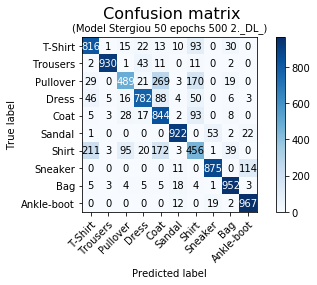

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/50
500/500 [==============================] - 3s 7ms/step - loss: 1.6246 - acc: 0.4980 - val_loss: 1.0054 - val_acc: 0.6861
Epoch 2/50
500/500 [==============================] - 1s 2ms/step - loss: 1.0353 - acc: 0.6620 - val_loss: 1.0666 - val_acc: 0.7095
Epoch 3/50
500/500 [==============================] - 1s 2ms/step - loss: 0.7965 - acc: 0.7100 - val_loss: 1.1923 - val_acc: 0.6818
Epoch 4/50
500/500 [==============================] - 1s 2ms/step - loss: 0.6777 - acc: 0.7560 - val_loss: 0.8532 - val_acc: 0.7731
Epoch 5/50
500/500 [==============================] - 1s 2ms/step - loss: 0.5127 - acc: 0.8120 - val_loss: 0.7985 - val_acc: 0.7742
Epoch 6/50
500/500 [==============================] - 1s 2ms/step - loss: 0.4970 - acc: 0.8200 - val_loss: 0.9153 - val_acc: 0.7698
Epoch 7/50
500/500 [==============================] - 1s

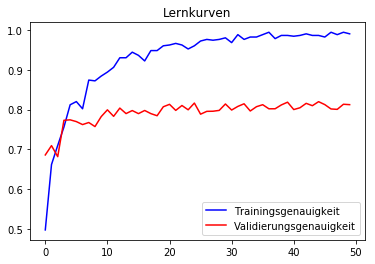

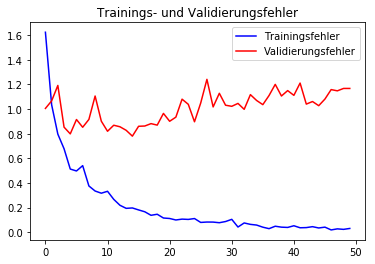

              precision    recall  f1-score   support

     T-shirt       0.76      0.82      0.79      1000
    Trousers       0.99      0.91      0.95      1000
    Pullover       0.62      0.76      0.68      1000
       Dress       0.83      0.79      0.81      1000
        Coat       0.66      0.79      0.72      1000
      Sandal       0.97      0.87      0.92      1000
       Shirt       0.63      0.35      0.45      1000
     Sneaker       0.86      0.94      0.90      1000
         Bag       0.90      0.96      0.93      1000
  Ankle-boot       0.92      0.94      0.93      1000

    accuracy                           0.81     10000
   macro avg       0.81      0.81      0.81     10000
weighted avg       0.81      0.81      0.81     10000



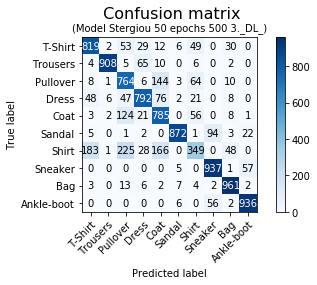

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/50
500/500 [==============================] - 4s 7ms/step - loss: 1.6921 - acc: 0.4620 - val_loss: 1.0625 - val_acc: 0.6962
Epoch 2/50
500/500 [==============================] - 1s 2ms/step - loss: 0.9789 - acc: 0.6760 - val_loss: 0.9549 - val_acc: 0.7177
Epoch 3/50
500/500 [==============================] - 1s 2ms/step - loss: 0.7669 - acc: 0.7260 - val_loss: 1.1970 - val_acc: 0.6738
Epoch 4/50
500/500 [==============================] - 1s 2ms/step - loss: 0.6176 - acc: 0.7740 - val_loss: 1.0736 - val_acc: 0.7155
Epoch 5/50
500/500 [==============================] - 1s 2ms/step - loss: 0.6425 - acc: 0.8120 - val_loss: 0.9841 - val_acc: 0.7287
Epoch 6/50
500/500 [==============================] - 1s 2ms/step - loss: 0.5879 - acc: 0.8220 - val_loss: 0.9514 - val_acc: 0.7415
Epoch 7/50
500/500 [==============================] - 1s

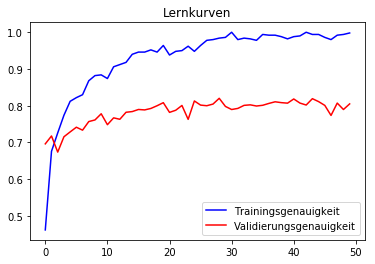

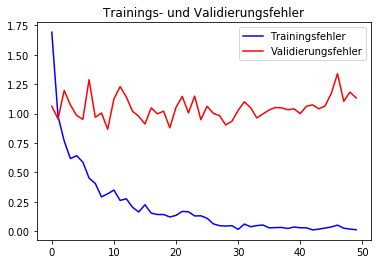

              precision    recall  f1-score   support

     T-shirt       0.84      0.69      0.75      1000
    Trousers       0.99      0.91      0.95      1000
    Pullover       0.70      0.62      0.66      1000
       Dress       0.79      0.86      0.82      1000
        Coat       0.61      0.83      0.70      1000
      Sandal       0.94      0.90      0.92      1000
       Shirt       0.53      0.49      0.51      1000
     Sneaker       0.91      0.90      0.90      1000
         Bag       0.93      0.90      0.91      1000
  Ankle-boot       0.88      0.95      0.92      1000

    accuracy                           0.81     10000
   macro avg       0.81      0.81      0.80     10000
weighted avg       0.81      0.81      0.80     10000



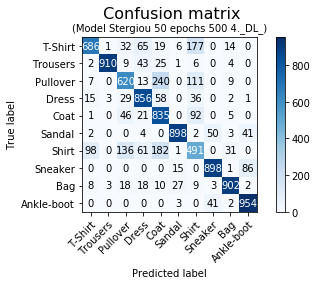

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/50
500/500 [==============================] - 4s 8ms/step - loss: 1.6836 - acc: 0.4600 - val_loss: 1.2947 - val_acc: 0.6277
Epoch 2/50
500/500 [==============================] - 1s 2ms/step - loss: 0.9547 - acc: 0.6980 - val_loss: 1.0602 - val_acc: 0.7105
Epoch 3/50
500/500 [==============================] - 1s 2ms/step - loss: 0.8865 - acc: 0.7060 - val_loss: 0.8406 - val_acc: 0.7543
Epoch 4/50
500/500 [==============================] - 1s 2ms/step - loss: 0.7272 - acc: 0.7320 - val_loss: 0.8393 - val_acc: 0.7683
Epoch 5/50
500/500 [==============================] - 1s 2ms/step - loss: 0.5278 - acc: 0.8020 - val_loss: 0.9516 - val_acc: 0.7551
Epoch 6/50
500/500 [==============================] - 1s 2ms/step - loss: 0.5077 - acc: 0.8220 - val_loss: 1.0366 - val_acc: 0.7347
Epoch 7/50
500/500 [==============================] - 1s

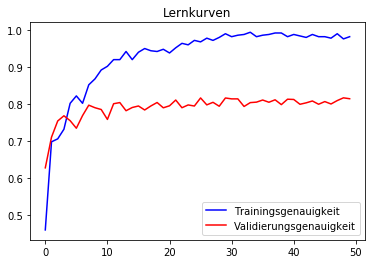

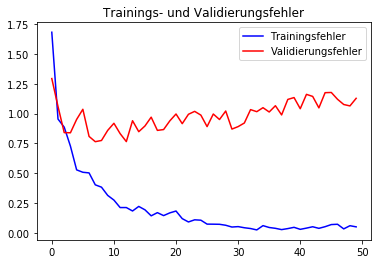

              precision    recall  f1-score   support

     T-shirt       0.82      0.76      0.79      1000
    Trousers       0.98      0.92      0.95      1000
    Pullover       0.75      0.54      0.63      1000
       Dress       0.71      0.90      0.79      1000
        Coat       0.64      0.80      0.71      1000
      Sandal       0.95      0.91      0.93      1000
       Shirt       0.58      0.49      0.53      1000
     Sneaker       0.89      0.93      0.91      1000
         Bag       0.92      0.95      0.94      1000
  Ankle-boot       0.93      0.94      0.93      1000

    accuracy                           0.81     10000
   macro avg       0.82      0.81      0.81     10000
weighted avg       0.82      0.81      0.81     10000



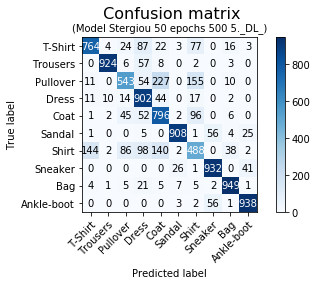

In [0]:
# 5mal Trainingsmenge 500
runningModels_A(1,5,X_tr_500, y_tr_500, X_test, y_test, 500)

In [0]:
downloader_opt_final(500)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/50
1000/1000 [==============================] - 5s 5ms/step - loss: 1.4154 - acc: 0.5650 - val_loss: 1.1744 - val_acc: 0.6924
Epoch 2/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.8657 - acc: 0.7300 - val_loss: 1.0921 - val_acc: 0.7306
Epoch 3/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.7916 - acc: 0.7300 - val_loss: 0.9591 - val_acc: 0.7549
Epoch 4/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.6955 - acc: 0.7780 - val_loss: 0.7456 - val_acc: 0.7871
Epoch 5/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.5804 - acc: 0.7950 - val_loss: 0.6421 - val_acc: 0.7911
Epoch 6/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.5551 - acc: 0.7870 - val_loss: 0.6464 - val_acc: 0.8101
Epoch 7/50
1000/1000 [=====================

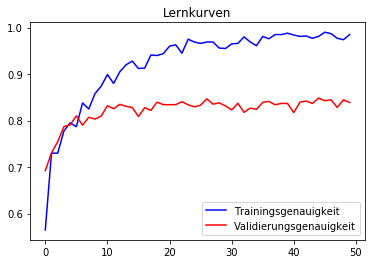

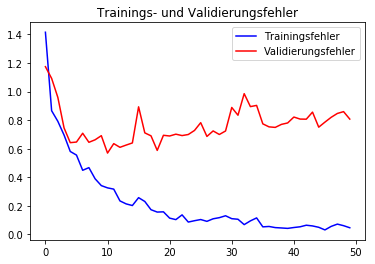

              precision    recall  f1-score   support

     T-shirt       0.83      0.78      0.80      1000
    Trousers       0.94      0.97      0.95      1000
    Pullover       0.73      0.76      0.74      1000
       Dress       0.81      0.88      0.84      1000
        Coat       0.64      0.86      0.73      1000
      Sandal       0.98      0.89      0.93      1000
       Shirt       0.71      0.41      0.52      1000
     Sneaker       0.89      0.95      0.92      1000
         Bag       0.96      0.96      0.96      1000
  Ankle-boot       0.93      0.94      0.94      1000

    accuracy                           0.84     10000
   macro avg       0.84      0.84      0.83     10000
weighted avg       0.84      0.84      0.83     10000



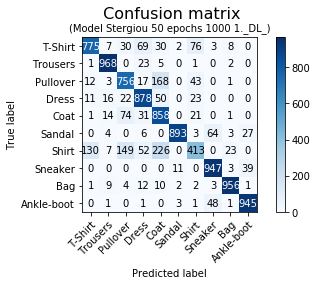

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/50
1000/1000 [==============================] - 5s 5ms/step - loss: 1.3586 - acc: 0.5750 - val_loss: 1.0858 - val_acc: 0.7089
Epoch 2/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.8391 - acc: 0.7190 - val_loss: 0.8969 - val_acc: 0.7672
Epoch 3/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.7497 - acc: 0.7630 - val_loss: 0.7782 - val_acc: 0.7810
Epoch 4/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.6949 - acc: 0.7590 - val_loss: 1.0512 - val_acc: 0.7530
Epoch 5/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.5428 - acc: 0.8020 - val_loss: 0.7024 - val_acc: 0.7943
Epoch 6/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.5253 - acc: 0.8160 - val_loss: 0.7008 - val_acc: 0.7959
Epoch 7/50
1000/1000 [=====================

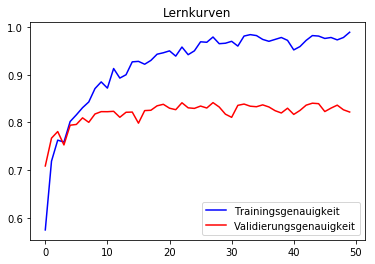

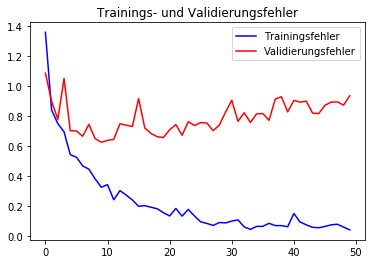

              precision    recall  f1-score   support

     T-shirt       0.83      0.74      0.78      1000
    Trousers       0.99      0.91      0.95      1000
    Pullover       0.74      0.73      0.73      1000
       Dress       0.72      0.92      0.81      1000
        Coat       0.74      0.74      0.74      1000
      Sandal       0.99      0.79      0.88      1000
       Shirt       0.58      0.53      0.55      1000
     Sneaker       0.88      0.92      0.90      1000
         Bag       0.95      0.96      0.95      1000
  Ankle-boot       0.85      0.98      0.91      1000

    accuracy                           0.82     10000
   macro avg       0.83      0.82      0.82     10000
weighted avg       0.83      0.82      0.82     10000



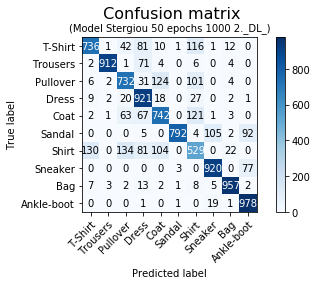

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/50
1000/1000 [==============================] - 5s 5ms/step - loss: 1.3812 - acc: 0.5720 - val_loss: 1.1767 - val_acc: 0.7016
Epoch 2/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.8675 - acc: 0.7160 - val_loss: 1.1497 - val_acc: 0.7156
Epoch 3/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.7074 - acc: 0.7520 - val_loss: 0.8205 - val_acc: 0.7475
Epoch 4/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.6158 - acc: 0.7860 - val_loss: 0.6735 - val_acc: 0.7825
Epoch 5/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.5576 - acc: 0.8080 - val_loss: 0.6398 - val_acc: 0.8057
Epoch 6/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.4714 - acc: 0.8320 - val_loss: 0.9005 - val_acc: 0.7945
Epoch 7/50
1000/1000 [=====================

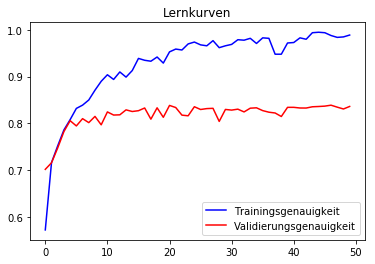

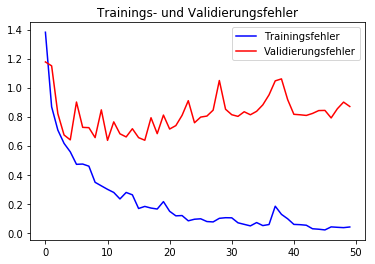

              precision    recall  f1-score   support

     T-shirt       0.79      0.82      0.80      1000
    Trousers       0.99      0.92      0.95      1000
    Pullover       0.73      0.73      0.73      1000
       Dress       0.78      0.88      0.82      1000
        Coat       0.72      0.75      0.73      1000
      Sandal       0.94      0.93      0.94      1000
       Shirt       0.61      0.50      0.55      1000
     Sneaker       0.93      0.92      0.92      1000
         Bag       0.94      0.96      0.95      1000
  Ankle-boot       0.92      0.95      0.94      1000

    accuracy                           0.84     10000
   macro avg       0.83      0.84      0.83     10000
weighted avg       0.83      0.84      0.83     10000



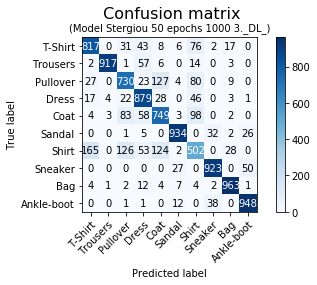

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/50
1000/1000 [==============================] - 6s 6ms/step - loss: 1.4214 - acc: 0.5500 - val_loss: 1.2751 - val_acc: 0.6587
Epoch 2/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.8269 - acc: 0.7150 - val_loss: 0.9687 - val_acc: 0.7427
Epoch 3/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.7743 - acc: 0.7330 - val_loss: 0.9599 - val_acc: 0.7315
Epoch 4/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.6060 - acc: 0.7990 - val_loss: 0.7589 - val_acc: 0.7873
Epoch 5/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.5780 - acc: 0.8150 - val_loss: 0.7778 - val_acc: 0.7823
Epoch 6/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.4838 - acc: 0.8280 - val_loss: 0.7575 - val_acc: 0.7771
Epoch 7/50
1000/1000 [=====================

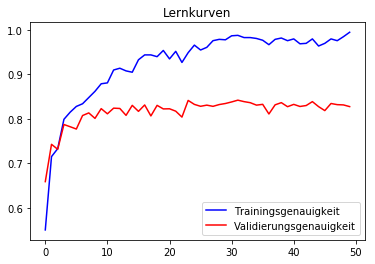

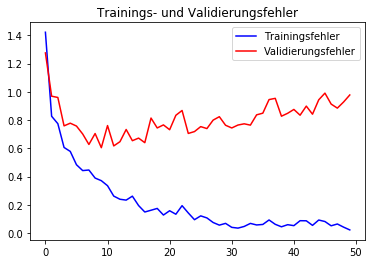

              precision    recall  f1-score   support

     T-shirt       0.89      0.64      0.74      1000
    Trousers       0.99      0.93      0.96      1000
    Pullover       0.74      0.69      0.71      1000
       Dress       0.78      0.89      0.83      1000
        Coat       0.66      0.82      0.73      1000
      Sandal       0.99      0.88      0.93      1000
       Shirt       0.57      0.57      0.57      1000
     Sneaker       0.90      0.94      0.92      1000
         Bag       0.92      0.96      0.94      1000
  Ankle-boot       0.91      0.96      0.93      1000

    accuracy                           0.83     10000
   macro avg       0.84      0.83      0.83     10000
weighted avg       0.84      0.83      0.83     10000



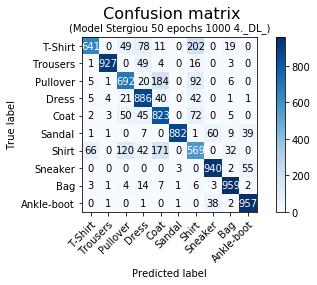

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/50
1000/1000 [==============================] - 6s 6ms/step - loss: 1.3872 - acc: 0.5550 - val_loss: 1.8827 - val_acc: 0.5851
Epoch 2/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.9131 - acc: 0.7060 - val_loss: 1.3139 - val_acc: 0.6325
Epoch 3/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.7728 - acc: 0.7510 - val_loss: 0.9321 - val_acc: 0.7483
Epoch 4/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.6461 - acc: 0.7550 - val_loss: 0.8730 - val_acc: 0.7596
Epoch 5/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.6460 - acc: 0.7840 - val_loss: 1.0255 - val_acc: 0.7015
Epoch 6/50
1000/1000 [==============================] - 1s 1ms/step - loss: 0.5895 - acc: 0.8010 - val_loss: 0.6492 - val_acc: 0.7979
Epoch 7/50
1000/1000 [=====================

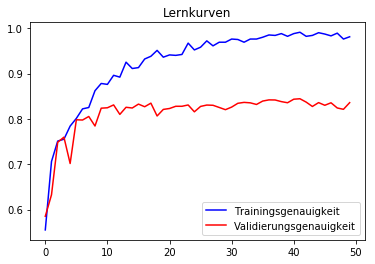

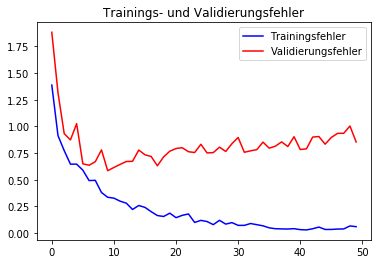

              precision    recall  f1-score   support

     T-shirt       0.79      0.79      0.79      1000
    Trousers       0.95      0.97      0.96      1000
    Pullover       0.67      0.77      0.72      1000
       Dress       0.86      0.81      0.83      1000
        Coat       0.73      0.67      0.70      1000
      Sandal       0.95      0.95      0.95      1000
       Shirt       0.58      0.55      0.57      1000
     Sneaker       0.93      0.94      0.94      1000
         Bag       0.93      0.97      0.95      1000
  Ankle-boot       0.96      0.94      0.95      1000

    accuracy                           0.84     10000
   macro avg       0.84      0.84      0.83     10000
weighted avg       0.84      0.84      0.83     10000



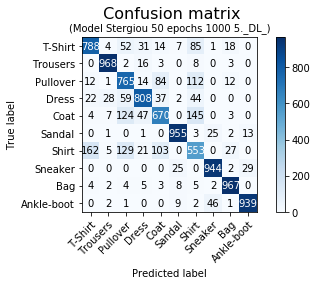

In [0]:
# 5mal Trainingsmenge 1000
runningModels_A(1,5,X_tr_1000, y_tr_1000, X_test, y_test, 1000)

In [0]:
downloader_opt_final(1000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/50
2000/2000 [==============================] - 7s 4ms/step - loss: 1.1398 - acc: 0.6450 - val_loss: 1.0929 - val_acc: 0.7150
Epoch 2/50
2000/2000 [==============================] - 2s 937us/step - loss: 0.7482 - acc: 0.7505 - val_loss: 0.8998 - val_acc: 0.7589
Epoch 3/50
2000/2000 [==============================] - 2s 943us/step - loss: 0.6332 - acc: 0.7870 - val_loss: 0.5582 - val_acc: 0.8206
Epoch 4/50
2000/2000 [==============================] - 2s 966us/step - loss: 0.5657 - acc: 0.8095 - val_loss: 0.8398 - val_acc: 0.7526
Epoch 5/50
2000/2000 [==============================] - 2s 949us/step - loss: 0.4959 - acc: 0.8270 - val_loss: 0.5052 - val_acc: 0.8366
Epoch 6/50
2000/2000 [==============================] - 2s 956us/step - loss: 0.4734 - acc: 0.8350 - val_loss: 0.7927 - val_acc: 0.7737
Epoch 7/50
2000/2000 [===========

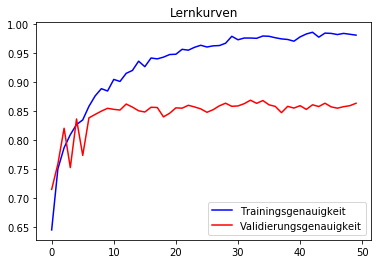

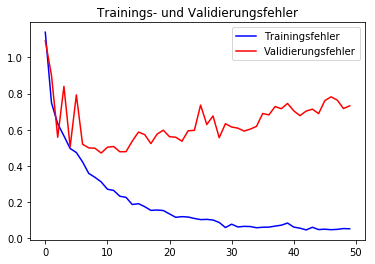

              precision    recall  f1-score   support

     T-shirt       0.78      0.85      0.81      1000
    Trousers       0.99      0.95      0.97      1000
    Pullover       0.83      0.74      0.78      1000
       Dress       0.82      0.89      0.86      1000
        Coat       0.71      0.85      0.77      1000
      Sandal       0.97      0.94      0.95      1000
       Shirt       0.72      0.55      0.62      1000
     Sneaker       0.92      0.95      0.93      1000
         Bag       0.96      0.97      0.96      1000
  Ankle-boot       0.93      0.95      0.94      1000

    accuracy                           0.86     10000
   macro avg       0.86      0.86      0.86     10000
weighted avg       0.86      0.86      0.86     10000



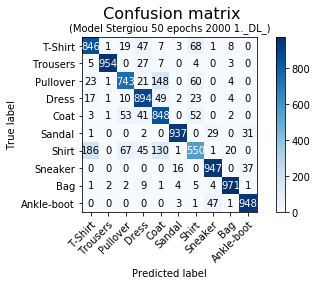

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/50
2000/2000 [==============================] - 7s 4ms/step - loss: 1.2302 - acc: 0.6195 - val_loss: 0.8698 - val_acc: 0.7532
Epoch 2/50
2000/2000 [==============================] - 2s 981us/step - loss: 0.7058 - acc: 0.7550 - val_loss: 0.6327 - val_acc: 0.8115
Epoch 3/50
2000/2000 [==============================] - 2s 961us/step - loss: 0.6524 - acc: 0.7700 - val_loss: 0.7679 - val_acc: 0.7853
Epoch 4/50
2000/2000 [==============================] - 2s 969us/step - loss: 0.5476 - acc: 0.8135 - val_loss: 0.9350 - val_acc: 0.7576
Epoch 5/50
2000/2000 [==============================] - 2s 951us/step - loss: 0.4868 - acc: 0.8385 - val_loss: 0.5398 - val_acc: 0.8370
Epoch 6/50
2000/2000 [==============================] - 2s 954us/step - loss: 0.3862 - acc: 0.8610 - val_loss: 0.5825 - val_acc: 0.8157
Epoch 7/50
2000/2000 [===========

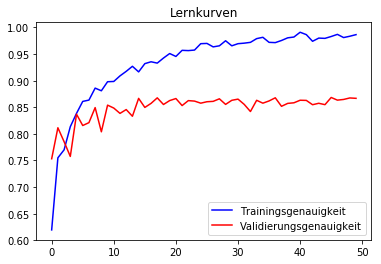

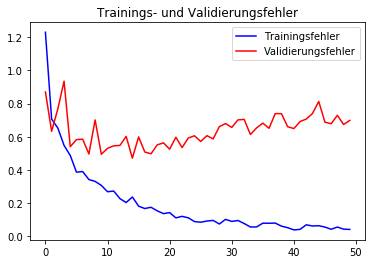

              precision    recall  f1-score   support

     T-shirt       0.85      0.76      0.80      1000
    Trousers       0.98      0.97      0.97      1000
    Pullover       0.80      0.83      0.81      1000
       Dress       0.80      0.92      0.85      1000
        Coat       0.78      0.76      0.77      1000
      Sandal       0.96      0.93      0.95      1000
       Shirt       0.67      0.64      0.65      1000
     Sneaker       0.93      0.94      0.94      1000
         Bag       0.98      0.96      0.97      1000
  Ankle-boot       0.93      0.96      0.94      1000

    accuracy                           0.87     10000
   macro avg       0.87      0.87      0.87     10000
weighted avg       0.87      0.87      0.87     10000



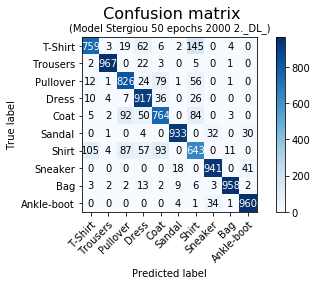

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/50
2000/2000 [==============================] - 8s 4ms/step - loss: 1.1949 - acc: 0.6265 - val_loss: 0.9652 - val_acc: 0.7585
Epoch 2/50
2000/2000 [==============================] - 2s 986us/step - loss: 0.7369 - acc: 0.7510 - val_loss: 0.9466 - val_acc: 0.7433
Epoch 3/50
2000/2000 [==============================] - 2s 971us/step - loss: 0.6357 - acc: 0.7790 - val_loss: 0.6446 - val_acc: 0.8071
Epoch 4/50
2000/2000 [==============================] - 2s 962us/step - loss: 0.5344 - acc: 0.8140 - val_loss: 0.5262 - val_acc: 0.8309
Epoch 5/50
2000/2000 [==============================] - 2s 971us/step - loss: 0.4505 - acc: 0.8420 - val_loss: 0.5320 - val_acc: 0.8397
Epoch 6/50
2000/2000 [==============================] - 2s 985us/step - loss: 0.4349 - acc: 0.8500 - val_loss: 0.5295 - val_acc: 0.8309
Epoch 7/50
2000/2000 [===========

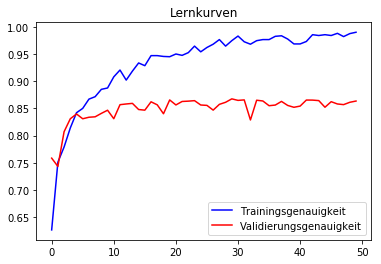

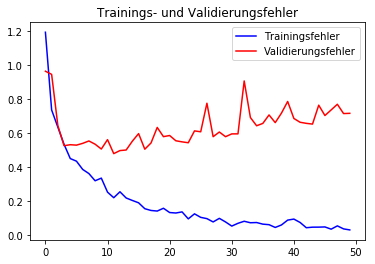

              precision    recall  f1-score   support

     T-shirt       0.85      0.79      0.82      1000
    Trousers       0.99      0.95      0.97      1000
    Pullover       0.72      0.88      0.79      1000
       Dress       0.87      0.88      0.87      1000
        Coat       0.82      0.69      0.74      1000
      Sandal       0.98      0.92      0.95      1000
       Shirt       0.64      0.66      0.65      1000
     Sneaker       0.89      0.97      0.93      1000
         Bag       0.96      0.96      0.96      1000
  Ankle-boot       0.96      0.93      0.95      1000

    accuracy                           0.86     10000
   macro avg       0.87      0.86      0.86     10000
weighted avg       0.87      0.86      0.86     10000



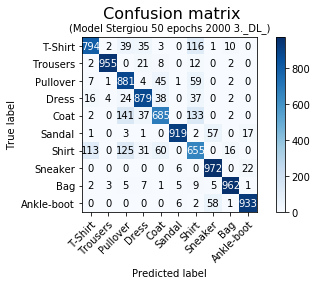

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/50
2000/2000 [==============================] - 8s 4ms/step - loss: 1.1959 - acc: 0.6275 - val_loss: 1.0834 - val_acc: 0.7145
Epoch 2/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.7355 - acc: 0.7545 - val_loss: 0.8526 - val_acc: 0.7516
Epoch 3/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.6638 - acc: 0.7810 - val_loss: 0.6615 - val_acc: 0.8029
Epoch 4/50
2000/2000 [==============================] - 2s 994us/step - loss: 0.5742 - acc: 0.8065 - val_loss: 0.7639 - val_acc: 0.7721
Epoch 5/50
2000/2000 [==============================] - 2s 986us/step - loss: 0.4919 - acc: 0.8225 - val_loss: 0.5449 - val_acc: 0.8300
Epoch 6/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.4231 - acc: 0.8535 - val_loss: 0.5446 - val_acc: 0.8289
Epoch 7/50
2000/2000 [=================

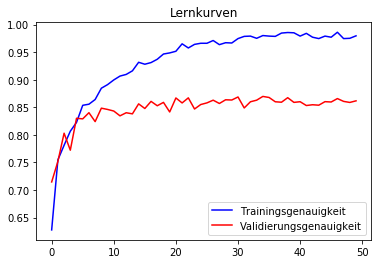

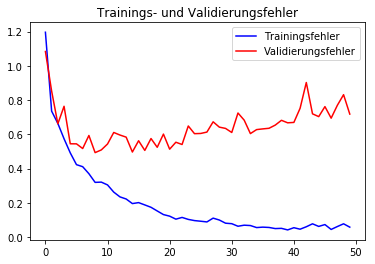

              precision    recall  f1-score   support

     T-shirt       0.87      0.76      0.81      1000
    Trousers       0.99      0.96      0.97      1000
    Pullover       0.85      0.70      0.77      1000
       Dress       0.84      0.89      0.87      1000
        Coat       0.76      0.81      0.78      1000
      Sandal       0.99      0.90      0.94      1000
       Shirt       0.59      0.72      0.65      1000
     Sneaker       0.91      0.96      0.93      1000
         Bag       0.98      0.96      0.97      1000
  Ankle-boot       0.92      0.95      0.94      1000

    accuracy                           0.86     10000
   macro avg       0.87      0.86      0.86     10000
weighted avg       0.87      0.86      0.86     10000



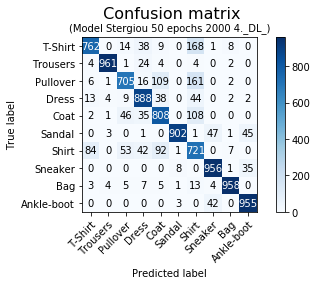

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/50
2000/2000 [==============================] - 9s 4ms/step - loss: 1.2166 - acc: 0.6285 - val_loss: 0.9805 - val_acc: 0.7354
Epoch 2/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.7349 - acc: 0.7550 - val_loss: 0.7671 - val_acc: 0.7580
Epoch 3/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.6155 - acc: 0.7955 - val_loss: 0.8442 - val_acc: 0.7515
Epoch 4/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.5424 - acc: 0.8190 - val_loss: 0.5800 - val_acc: 0.8268
Epoch 5/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.4687 - acc: 0.8400 - val_loss: 0.6537 - val_acc: 0.7960
Epoch 6/50
2000/2000 [==============================] - 2s 992us/step - loss: 0.4564 - acc: 0.8395 - val_loss: 0.5047 - val_acc: 0.8354
Epoch 7/50
2000/2000 [===================

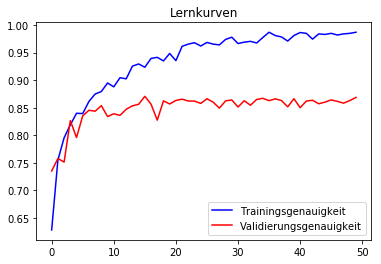

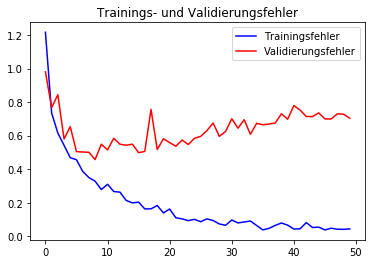

              precision    recall  f1-score   support

     T-shirt       0.79      0.86      0.82      1000
    Trousers       0.99      0.95      0.97      1000
    Pullover       0.80      0.79      0.79      1000
       Dress       0.87      0.87      0.87      1000
        Coat       0.77      0.78      0.78      1000
      Sandal       0.96      0.96      0.96      1000
       Shirt       0.65      0.63      0.64      1000
     Sneaker       0.94      0.94      0.94      1000
         Bag       0.96      0.96      0.96      1000
  Ankle-boot       0.95      0.95      0.95      1000

    accuracy                           0.87     10000
   macro avg       0.87      0.87      0.87     10000
weighted avg       0.87      0.87      0.87     10000



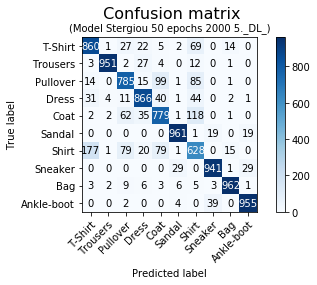

In [0]:
# 5mal Trainingsmenge 2000
runningModels_A(1,5,X_tr_2000, y_tr_2000, X_test, y_test, 2000)

In [0]:
downloader_opt_final(2000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/50
5000/5000 [==============================] - 11s 2ms/step - loss: 0.9574 - acc: 0.6820 - val_loss: 0.6113 - val_acc: 0.7994
Epoch 2/50
5000/5000 [==============================] - 3s 664us/step - loss: 0.6134 - acc: 0.7864 - val_loss: 0.5363 - val_acc: 0.8307
Epoch 3/50
5000/5000 [==============================] - 3s 671us/step - loss: 0.4983 - acc: 0.8206 - val_loss: 0.4970 - val_acc: 0.8331
Epoch 4/50
5000/5000 [==============================] - 3s 653us/step - loss: 0.4333 - acc: 0.8460 - val_loss: 0.4161 - val_acc: 0.8605
Epoch 5/50
5000/5000 [==============================] - 3s 660us/step - loss: 0.3858 - acc: 0.8626 - val_loss: 0.4996 - val_acc: 0.8404
Epoch 6/50
5000/5000 [==============================] - 3s 659us/step - loss: 0.3643 - acc: 0.8692 - val_loss: 0.4321 - val_acc: 0.8650
Epoch 7/50
5000/5000 [==========

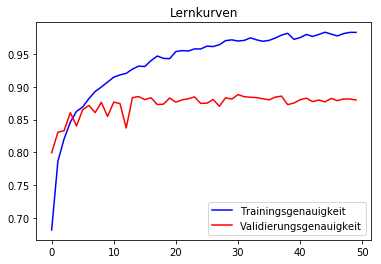

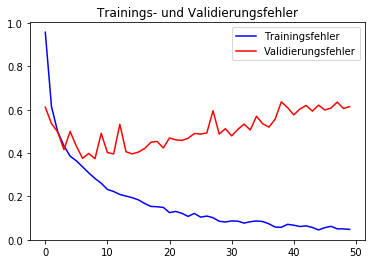

              precision    recall  f1-score   support

     T-shirt       0.86      0.78      0.82      1000
    Trousers       0.98      0.97      0.98      1000
    Pullover       0.76      0.87      0.81      1000
       Dress       0.87      0.87      0.87      1000
        Coat       0.84      0.77      0.80      1000
      Sandal       0.96      0.97      0.96      1000
       Shirt       0.68      0.70      0.69      1000
     Sneaker       0.94      0.95      0.95      1000
         Bag       0.96      0.97      0.97      1000
  Ankle-boot       0.96      0.95      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



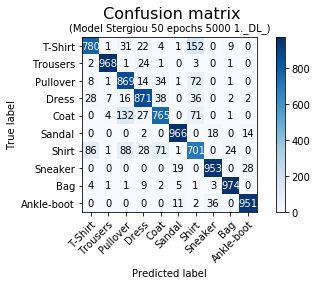

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/50
5000/5000 [==============================] - 11s 2ms/step - loss: 0.9277 - acc: 0.7106 - val_loss: 0.8251 - val_acc: 0.7730
Epoch 2/50
5000/5000 [==============================] - 3s 674us/step - loss: 0.6103 - acc: 0.7910 - val_loss: 0.5137 - val_acc: 0.8302
Epoch 3/50
5000/5000 [==============================] - 3s 674us/step - loss: 0.4814 - acc: 0.8322 - val_loss: 0.4896 - val_acc: 0.8384
Epoch 4/50
5000/5000 [==============================] - 3s 687us/step - loss: 0.4117 - acc: 0.8532 - val_loss: 0.5167 - val_acc: 0.8410
Epoch 5/50
5000/5000 [==============================] - 3s 679us/step - loss: 0.3845 - acc: 0.8642 - val_loss: 0.4552 - val_acc: 0.8479
Epoch 6/50
5000/5000 [==============================] - 3s 698us/step - loss: 0.3576 - acc: 0.8686 - val_loss: 0.4290 - val_acc: 0.8632
Epoch 7/50
5000/5000 [==========

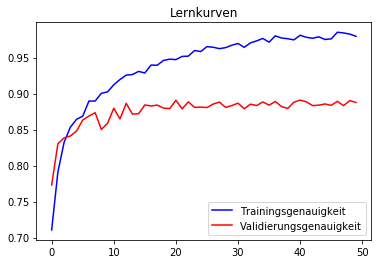

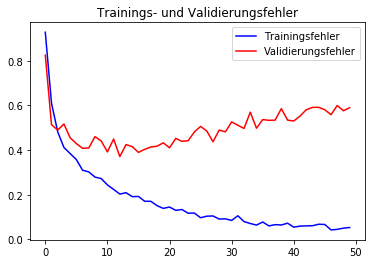

              precision    recall  f1-score   support

     T-shirt       0.85      0.82      0.84      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.84      0.82      0.83      1000
       Dress       0.85      0.93      0.89      1000
        Coat       0.78      0.86      0.82      1000
      Sandal       0.95      0.97      0.96      1000
       Shirt       0.74      0.63      0.68      1000
     Sneaker       0.95      0.94      0.94      1000
         Bag       0.98      0.97      0.97      1000
  Ankle-boot       0.95      0.96      0.96      1000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



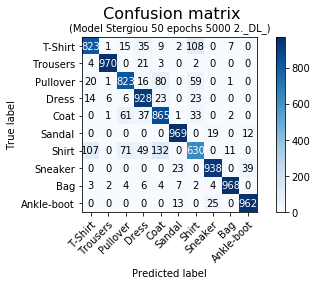

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/50
5000/5000 [==============================] - 11s 2ms/step - loss: 0.9298 - acc: 0.6954 - val_loss: 0.5282 - val_acc: 0.8205
Epoch 2/50
5000/5000 [==============================] - 3s 667us/step - loss: 0.5994 - acc: 0.7976 - val_loss: 0.6405 - val_acc: 0.8038
Epoch 3/50
5000/5000 [==============================] - 3s 661us/step - loss: 0.5217 - acc: 0.8176 - val_loss: 0.4874 - val_acc: 0.8429
Epoch 4/50
5000/5000 [==============================] - 3s 663us/step - loss: 0.4291 - acc: 0.8506 - val_loss: 0.4385 - val_acc: 0.8544
Epoch 5/50
5000/5000 [==============================] - 3s 671us/step - loss: 0.3777 - acc: 0.8658 - val_loss: 0.4151 - val_acc: 0.8640
Epoch 6/50
5000/5000 [==============================] - 3s 680us/step - loss: 0.3431 - acc: 0.8782 - val_loss: 0.4526 - val_acc: 0.8506
Epoch 7/50
5000/5000 [==========

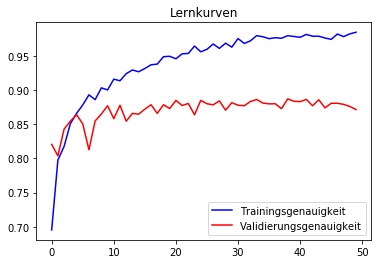

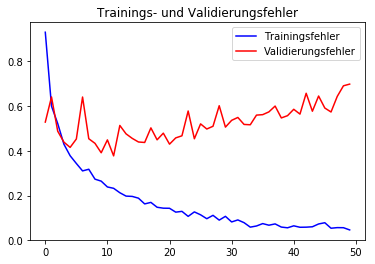

              precision    recall  f1-score   support

     T-shirt       0.86      0.68      0.76      1000
    Trousers       0.99      0.96      0.98      1000
    Pullover       0.80      0.83      0.82      1000
       Dress       0.87      0.87      0.87      1000
        Coat       0.77      0.84      0.81      1000
      Sandal       0.96      0.96      0.96      1000
       Shirt       0.63      0.71      0.67      1000
     Sneaker       0.92      0.96      0.94      1000
         Bag       0.98      0.96      0.97      1000
  Ankle-boot       0.97      0.93      0.95      1000

    accuracy                           0.87     10000
   macro avg       0.88      0.87      0.87     10000
weighted avg       0.88      0.87      0.87     10000



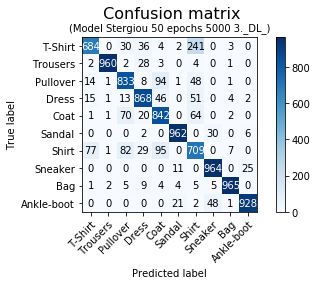

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/50
5000/5000 [==============================] - 12s 2ms/step - loss: 0.9283 - acc: 0.6926 - val_loss: 0.6977 - val_acc: 0.7889
Epoch 2/50
5000/5000 [==============================] - 3s 683us/step - loss: 0.6159 - acc: 0.7920 - val_loss: 0.6576 - val_acc: 0.7941
Epoch 3/50
5000/5000 [==============================] - 3s 670us/step - loss: 0.5055 - acc: 0.8264 - val_loss: 0.5968 - val_acc: 0.8135
Epoch 4/50
5000/5000 [==============================] - 3s 683us/step - loss: 0.4418 - acc: 0.8492 - val_loss: 0.4545 - val_acc: 0.8425
Epoch 5/50
5000/5000 [==============================] - 3s 672us/step - loss: 0.3841 - acc: 0.8672 - val_loss: 0.4009 - val_acc: 0.8685
Epoch 6/50
5000/5000 [==============================] - 3s 697us/step - loss: 0.3567 - acc: 0.8734 - val_loss: 0.4202 - val_acc: 0.8618
Epoch 7/50
5000/5000 [==========

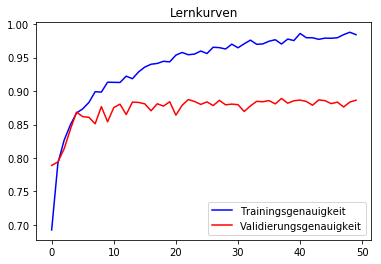

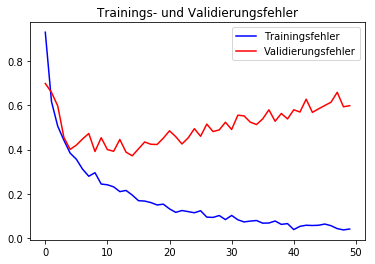

              precision    recall  f1-score   support

     T-shirt       0.81      0.84      0.83      1000
    Trousers       0.98      0.97      0.97      1000
    Pullover       0.80      0.87      0.83      1000
       Dress       0.89      0.86      0.88      1000
        Coat       0.83      0.82      0.82      1000
      Sandal       0.96      0.97      0.97      1000
       Shirt       0.72      0.67      0.70      1000
     Sneaker       0.95      0.94      0.94      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.95      0.95      0.95      1000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



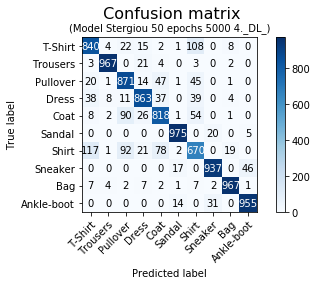

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/50
5000/5000 [==============================] - 12s 2ms/step - loss: 0.9384 - acc: 0.6898 - val_loss: 0.6414 - val_acc: 0.8003
Epoch 2/50
5000/5000 [==============================] - 3s 683us/step - loss: 0.6103 - acc: 0.7888 - val_loss: 0.5661 - val_acc: 0.8167
Epoch 3/50
5000/5000 [==============================] - 3s 689us/step - loss: 0.5051 - acc: 0.8318 - val_loss: 0.4651 - val_acc: 0.8487
Epoch 4/50
5000/5000 [==============================] - 3s 697us/step - loss: 0.4324 - acc: 0.8474 - val_loss: 0.4125 - val_acc: 0.8649
Epoch 5/50
5000/5000 [==============================] - 4s 712us/step - loss: 0.3935 - acc: 0.8600 - val_loss: 0.3872 - val_acc: 0.8703
Epoch 6/50
5000/5000 [==============================] - 3s 683us/step - loss: 0.3463 - acc: 0.8792 - val_loss: 0.4433 - val_acc: 0.8532
Epoch 7/50
5000/5000 [==========

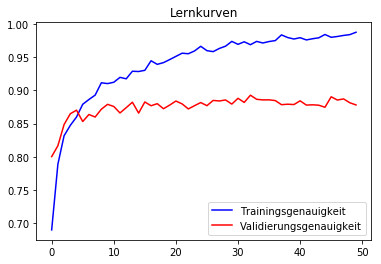

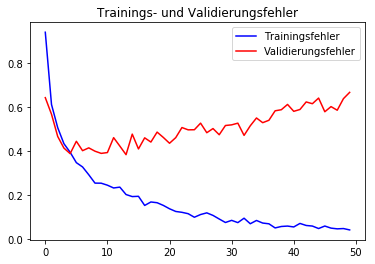

              precision    recall  f1-score   support

     T-shirt       0.89      0.74      0.81      1000
    Trousers       0.98      0.97      0.97      1000
    Pullover       0.89      0.73      0.80      1000
       Dress       0.88      0.87      0.87      1000
        Coat       0.71      0.91      0.80      1000
      Sandal       0.98      0.97      0.97      1000
       Shirt       0.66      0.70      0.68      1000
     Sneaker       0.95      0.96      0.95      1000
         Bag       0.98      0.96      0.97      1000
  Ankle-boot       0.95      0.96      0.96      1000

    accuracy                           0.88     10000
   macro avg       0.89      0.88      0.88     10000
weighted avg       0.89      0.88      0.88     10000



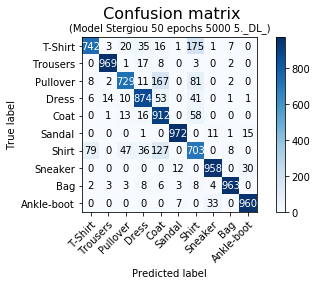

In [0]:
# 5mal Trainingsmenge 5000
runningModels_A(1,5,X_tr_5000, y_tr_5000, X_test, y_test, 5000)

In [0]:
downloader_opt_final(5000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 10000 samples, validate on 10000 samples
Epoch 1/50
10000/10000 [==============================] - 15s 2ms/step - loss: 0.7889 - acc: 0.7450 - val_loss: 0.5471 - val_acc: 0.8236
Epoch 2/50
10000/10000 [==============================] - 6s 580us/step - loss: 0.5075 - acc: 0.8233 - val_loss: 0.4161 - val_acc: 0.8564
Epoch 3/50
10000/10000 [==============================] - 6s 568us/step - loss: 0.4098 - acc: 0.8557 - val_loss: 0.3647 - val_acc: 0.8706
Epoch 4/50
10000/10000 [==============================] - 6s 577us/step - loss: 0.3708 - acc: 0.8679 - val_loss: 0.3942 - val_acc: 0.8633
Epoch 5/50
10000/10000 [==============================] - 6s 564us/step - loss: 0.3437 - acc: 0.8773 - val_loss: 0.3183 - val_acc: 0.8875
Epoch 6/50
10000/10000 [==============================] - 6s 565us/step - loss: 0.3129 - acc: 0.8879 - val_loss: 0.3781 - val_acc: 0.8663
Epoch 7/50
10000/10

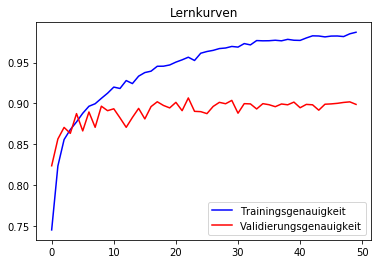

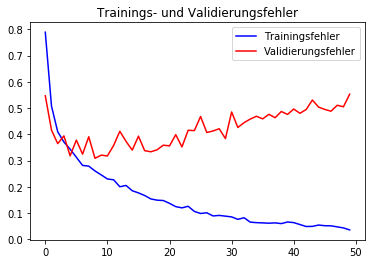

              precision    recall  f1-score   support

     T-shirt       0.86      0.85      0.86      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.82      0.89      0.85      1000
       Dress       0.85      0.94      0.89      1000
        Coat       0.87      0.78      0.82      1000
      Sandal       0.96      0.98      0.97      1000
       Shirt       0.74      0.72      0.73      1000
     Sneaker       0.93      0.97      0.95      1000
         Bag       0.99      0.97      0.98      1000
  Ankle-boot       0.98      0.92      0.95      1000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



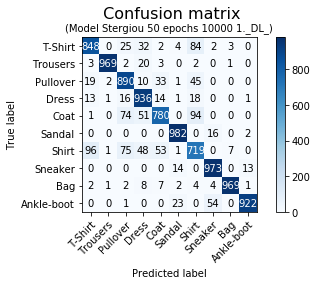

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 10000 samples, validate on 10000 samples
Epoch 1/50
10000/10000 [==============================] - 15s 2ms/step - loss: 0.7854 - acc: 0.7386 - val_loss: 0.4906 - val_acc: 0.8405
Epoch 2/50
10000/10000 [==============================] - 6s 566us/step - loss: 0.5112 - acc: 0.8258 - val_loss: 0.4299 - val_acc: 0.8560
Epoch 3/50
10000/10000 [==============================] - 6s 567us/step - loss: 0.4163 - acc: 0.8506 - val_loss: 0.3689 - val_acc: 0.8713
Epoch 4/50
10000/10000 [==============================] - 6s 573us/step - loss: 0.3627 - acc: 0.8692 - val_loss: 0.3477 - val_acc: 0.8794
Epoch 5/50
10000/10000 [==============================] - 6s 563us/step - loss: 0.3362 - acc: 0.8795 - val_loss: 0.3731 - val_acc: 0.8693
Epoch 6/50
10000/10000 [==============================] - 6s 570us/step - loss: 0.3184 - acc: 0.8850 - val_loss: 0.3365 - val_acc: 0.8799
Epoch 7/50
10000/10

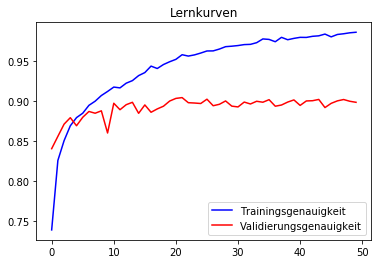

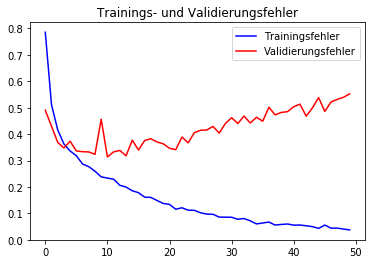

              precision    recall  f1-score   support

     T-shirt       0.89      0.79      0.84      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.84      0.86      0.85      1000
       Dress       0.88      0.91      0.89      1000
        Coat       0.82      0.88      0.85      1000
      Sandal       0.99      0.94      0.97      1000
       Shirt       0.73      0.75      0.74      1000
     Sneaker       0.95      0.95      0.95      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.93      0.98      0.95      1000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



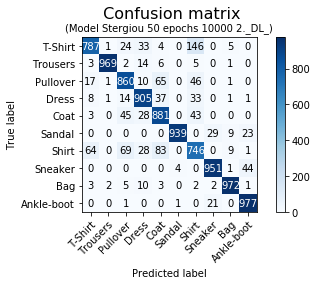

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 10000 samples, validate on 10000 samples
Epoch 1/50
10000/10000 [==============================] - 16s 2ms/step - loss: 0.8034 - acc: 0.7359 - val_loss: 0.5220 - val_acc: 0.8222
Epoch 2/50
10000/10000 [==============================] - 6s 593us/step - loss: 0.5037 - acc: 0.8263 - val_loss: 0.4294 - val_acc: 0.8556
Epoch 3/50
10000/10000 [==============================] - 6s 568us/step - loss: 0.4317 - acc: 0.8476 - val_loss: 0.4395 - val_acc: 0.8487
Epoch 4/50
10000/10000 [==============================] - 6s 578us/step - loss: 0.3801 - acc: 0.8643 - val_loss: 0.3872 - val_acc: 0.8669
Epoch 5/50
10000/10000 [==============================] - 6s 579us/step - loss: 0.3331 - acc: 0.8820 - val_loss: 0.3393 - val_acc: 0.8787
Epoch 6/50
10000/10000 [==============================] - 6s 574us/step - loss: 0.3164 - acc: 0.8915 - val_loss: 0.3143 - val_acc: 0.8924
Epoch 7/50
10000/10

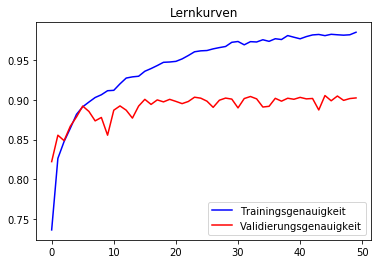

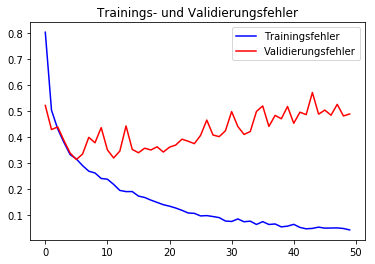

              precision    recall  f1-score   support

     T-shirt       0.90      0.80      0.85      1000
    Trousers       0.99      0.98      0.98      1000
    Pullover       0.84      0.88      0.86      1000
       Dress       0.87      0.92      0.89      1000
        Coat       0.84      0.86      0.85      1000
      Sandal       0.98      0.94      0.96      1000
       Shirt       0.74      0.74      0.74      1000
     Sneaker       0.91      0.98      0.94      1000
         Bag       0.97      0.98      0.98      1000
  Ankle-boot       0.97      0.95      0.96      1000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



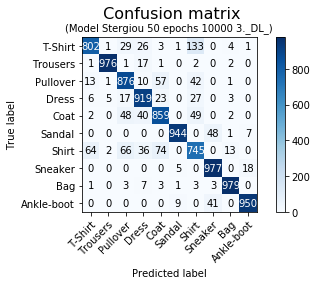

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 10000 samples, validate on 10000 samples
Epoch 1/50
10000/10000 [==============================] - 16s 2ms/step - loss: 0.7965 - acc: 0.7368 - val_loss: 0.7150 - val_acc: 0.7921
Epoch 2/50
10000/10000 [==============================] - 6s 587us/step - loss: 0.5139 - acc: 0.8225 - val_loss: 0.4101 - val_acc: 0.8609
Epoch 3/50
10000/10000 [==============================] - 6s 583us/step - loss: 0.4170 - acc: 0.8572 - val_loss: 0.4404 - val_acc: 0.8440
Epoch 4/50
10000/10000 [==============================] - 6s 617us/step - loss: 0.3761 - acc: 0.8681 - val_loss: 0.3254 - val_acc: 0.8858
Epoch 5/50
10000/10000 [==============================] - 6s 608us/step - loss: 0.3382 - acc: 0.8802 - val_loss: 0.3458 - val_acc: 0.8799
Epoch 6/50
10000/10000 [==============================] - 6s 591us/step - loss: 0.3121 - acc: 0.8883 - val_loss: 0.3795 - val_acc: 0.8757
Epoch 7/50
10000/10

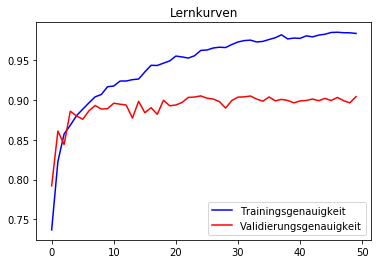

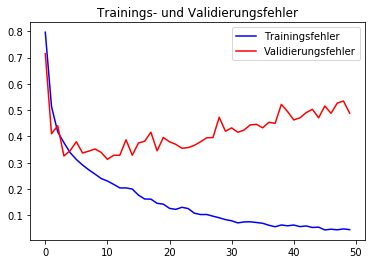

              precision    recall  f1-score   support

     T-shirt       0.87      0.83      0.85      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.86      0.87      0.86      1000
       Dress       0.87      0.92      0.89      1000
        Coat       0.86      0.83      0.85      1000
      Sandal       0.98      0.98      0.98      1000
       Shirt       0.74      0.76      0.75      1000
     Sneaker       0.95      0.95      0.95      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.96      0.96      0.96      1000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



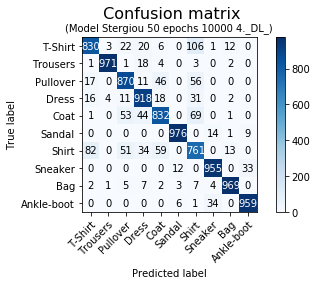

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 10000 samples, validate on 10000 samples
Epoch 1/50
10000/10000 [==============================] - 17s 2ms/step - loss: 0.8151 - acc: 0.7320 - val_loss: 0.5878 - val_acc: 0.8061
Epoch 2/50
10000/10000 [==============================] - 6s 585us/step - loss: 0.5086 - acc: 0.8231 - val_loss: 0.6373 - val_acc: 0.7992
Epoch 3/50
10000/10000 [==============================] - 6s 587us/step - loss: 0.4237 - acc: 0.8498 - val_loss: 0.3702 - val_acc: 0.8688
Epoch 4/50
10000/10000 [==============================] - 6s 587us/step - loss: 0.3805 - acc: 0.8661 - val_loss: 0.4537 - val_acc: 0.8408
Epoch 5/50
10000/10000 [==============================] - 6s 579us/step - loss: 0.3498 - acc: 0.8719 - val_loss: 0.3831 - val_acc: 0.8705
Epoch 6/50
10000/10000 [==============================] - 6s 598us/step - loss: 0.3171 - acc: 0.8870 - val_loss: 0.3414 - val_acc: 0.8811
Epoch 7/50
10000/10

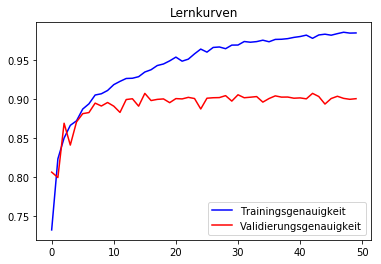

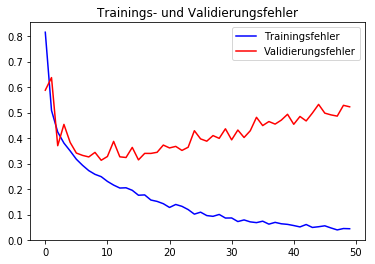

              precision    recall  f1-score   support

     T-shirt       0.91      0.79      0.85      1000
    Trousers       1.00      0.96      0.98      1000
    Pullover       0.89      0.84      0.86      1000
       Dress       0.88      0.91      0.90      1000
        Coat       0.84      0.82      0.83      1000
      Sandal       0.97      0.98      0.98      1000
       Shirt       0.67      0.81      0.73      1000
     Sneaker       0.94      0.97      0.95      1000
         Bag       0.99      0.97      0.98      1000
  Ankle-boot       0.97      0.94      0.96      1000

    accuracy                           0.90     10000
   macro avg       0.91      0.90      0.90     10000
weighted avg       0.91      0.90      0.90     10000



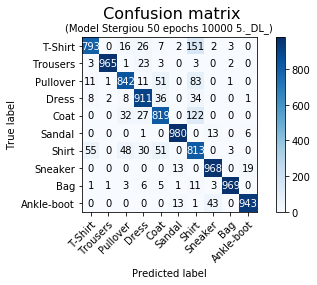

In [0]:
# 5mal Trainingsmenge 10000
runningModels_A(1,5,X_tr_10000, y_tr_10000, X_test, y_test, 10000)

In [0]:
downloader_opt_final(10000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 20000 samples, validate on 10000 samples
Epoch 1/50
20000/20000 [==============================] - 22s 1ms/step - loss: 0.6699 - acc: 0.7738 - val_loss: 0.4512 - val_acc: 0.8514
Epoch 2/50
20000/20000 [==============================] - 11s 527us/step - loss: 0.4184 - acc: 0.8498 - val_loss: 0.3834 - val_acc: 0.8656
Epoch 3/50
20000/20000 [==============================] - 10s 519us/step - loss: 0.3609 - acc: 0.8683 - val_loss: 0.3525 - val_acc: 0.8783
Epoch 4/50
20000/20000 [==============================] - 11s 528us/step - loss: 0.3252 - acc: 0.8841 - val_loss: 0.3070 - val_acc: 0.8931
Epoch 5/50
20000/20000 [==============================] - 11s 535us/step - loss: 0.3058 - acc: 0.8918 - val_loss: 0.2894 - val_acc: 0.8967
Epoch 6/50
20000/20000 [==============================] - 10s 523us/step - loss: 0.2806 - acc: 0.9014 - val_loss: 0.3319 - val_acc: 0.8867
Epoch 7/50
200

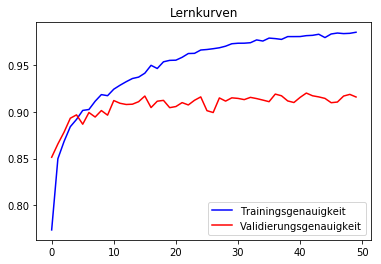

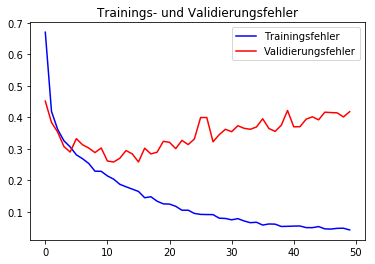

              precision    recall  f1-score   support

     T-shirt       0.87      0.86      0.87      1000
    Trousers       1.00      0.97      0.98      1000
    Pullover       0.89      0.87      0.88      1000
       Dress       0.89      0.94      0.91      1000
        Coat       0.86      0.89      0.87      1000
      Sandal       0.98      0.98      0.98      1000
       Shirt       0.76      0.75      0.75      1000
     Sneaker       0.95      0.98      0.96      1000
         Bag       0.99      0.98      0.98      1000
  Ankle-boot       0.98      0.95      0.96      1000

    accuracy                           0.92     10000
   macro avg       0.92      0.92      0.92     10000
weighted avg       0.92      0.92      0.92     10000



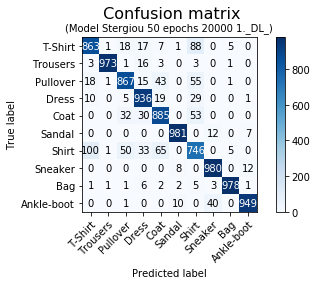

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 20000 samples, validate on 10000 samples
Epoch 1/50
20000/20000 [==============================] - 22s 1ms/step - loss: 0.6573 - acc: 0.7782 - val_loss: 0.4283 - val_acc: 0.8509
Epoch 2/50
20000/20000 [==============================] - 10s 521us/step - loss: 0.4214 - acc: 0.8519 - val_loss: 0.3951 - val_acc: 0.8547
Epoch 3/50
20000/20000 [==============================] - 11s 527us/step - loss: 0.3623 - acc: 0.8715 - val_loss: 0.3253 - val_acc: 0.8867
Epoch 4/50
20000/20000 [==============================] - 10s 516us/step - loss: 0.3226 - acc: 0.8867 - val_loss: 0.3044 - val_acc: 0.8910
Epoch 5/50
20000/20000 [==============================] - 10s 518us/step - loss: 0.3008 - acc: 0.8941 - val_loss: 0.3101 - val_acc: 0.8902
Epoch 6/50
20000/20000 [==============================] - 11s 527us/step - loss: 0.2850 - acc: 0.8958 - val_loss: 0.2826 - val_acc: 0.9000
Epoch 7/50
200

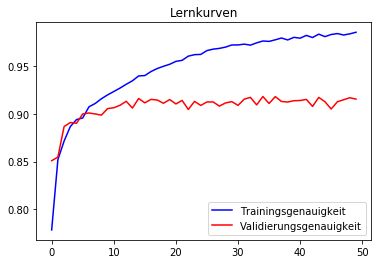

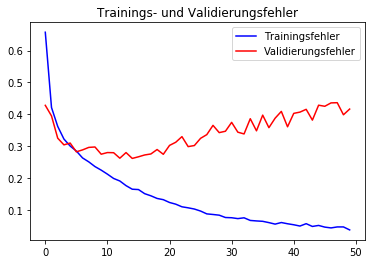

              precision    recall  f1-score   support

     T-shirt       0.90      0.84      0.87      1000
    Trousers       0.99      0.98      0.99      1000
    Pullover       0.84      0.90      0.87      1000
       Dress       0.91      0.92      0.92      1000
        Coat       0.86      0.86      0.86      1000
      Sandal       0.98      0.98      0.98      1000
       Shirt       0.77      0.77      0.77      1000
     Sneaker       0.95      0.97      0.96      1000
         Bag       0.98      0.98      0.98      1000
  Ankle-boot       0.97      0.95      0.96      1000

    accuracy                           0.92     10000
   macro avg       0.92      0.92      0.92     10000
weighted avg       0.92      0.92      0.92     10000



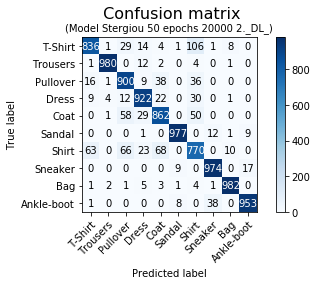

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 20000 samples, validate on 10000 samples
Epoch 1/50
20000/20000 [==============================] - 26s 1ms/step - loss: 0.6448 - acc: 0.7817 - val_loss: 0.4541 - val_acc: 0.8518
Epoch 2/50
20000/20000 [==============================] - 13s 629us/step - loss: 0.4107 - acc: 0.8570 - val_loss: 0.3584 - val_acc: 0.8744
Epoch 3/50
20000/20000 [==============================] - 13s 632us/step - loss: 0.3592 - acc: 0.8711 - val_loss: 0.2912 - val_acc: 0.8946
Epoch 4/50
20000/20000 [==============================] - 13s 638us/step - loss: 0.3197 - acc: 0.8853 - val_loss: 0.3443 - val_acc: 0.8830
Epoch 5/50
20000/20000 [==============================] - 13s 631us/step - loss: 0.2982 - acc: 0.8949 - val_loss: 0.3417 - val_acc: 0.8847
Epoch 6/50
20000/20000 [==============================] - 13s 650us/step - loss: 0.2787 - acc: 0.9011 - val_loss: 0.2766 - val_acc: 0.8965
Epoch 7/50
200

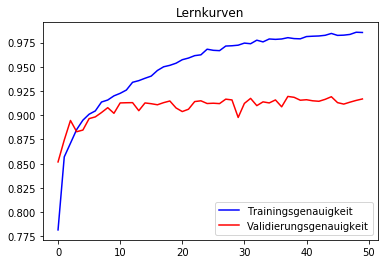

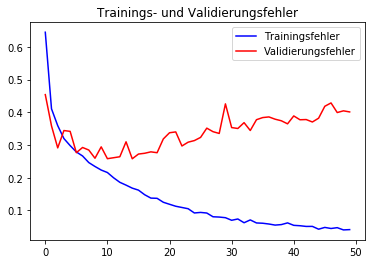

              precision    recall  f1-score   support

     T-shirt       0.87      0.87      0.87      1000
    Trousers       1.00      0.98      0.99      1000
    Pullover       0.87      0.88      0.87      1000
       Dress       0.92      0.92      0.92      1000
        Coat       0.86      0.89      0.87      1000
      Sandal       0.98      0.97      0.98      1000
       Shirt       0.78      0.74      0.76      1000
     Sneaker       0.93      0.99      0.96      1000
         Bag       0.98      0.98      0.98      1000
  Ankle-boot       0.99      0.94      0.96      1000

    accuracy                           0.92     10000
   macro avg       0.92      0.92      0.92     10000
weighted avg       0.92      0.92      0.92     10000



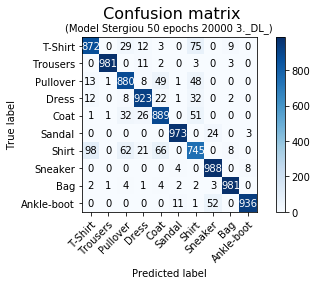

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 20000 samples, validate on 10000 samples
Epoch 1/50
20000/20000 [==============================] - 25s 1ms/step - loss: 0.6530 - acc: 0.7771 - val_loss: 0.4197 - val_acc: 0.8536
Epoch 2/50
20000/20000 [==============================] - 12s 622us/step - loss: 0.4228 - acc: 0.8524 - val_loss: 0.3424 - val_acc: 0.8749
Epoch 3/50
20000/20000 [==============================] - 14s 688us/step - loss: 0.3554 - acc: 0.8768 - val_loss: 0.3650 - val_acc: 0.8714
Epoch 4/50
20000/20000 [==============================] - 14s 686us/step - loss: 0.3238 - acc: 0.8848 - val_loss: 0.3118 - val_acc: 0.8885
Epoch 5/50
20000/20000 [==============================] - 12s 576us/step - loss: 0.2980 - acc: 0.8928 - val_loss: 0.2945 - val_acc: 0.8955
Epoch 6/50
20000/20000 [==============================] - 11s 560us/step - loss: 0.2790 - acc: 0.9002 - val_loss: 0.2919 - val_acc: 0.8961
Epoch 7/50
200

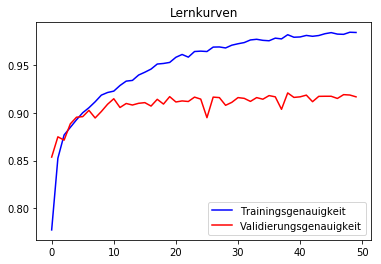

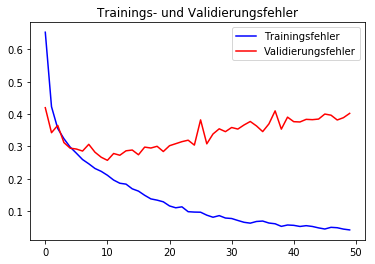

              precision    recall  f1-score   support

     T-shirt       0.87      0.86      0.87      1000
    Trousers       0.99      0.98      0.99      1000
    Pullover       0.85      0.90      0.87      1000
       Dress       0.91      0.92      0.92      1000
        Coat       0.84      0.90      0.87      1000
      Sandal       0.98      0.98      0.98      1000
       Shirt       0.80      0.72      0.76      1000
     Sneaker       0.97      0.96      0.96      1000
         Bag       0.99      0.97      0.98      1000
  Ankle-boot       0.95      0.98      0.97      1000

    accuracy                           0.92     10000
   macro avg       0.92      0.92      0.92     10000
weighted avg       0.92      0.92      0.92     10000



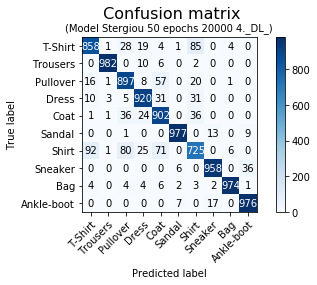

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 20000 samples, validate on 10000 samples
Epoch 1/50
20000/20000 [==============================] - 24s 1ms/step - loss: 0.6566 - acc: 0.7788 - val_loss: 0.5143 - val_acc: 0.8321
Epoch 2/50
20000/20000 [==============================] - 11s 546us/step - loss: 0.4158 - acc: 0.8541 - val_loss: 0.3632 - val_acc: 0.8718
Epoch 3/50
20000/20000 [==============================] - 11s 529us/step - loss: 0.3555 - acc: 0.8723 - val_loss: 0.3221 - val_acc: 0.8861
Epoch 4/50
20000/20000 [==============================] - 11s 535us/step - loss: 0.3247 - acc: 0.8845 - val_loss: 0.3285 - val_acc: 0.8885
Epoch 5/50
20000/20000 [==============================] - 11s 536us/step - loss: 0.2997 - acc: 0.8927 - val_loss: 0.2923 - val_acc: 0.8967
Epoch 6/50
20000/20000 [==============================] - 11s 553us/step - loss: 0.2834 - acc: 0.8985 - val_loss: 0.2980 - val_acc: 0.8927
Epoch 7/50
200

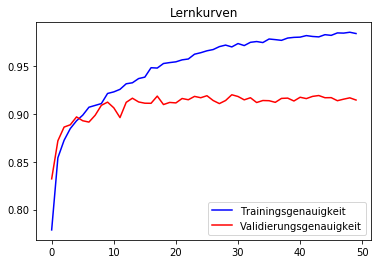

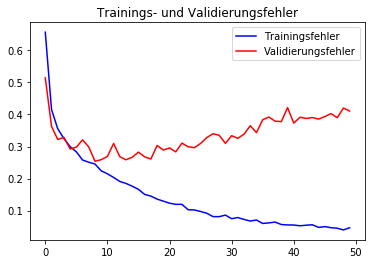

              precision    recall  f1-score   support

     T-shirt       0.86      0.88      0.87      1000
    Trousers       0.99      0.98      0.99      1000
    Pullover       0.85      0.90      0.87      1000
       Dress       0.91      0.93      0.92      1000
        Coat       0.88      0.84      0.86      1000
      Sandal       0.98      0.98      0.98      1000
       Shirt       0.76      0.74      0.75      1000
     Sneaker       0.96      0.97      0.96      1000
         Bag       0.99      0.97      0.98      1000
  Ankle-boot       0.97      0.96      0.96      1000

    accuracy                           0.91     10000
   macro avg       0.91      0.91      0.91     10000
weighted avg       0.91      0.91      0.91     10000



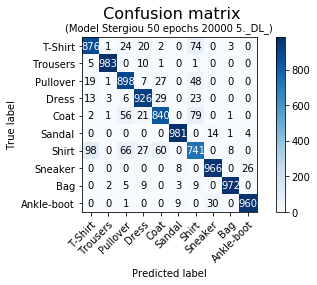

In [0]:
# 5mal Trainingsmenge 20000
runningModels_A(1,5,X_tr_20000, y_tr_20000, X_test, y_test, 20000)

In [0]:
downloader_opt_final(20000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 










Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 40000 samples, validate on 10000 samples
Epoch 1/50
40000/40000 [==============================] - 27s 680us/step - loss: 0.5416 - acc: 0.8139 - val_loss: 0.3263 - val_acc: 0.8882
Epoch 2/50
40000/40000 [==============================] - 17s 432us/step - loss: 0.3548 - acc: 0.8740 - val_loss: 0.3876 - val_acc: 0.8544
Epoch 3/50
40000/40000 [==============================] - 18s 455us/step - loss: 0.3165 - acc: 0.8879 - val_loss: 0.2677 - val_acc: 0.9035
Epoch 4/50
40000/40000 [==============================] - 18s 439us/step - loss: 0.2810 - acc: 0.8987 - val_loss: 0.3078 - val_acc: 0.8906
Epoch 5/50
40000/40000 [==============================] - 18s 448us

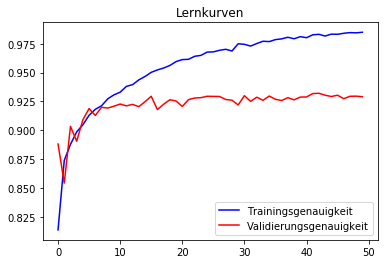

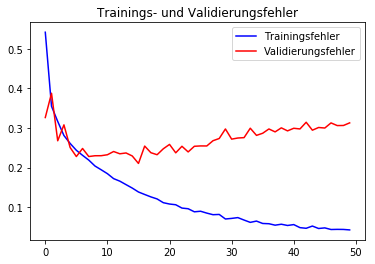

              precision    recall  f1-score   support

     T-shirt       0.88      0.88      0.88      1000
    Trousers       0.99      0.99      0.99      1000
    Pullover       0.86      0.92      0.89      1000
       Dress       0.94      0.94      0.94      1000
        Coat       0.88      0.88      0.88      1000
      Sandal       0.99      0.99      0.99      1000
       Shirt       0.82      0.75      0.78      1000
     Sneaker       0.97      0.97      0.97      1000
         Bag       0.99      0.99      0.99      1000
  Ankle-boot       0.98      0.97      0.97      1000

    accuracy                           0.93     10000
   macro avg       0.93      0.93      0.93     10000
weighted avg       0.93      0.93      0.93     10000



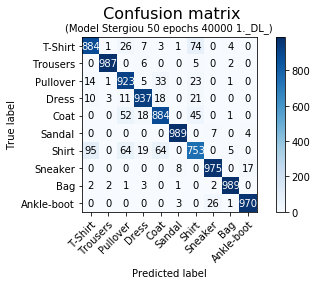

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 40000 samples, validate on 10000 samples
Epoch 1/50
40000/40000 [==============================] - 20s 504us/step - loss: 0.5449 - acc: 0.8130 - val_loss: 0.3964 - val_acc: 0.8590
Epoch 2/50
40000/40000 [==============================] - 19s 465us/step - loss: 0.3531 - acc: 0.8733 - val_loss: 0.3500 - val_acc: 0.8767
Epoch 3/50
40000/40000 [==============================] - 18s 457us/step - loss: 0.3104 - acc: 0.8895 - val_loss: 0.2684 - val_acc: 0.9039
Epoch 4/50
40000/40000 [==============================] - 18s 453us/step - loss: 0.2822 - acc: 0.8999 - val_loss: 0.2813 - val_acc: 0.8987
Epoch 5/50
40000/40000 [==============================] - 19s 464us/step - loss: 0.2661 - acc: 0.9038 - val_loss: 0.2608 - val_acc: 0.9082
Epoch 6/50
40000/40000 [==============================] - 19s 468us/step - loss: 0.2455 - acc: 0.9125 - val_loss: 0.2625 - val_acc: 0.9039
Epoch 7/50
4

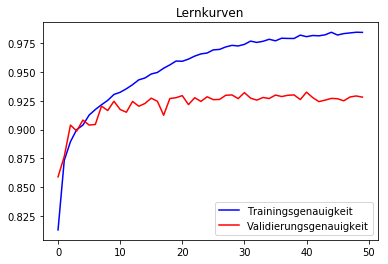

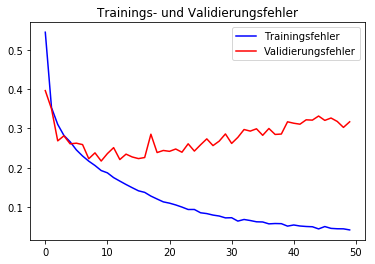

              precision    recall  f1-score   support

     T-shirt       0.89      0.88      0.88      1000
    Trousers       1.00      0.98      0.99      1000
    Pullover       0.94      0.84      0.89      1000
       Dress       0.93      0.94      0.94      1000
        Coat       0.88      0.91      0.90      1000
      Sandal       0.99      0.98      0.98      1000
       Shirt       0.75      0.81      0.78      1000
     Sneaker       0.96      0.98      0.97      1000
         Bag       0.98      0.99      0.98      1000
  Ankle-boot       0.98      0.96      0.97      1000

    accuracy                           0.93     10000
   macro avg       0.93      0.93      0.93     10000
weighted avg       0.93      0.93      0.93     10000



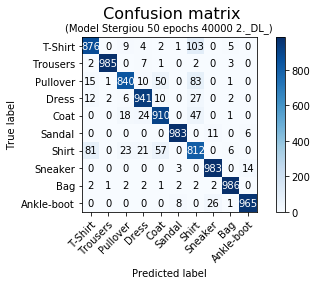

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 40000 samples, validate on 10000 samples
Epoch 1/50
40000/40000 [==============================] - 19s 486us/step - loss: 0.5385 - acc: 0.8149 - val_loss: 0.3633 - val_acc: 0.8720
Epoch 2/50
40000/40000 [==============================] - 18s 441us/step - loss: 0.3553 - acc: 0.8718 - val_loss: 0.3100 - val_acc: 0.8926
Epoch 3/50
40000/40000 [==============================] - 17s 426us/step - loss: 0.3155 - acc: 0.8876 - val_loss: 0.2921 - val_acc: 0.8962
Epoch 4/50
40000/40000 [==============================] - 18s 446us/step - loss: 0.2868 - acc: 0.8963 - val_loss: 0.2721 - val_acc: 0.9077
Epoch 5/50
40000/40000 [==============================] - 18s 443us/step - loss: 0.2649 - acc: 0.9062 - val_loss: 0.2392 - val_acc: 0.9105
Epoch 6/50
40000/40000 [==============================] - 18s 450us/step - loss: 0.2480 - acc: 0.9113 - val_loss: 0.2589 - val_acc: 0.9098
Epoch 7/50
4

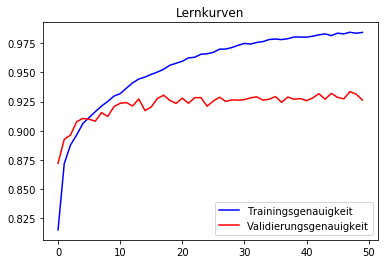

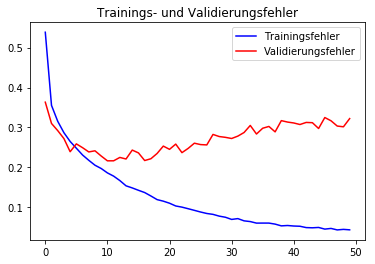

              precision    recall  f1-score   support

     T-shirt       0.90      0.84      0.87      1000
    Trousers       1.00      0.98      0.99      1000
    Pullover       0.92      0.87      0.90      1000
       Dress       0.93      0.92      0.93      1000
        Coat       0.85      0.93      0.89      1000
      Sandal       0.98      0.99      0.99      1000
       Shirt       0.77      0.81      0.79      1000
     Sneaker       0.97      0.97      0.97      1000
         Bag       0.98      0.98      0.98      1000
  Ankle-boot       0.97      0.96      0.97      1000

    accuracy                           0.93     10000
   macro avg       0.93      0.93      0.93     10000
weighted avg       0.93      0.93      0.93     10000



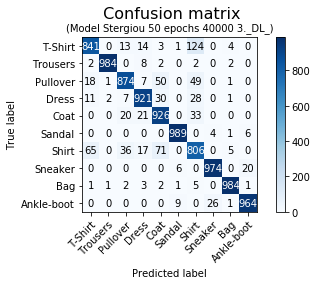

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 40000 samples, validate on 10000 samples
Epoch 1/50
40000/40000 [==============================] - 20s 501us/step - loss: 0.5427 - acc: 0.8126 - val_loss: 0.3461 - val_acc: 0.8686
Epoch 2/50
40000/40000 [==============================] - 18s 453us/step - loss: 0.3534 - acc: 0.8722 - val_loss: 0.3421 - val_acc: 0.8812
Epoch 3/50
40000/40000 [==============================] - 18s 443us/step - loss: 0.3135 - acc: 0.8864 - val_loss: 0.2937 - val_acc: 0.8911
Epoch 4/50
40000/40000 [==============================] - 18s 454us/step - loss: 0.2821 - acc: 0.9001 - val_loss: 0.2630 - val_acc: 0.9046
Epoch 5/50
40000/40000 [==============================] - 18s 438us/step - loss: 0.2633 - acc: 0.9035 - val_loss: 0.2950 - val_acc: 0.8979
Epoch 6/50
40000/40000 [==============================] - 18s 448us/step - loss: 0.2449 - acc: 0.9113 - val_loss: 0.2544 - val_acc: 0.9092
Epoch 7/50
4

In [0]:
# 5mal Trainingsmenge 40000
runningModels_A(1,5,X_tr_40000, y_tr_40000, X_test, y_test, 40000)

In [0]:
downloader_opt_final(40000)

KeyboardInterrupt: ignored

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 60000 samples, validate on 10000 samples
Epoch 1/50
60000/60000 [==============================] - 29s 487us/step - loss: 0.4813 - acc: 0.8342 - val_loss: 0.3125 - val_acc: 0.8875
Epoch 2/50
60000/60000 [==============================] - 27s 448us/step - loss: 0.3268 - acc: 0.8828 - val_loss: 0.2697 - val_acc: 0.9032
Epoch 3/50
60000/60000 [==============================] - 26s 437us/step - loss: 0.2866 - acc: 0.8965 - val_loss: 0.2747 - val_acc: 0.9036
Epoch 4/50
60000/60000 [==============================] - 27s 448us/step - loss: 0.2632 - acc: 0.9063 - val_loss: 0.3451 - val_acc: 0.8840
Epoch 5/50
60000/60000 [==============================] - 26s 432us/step - loss: 0.2420 - acc: 0.9120 - val_loss: 0.2249 - val_acc: 0.9191
Epoch 6/50
60000/60000 [==============================] - 27s 451us/step - loss: 0.2267 - acc: 0.9187 - val_loss: 0.2206 - val_acc: 0.9196
Epoch 7/50
6

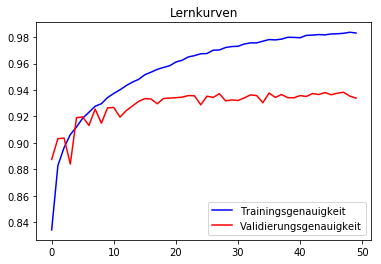

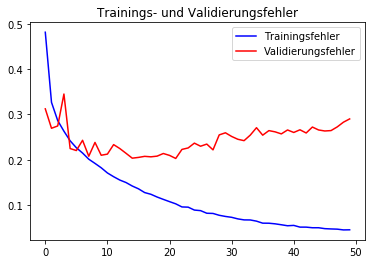

              precision    recall  f1-score   support

     T-shirt       0.87      0.90      0.88      1000
    Trousers       1.00      0.99      0.99      1000
    Pullover       0.86      0.94      0.90      1000
       Dress       0.95      0.91      0.93      1000
        Coat       0.88      0.92      0.90      1000
      Sandal       0.99      0.99      0.99      1000
       Shirt       0.85      0.75      0.80      1000
     Sneaker       0.97      0.97      0.97      1000
         Bag       0.99      0.99      0.99      1000
  Ankle-boot       0.97      0.98      0.98      1000

    accuracy                           0.93     10000
   macro avg       0.93      0.93      0.93     10000
weighted avg       0.93      0.93      0.93     10000



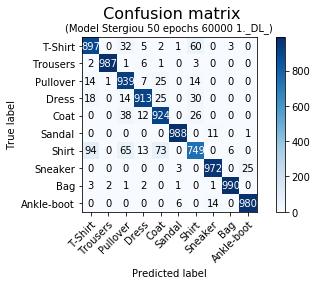

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 60000 samples, validate on 10000 samples
Epoch 1/50
60000/60000 [==============================] - 31s 513us/step - loss: 0.4868 - acc: 0.8305 - val_loss: 0.3180 - val_acc: 0.8876
Epoch 2/50
60000/60000 [==============================] - 27s 453us/step - loss: 0.3259 - acc: 0.8826 - val_loss: 0.3017 - val_acc: 0.8914
Epoch 3/50
60000/60000 [==============================] - 26s 437us/step - loss: 0.2907 - acc: 0.8966 - val_loss: 0.2625 - val_acc: 0.9013
Epoch 4/50
60000/60000 [==============================] - 27s 447us/step - loss: 0.2638 - acc: 0.9064 - val_loss: 0.2717 - val_acc: 0.9022
Epoch 5/50
60000/60000 [==============================] - 26s 439us/step - loss: 0.2447 - acc: 0.9129 - val_loss: 0.2218 - val_acc: 0.9181
Epoch 6/50
60000/60000 [==============================] - 28s 459us/step - loss: 0.2254 - acc: 0.9184 - val_loss: 0.2439 - val_acc: 0.9148
Epoch 7/50
6

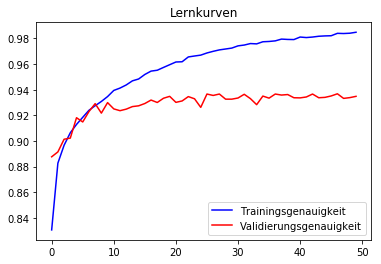

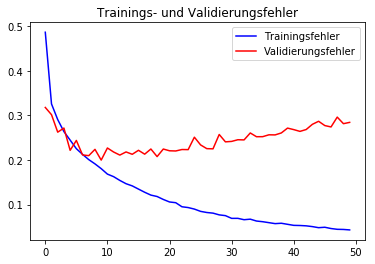

              precision    recall  f1-score   support

     T-shirt       0.92      0.85      0.88      1000
    Trousers       1.00      0.99      0.99      1000
    Pullover       0.93      0.89      0.91      1000
       Dress       0.94      0.94      0.94      1000
        Coat       0.88      0.93      0.91      1000
      Sandal       0.99      0.98      0.99      1000
       Shirt       0.77      0.83      0.80      1000
     Sneaker       0.96      0.98      0.97      1000
         Bag       0.99      0.98      0.99      1000
  Ankle-boot       0.98      0.97      0.97      1000

    accuracy                           0.93     10000
   macro avg       0.94      0.93      0.94     10000
weighted avg       0.94      0.93      0.94     10000



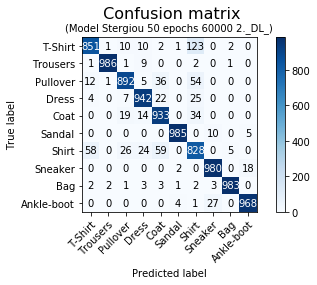

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 60000 samples, validate on 10000 samples
Epoch 1/50
60000/60000 [==============================] - 30s 503us/step - loss: 0.4824 - acc: 0.8331 - val_loss: 0.3702 - val_acc: 0.8571
Epoch 2/50
60000/60000 [==============================] - 26s 440us/step - loss: 0.3244 - acc: 0.8833 - val_loss: 0.3416 - val_acc: 0.8735
Epoch 3/50
60000/60000 [==============================] - 27s 446us/step - loss: 0.2849 - acc: 0.8977 - val_loss: 0.2566 - val_acc: 0.9098
Epoch 4/50
60000/60000 [==============================] - 26s 433us/step - loss: 0.2620 - acc: 0.9054 - val_loss: 0.2445 - val_acc: 0.9138
Epoch 5/50
60000/60000 [==============================] - 26s 442us/step - loss: 0.2435 - acc: 0.9128 - val_loss: 0.2390 - val_acc: 0.9138
Epoch 6/50
60000/60000 [==============================] - 27s 452us/step - loss: 0.2258 - acc: 0.9183 - val_loss: 0.2268 - val_acc: 0.9193
Epoch 7/50
6

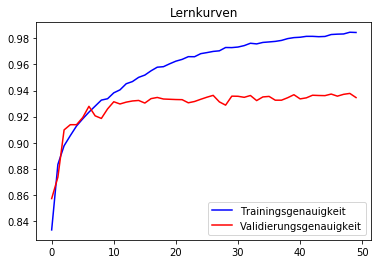

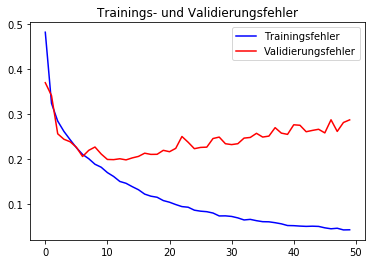

              precision    recall  f1-score   support

     T-shirt       0.91      0.87      0.89      1000
    Trousers       0.99      0.99      0.99      1000
    Pullover       0.93      0.88      0.90      1000
       Dress       0.94      0.93      0.94      1000
        Coat       0.88      0.93      0.90      1000
      Sandal       0.99      0.98      0.98      1000
       Shirt       0.79      0.83      0.81      1000
     Sneaker       0.96      0.98      0.97      1000
         Bag       0.99      0.99      0.99      1000
  Ankle-boot       0.98      0.97      0.97      1000

    accuracy                           0.93     10000
   macro avg       0.94      0.93      0.93     10000
weighted avg       0.94      0.93      0.93     10000



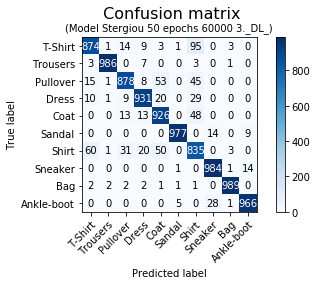

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 60000 samples, validate on 10000 samples
Epoch 1/50
60000/60000 [==============================] - 31s 516us/step - loss: 0.4851 - acc: 0.8302 - val_loss: 0.3791 - val_acc: 0.8628
Epoch 2/50
60000/60000 [==============================] - 26s 441us/step - loss: 0.3270 - acc: 0.8826 - val_loss: 0.2915 - val_acc: 0.8939
Epoch 3/50
60000/60000 [==============================] - 27s 444us/step - loss: 0.2844 - acc: 0.8977 - val_loss: 0.2552 - val_acc: 0.9071
Epoch 4/50
60000/60000 [==============================] - 27s 446us/step - loss: 0.2609 - acc: 0.9055 - val_loss: 0.2351 - val_acc: 0.9149
Epoch 5/50
60000/60000 [==============================] - 27s 447us/step - loss: 0.2408 - acc: 0.9135 - val_loss: 0.2245 - val_acc: 0.9191
Epoch 6/50
60000/60000 [==============================] - 26s 433us/step - loss: 0.2246 - acc: 0.9182 - val_loss: 0.2399 - val_acc: 0.9174
Epoch 7/50
6

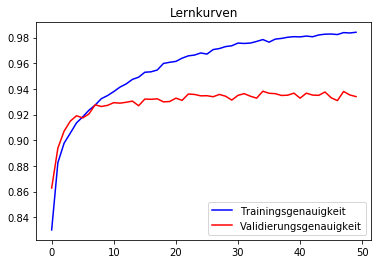

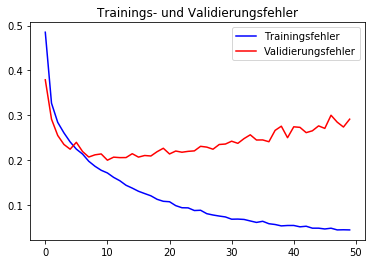

              precision    recall  f1-score   support

     T-shirt       0.89      0.89      0.89      1000
    Trousers       1.00      0.98      0.99      1000
    Pullover       0.93      0.88      0.91      1000
       Dress       0.93      0.95      0.94      1000
        Coat       0.93      0.87      0.90      1000
      Sandal       0.99      0.98      0.99      1000
       Shirt       0.76      0.84      0.80      1000
     Sneaker       0.96      0.98      0.97      1000
         Bag       0.99      0.99      0.99      1000
  Ankle-boot       0.97      0.97      0.97      1000

    accuracy                           0.93     10000
   macro avg       0.94      0.93      0.93     10000
weighted avg       0.94      0.93      0.93     10000



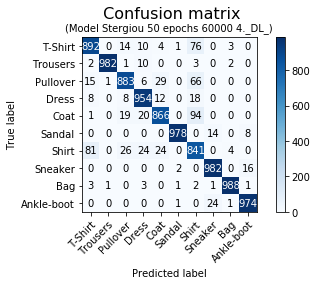

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 60000 samples, validate on 10000 samples
Epoch 1/50
60000/60000 [==============================] - 31s 524us/step - loss: 0.4913 - acc: 0.8290 - val_loss: 0.3119 - val_acc: 0.8895
Epoch 2/50
60000/60000 [==============================] - 27s 449us/step - loss: 0.3270 - acc: 0.8829 - val_loss: 0.2910 - val_acc: 0.8918
Epoch 3/50
60000/60000 [==============================] - 27s 445us/step - loss: 0.2894 - acc: 0.8961 - val_loss: 0.2570 - val_acc: 0.9058
Epoch 4/50
60000/60000 [==============================] - 27s 446us/step - loss: 0.2665 - acc: 0.9034 - val_loss: 0.2449 - val_acc: 0.9144
Epoch 5/50
60000/60000 [==============================] - 27s 457us/step - loss: 0.2456 - acc: 0.9108 - val_loss: 0.2425 - val_acc: 0.9134
Epoch 6/50
60000/60000 [==============================] - 27s 442us/step - loss: 0.2280 - acc: 0.9179 - val_loss: 0.2264 - val_acc: 0.9191
Epoch 7/50
6

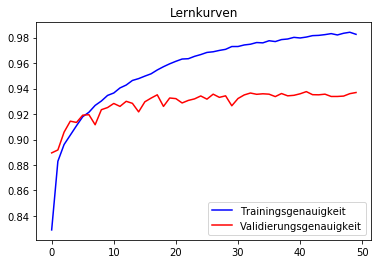

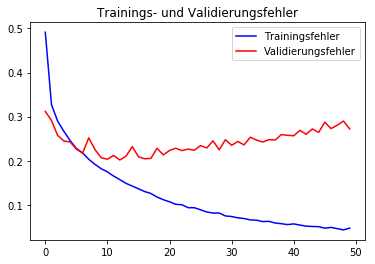

              precision    recall  f1-score   support

     T-shirt       0.88      0.90      0.89      1000
    Trousers       1.00      0.99      0.99      1000
    Pullover       0.91      0.91      0.91      1000
       Dress       0.93      0.94      0.94      1000
        Coat       0.88      0.93      0.90      1000
      Sandal       0.99      0.98      0.99      1000
       Shirt       0.84      0.78      0.81      1000
     Sneaker       0.96      0.98      0.97      1000
         Bag       0.99      0.99      0.99      1000
  Ankle-boot       0.98      0.97      0.97      1000

    accuracy                           0.94     10000
   macro avg       0.94      0.94      0.94     10000
weighted avg       0.94      0.94      0.94     10000



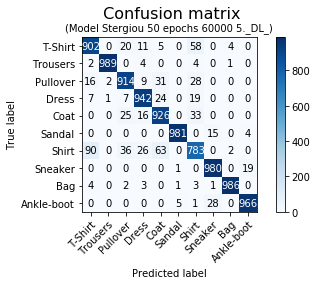

In [0]:
# 5mal Trainingsmenge 60000
runningModels_A(1,5,X_train, y_train, X_test, y_test, 60000)

In [0]:
downloader_opt_final(60000)

In [0]:
def downloader_opt_final(number_trainingdata):
  for i in range(1, 6):
    file_name = str(i)+"._"+str(number_trainingdata)+"_"
    file_name2 = str(i)+"._DL_"+str(number_trainingdata)+"_"
    files.download(file_name+"Lernkurve_FM_6Conv_acc.png")
    files.download(file_name+"Lernkurve_FM_6Conv_loss.png")
    files.download(file_name2+"Confusion_matrix.png")
    files.download(file_name2+"Testzeiten.csv")
    files.download(file_name2+"Trainingszeiten.csv")
    files.download(file_name2+"CNN_6Conv_epochs50_A.hdf5")
    files.download(file_name2+"CNN_6Conv_epochs50_A_weights.hdf5")
    #files.download(file_name2+"beste_Epoche_full.csv")
    files.download(file_name2+"metrics.csv")
    files.download(file_name2+"precision_recall_fscore.csv")
    files.download(file_name2+"roc_auc_score_single_class.npy")
    files.download(file_name2+"y_pred_label.npy")

In [0]:
########################################################################################################
###   "Beginn Training Split-Mengen B"
###    2. AUFTEILUNG !!!
###    Trainingsdatensätze unterschiedlicher Größe erstellen
########################################################################################################

X_tr_40000, y_tr_40000, X_tr_20000, y_tr_20000, X_tr_10000, y_tr_10000, X_tr_5000, y_tr_5000, X_tr_2000, y_tr_2000, X_tr_1000, y_tr_1000, X_tr_500, y_tr_500 = make_subsets_training_data_B(X_train, y_train)

In [0]:
################################################################################################
######   ohne Data Augmentation   ##############################################################
######   pro Trainingsmenge 5 Durchläufe
################################################################################################

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/50
500/500 [==============================] - 16s 31ms/step - loss: 1.8687 - acc: 0.4320 - val_loss: 1.5160 - val_acc: 0.6201
Epoch 2/50
500/500 [==============================] - 2s 4ms/step - loss: 1.1681 - acc: 0.6520 - val_loss: 1.1955 - val_acc: 0.7143
Epoch 3/50
500/500 [==============================] - 2s 4ms/step - loss: 0.8416 - acc: 0.7000 - val_loss: 1.0379 - val_acc: 0.7189
Epoch 4/50
500/500 [==============================] - 2s 4ms/step - loss: 0.7424 - acc: 0.7640 - val_loss: 0.7933 - val_acc: 0.7614
Epoch 5/50
500/500 [==============================] - 2s 4ms/step - loss: 0.5647 - acc: 0.7940 - val_loss: 0.8146 - val_acc: 0.7685
Epoch 6/50
500/500 [==============================] - 2s 4ms/step - loss: 0.4929 - acc: 0.8200 - val_loss: 0.7173 - val_acc: 0.7889
Epoch 7/50
500/500 [==============================] - 

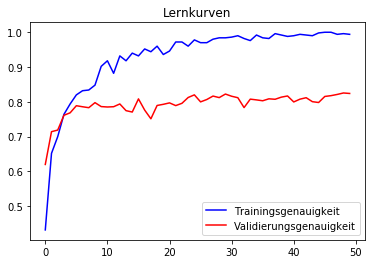

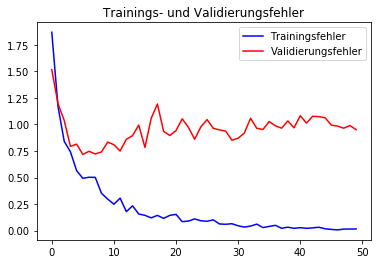

              precision    recall  f1-score   support

     T-shirt       0.78      0.76      0.77      1000
    Trousers       0.95      0.95      0.95      1000
    Pullover       0.70      0.72      0.71      1000
       Dress       0.86      0.81      0.84      1000
        Coat       0.71      0.72      0.72      1000
      Sandal       0.95      0.89      0.92      1000
       Shirt       0.57      0.58      0.57      1000
     Sneaker       0.88      0.93      0.90      1000
         Bag       0.93      0.94      0.93      1000
  Ankle-boot       0.92      0.94      0.93      1000

    accuracy                           0.82     10000
   macro avg       0.83      0.82      0.82     10000
weighted avg       0.83      0.82      0.82     10000



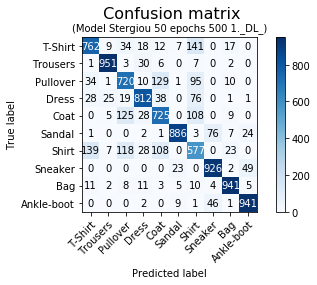

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/50
500/500 [==============================] - 17s 33ms/step - loss: 1.6172 - acc: 0.5000 - val_loss: 1.9859 - val_acc: 0.6463
Epoch 2/50
500/500 [==============================] - 2s 4ms/step - loss: 1.0550 - acc: 0.6580 - val_loss: 1.1292 - val_acc: 0.7282
Epoch 3/50
500/500 [==============================] - 2s 4ms/step - loss: 0.8992 - acc: 0.7220 - val_loss: 0.8536 - val_acc: 0.7600
Epoch 4/50
500/500 [==============================] - 2s 4ms/step - loss: 0.7002 - acc: 0.7600 - val_loss: 0.7740 - val_acc: 0.7637
Epoch 5/50
500/500 [==============================] - 2s 4ms/step - loss: 0.7159 - acc: 0.7320 - val_loss: 1.5484 - val_acc: 0.6357
Epoch 6/50
500/500 [==============================] - 2s 4ms/step - loss: 0.6187 - acc: 0.7840 - val_loss: 0.7429 - val_acc: 0.7805
Epoch 7/50
500/500 [==============================] - 

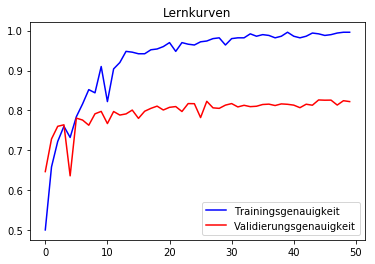

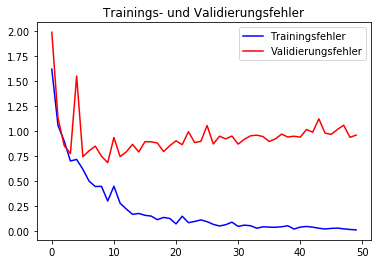

              precision    recall  f1-score   support

     T-shirt       0.79      0.74      0.77      1000
    Trousers       0.98      0.96      0.97      1000
    Pullover       0.70      0.74      0.72      1000
       Dress       0.82      0.86      0.84      1000
        Coat       0.79      0.56      0.66      1000
      Sandal       0.92      0.92      0.92      1000
       Shirt       0.51      0.64      0.57      1000
     Sneaker       0.90      0.92      0.91      1000
         Bag       0.93      0.94      0.94      1000
  Ankle-boot       0.94      0.94      0.94      1000

    accuracy                           0.82     10000
   macro avg       0.83      0.82      0.82     10000
weighted avg       0.83      0.82      0.82     10000



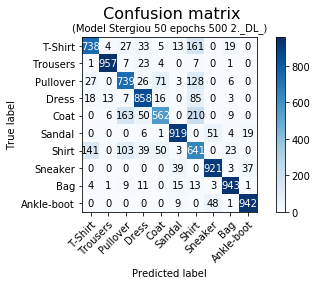

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/50
500/500 [==============================] - 18s 35ms/step - loss: 1.6962 - acc: 0.4580 - val_loss: 1.0298 - val_acc: 0.6887
Epoch 2/50
500/500 [==============================] - 2s 5ms/step - loss: 1.0709 - acc: 0.6520 - val_loss: 1.1457 - val_acc: 0.6678
Epoch 3/50
500/500 [==============================] - 2s 5ms/step - loss: 0.8595 - acc: 0.7380 - val_loss: 1.0442 - val_acc: 0.7097
Epoch 4/50
500/500 [==============================] - 2s 4ms/step - loss: 0.7332 - acc: 0.7500 - val_loss: 0.8262 - val_acc: 0.7344
Epoch 5/50
500/500 [==============================] - 2s 4ms/step - loss: 0.6371 - acc: 0.7880 - val_loss: 0.8178 - val_acc: 0.7698
Epoch 6/50
500/500 [==============================] - 2s 4ms/step - loss: 0.5602 - acc: 0.7940 - val_loss: 0.6878 - val_acc: 0.7720
Epoch 7/50
500/500 [==============================] - 

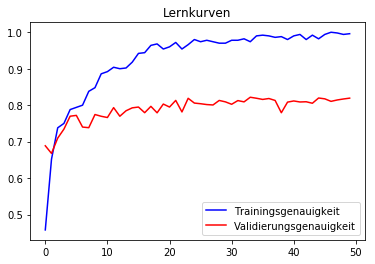

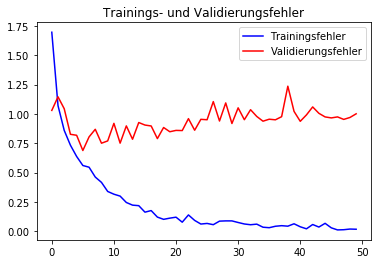

              precision    recall  f1-score   support

     T-shirt       0.76      0.73      0.74      1000
    Trousers       0.98      0.95      0.96      1000
    Pullover       0.76      0.62      0.69      1000
       Dress       0.77      0.86      0.81      1000
        Coat       0.66      0.80      0.72      1000
      Sandal       0.96      0.90      0.93      1000
       Shirt       0.58      0.54      0.56      1000
     Sneaker       0.86      0.95      0.91      1000
         Bag       0.94      0.91      0.93      1000
  Ankle-boot       0.95      0.93      0.94      1000

    accuracy                           0.82     10000
   macro avg       0.82      0.82      0.82     10000
weighted avg       0.82      0.82      0.82     10000



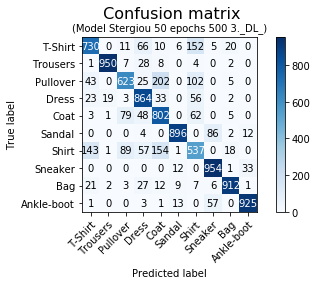

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/50
500/500 [==============================] - 17s 34ms/step - loss: 1.6017 - acc: 0.4940 - val_loss: 1.4857 - val_acc: 0.6604
Epoch 2/50
500/500 [==============================] - 2s 4ms/step - loss: 1.0296 - acc: 0.6860 - val_loss: 1.0761 - val_acc: 0.7368
Epoch 3/50
500/500 [==============================] - 2s 4ms/step - loss: 0.8280 - acc: 0.7060 - val_loss: 0.8762 - val_acc: 0.7463
Epoch 4/50
500/500 [==============================] - 2s 4ms/step - loss: 0.6762 - acc: 0.7720 - val_loss: 1.0667 - val_acc: 0.6786
Epoch 5/50
500/500 [==============================] - 2s 4ms/step - loss: 0.6315 - acc: 0.8000 - val_loss: 0.8898 - val_acc: 0.7516
Epoch 6/50
500/500 [==============================] - 2s 4ms/step - loss: 0.5486 - acc: 0.8200 - val_loss: 0.7784 - val_acc: 0.7700
Epoch 7/50
500/500 [==============================] - 

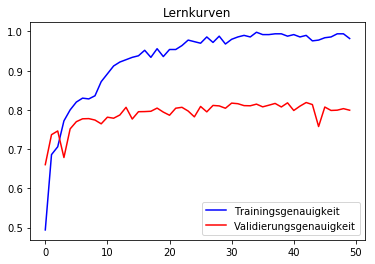

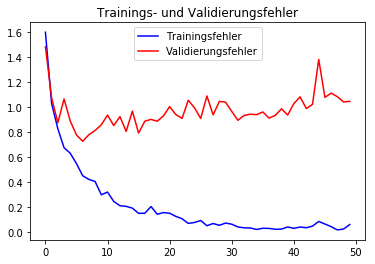

              precision    recall  f1-score   support

     T-shirt       0.86      0.61      0.71      1000
    Trousers       0.86      0.98      0.92      1000
    Pullover       0.66      0.79      0.72      1000
       Dress       0.82      0.78      0.80      1000
        Coat       0.73      0.58      0.65      1000
      Sandal       0.96      0.86      0.90      1000
       Shirt       0.50      0.61      0.55      1000
     Sneaker       0.83      0.95      0.89      1000
         Bag       0.94      0.91      0.92      1000
  Ankle-boot       0.94      0.93      0.93      1000

    accuracy                           0.80     10000
   macro avg       0.81      0.80      0.80     10000
weighted avg       0.81      0.80      0.80     10000



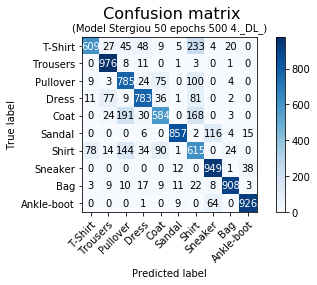

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/50
500/500 [==============================] - 17s 34ms/step - loss: 1.7337 - acc: 0.4480 - val_loss: 0.9900 - val_acc: 0.6935
Epoch 2/50
500/500 [==============================] - 2s 4ms/step - loss: 0.9632 - acc: 0.6620 - val_loss: 0.8997 - val_acc: 0.7107
Epoch 3/50
500/500 [==============================] - 2s 4ms/step - loss: 0.7469 - acc: 0.7400 - val_loss: 1.1396 - val_acc: 0.7276
Epoch 4/50
500/500 [==============================] - 2s 4ms/step - loss: 0.7137 - acc: 0.7800 - val_loss: 0.8409 - val_acc: 0.7712
Epoch 5/50
500/500 [==============================] - 2s 4ms/step - loss: 0.5905 - acc: 0.7820 - val_loss: 0.8008 - val_acc: 0.7742
Epoch 6/50
500/500 [==============================] - 2s 4ms/step - loss: 0.5504 - acc: 0.7960 - val_loss: 0.7841 - val_acc: 0.7558
Epoch 7/50
500/500 [==============================] - 

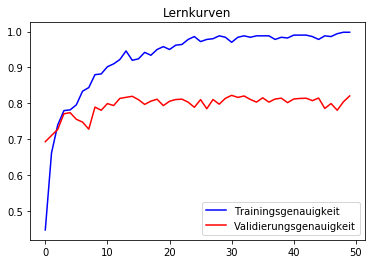

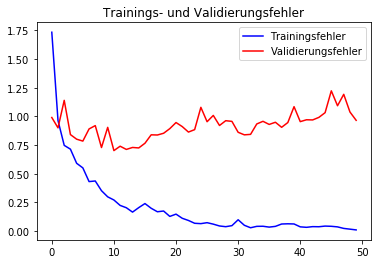

              precision    recall  f1-score   support

     T-shirt       0.73      0.74      0.74      1000
    Trousers       0.95      0.96      0.95      1000
    Pullover       0.74      0.70      0.72      1000
       Dress       0.85      0.81      0.83      1000
        Coat       0.69      0.71      0.70      1000
      Sandal       0.93      0.94      0.93      1000
       Shirt       0.56      0.57      0.56      1000
     Sneaker       0.92      0.88      0.90      1000
         Bag       0.95      0.93      0.94      1000
  Ankle-boot       0.91      0.95      0.93      1000

    accuracy                           0.82     10000
   macro avg       0.82      0.82      0.82     10000
weighted avg       0.82      0.82      0.82     10000



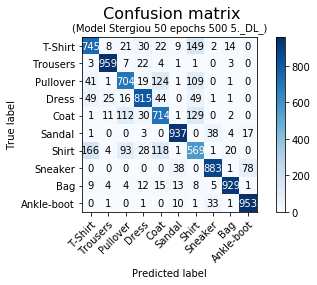

In [0]:
# 5mal Trainingsmenge 500
runningModels_B(1,5,X_tr_500, y_tr_500, X_test, y_test, 500)

In [0]:
downloader_opt_final_B(500)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/50
1000/1000 [==============================] - 18s 18ms/step - loss: 1.3959 - acc: 0.5640 - val_loss: 1.1840 - val_acc: 0.7051
Epoch 2/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.8891 - acc: 0.7240 - val_loss: 1.2978 - val_acc: 0.7362
Epoch 3/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.7275 - acc: 0.7520 - val_loss: 0.7456 - val_acc: 0.7576
Epoch 4/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.6576 - acc: 0.7820 - val_loss: 0.6930 - val_acc: 0.7948
Epoch 5/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.6473 - acc: 0.7900 - val_loss: 0.7663 - val_acc: 0.7732
Epoch 6/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.5420 - acc: 0.7900 - val_loss: 0.8199 - val_acc: 0.7829
Epoch 7/50
1000/1000 [===================

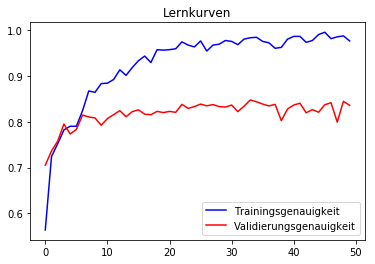

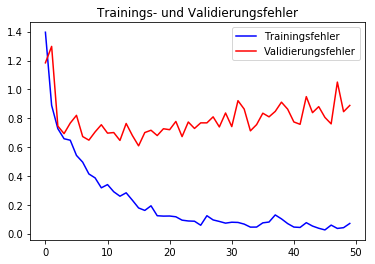

              precision    recall  f1-score   support

     T-shirt       0.75      0.82      0.78      1000
    Trousers       0.99      0.94      0.96      1000
    Pullover       0.66      0.83      0.73      1000
       Dress       0.87      0.84      0.85      1000
        Coat       0.74      0.74      0.74      1000
      Sandal       0.98      0.85      0.91      1000
       Shirt       0.67      0.47      0.55      1000
     Sneaker       0.85      0.97      0.91      1000
         Bag       0.94      0.96      0.95      1000
  Ankle-boot       0.94      0.94      0.94      1000

    accuracy                           0.84     10000
   macro avg       0.84      0.84      0.83     10000
weighted avg       0.84      0.84      0.83     10000



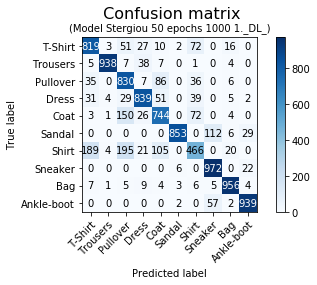

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/50
1000/1000 [==============================] - 18s 18ms/step - loss: 1.4520 - acc: 0.5570 - val_loss: 1.1377 - val_acc: 0.6926
Epoch 2/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.8852 - acc: 0.7150 - val_loss: 1.0891 - val_acc: 0.7199
Epoch 3/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.7493 - acc: 0.7630 - val_loss: 0.7889 - val_acc: 0.7503
Epoch 4/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.6440 - acc: 0.7750 - val_loss: 0.7091 - val_acc: 0.7862
Epoch 5/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.5442 - acc: 0.7960 - val_loss: 0.8023 - val_acc: 0.7548
Epoch 6/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.4670 - acc: 0.8370 - val_loss: 0.7431 - val_acc: 0.7777
Epoch 7/50
1000/1000 [===================

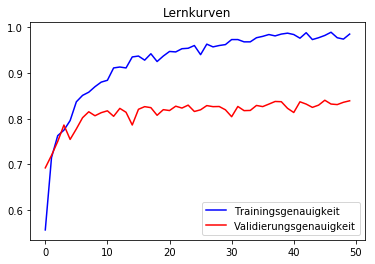

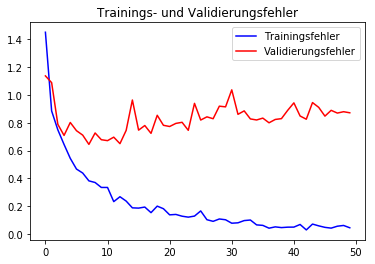

              precision    recall  f1-score   support

     T-shirt       0.76      0.80      0.78      1000
    Trousers       0.98      0.95      0.96      1000
    Pullover       0.70      0.81      0.75      1000
       Dress       0.83      0.88      0.85      1000
        Coat       0.72      0.77      0.74      1000
      Sandal       0.96      0.93      0.94      1000
       Shirt       0.68      0.44      0.54      1000
     Sneaker       0.92      0.91      0.91      1000
         Bag       0.93      0.96      0.95      1000
  Ankle-boot       0.91      0.95      0.93      1000

    accuracy                           0.84     10000
   macro avg       0.84      0.84      0.84     10000
weighted avg       0.84      0.84      0.84     10000



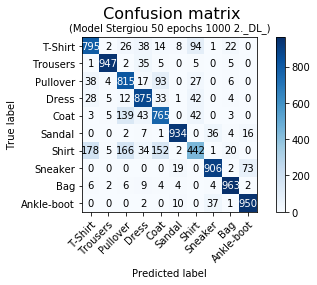

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/50
1000/1000 [==============================] - 18s 18ms/step - loss: 1.4160 - acc: 0.5500 - val_loss: 1.2149 - val_acc: 0.7026
Epoch 2/50
1000/1000 [==============================] - 2s 2ms/step - loss: 1.0381 - acc: 0.6910 - val_loss: 0.9205 - val_acc: 0.7473
Epoch 3/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.7518 - acc: 0.7530 - val_loss: 0.8488 - val_acc: 0.7670
Epoch 4/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.6835 - acc: 0.7730 - val_loss: 0.7186 - val_acc: 0.7812
Epoch 5/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.5688 - acc: 0.7940 - val_loss: 0.6476 - val_acc: 0.7909
Epoch 6/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.4966 - acc: 0.8320 - val_loss: 0.6404 - val_acc: 0.8038
Epoch 7/50
1000/1000 [===================

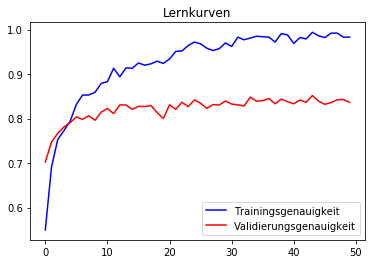

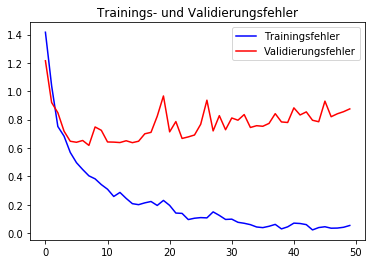

              precision    recall  f1-score   support

     T-shirt       0.74      0.78      0.76      1000
    Trousers       0.97      0.96      0.96      1000
    Pullover       0.81      0.70      0.75      1000
       Dress       0.79      0.87      0.83      1000
        Coat       0.75      0.70      0.72      1000
      Sandal       0.97      0.91      0.94      1000
       Shirt       0.58      0.62      0.60      1000
     Sneaker       0.89      0.94      0.91      1000
         Bag       0.95      0.94      0.95      1000
  Ankle-boot       0.93      0.95      0.94      1000

    accuracy                           0.84     10000
   macro avg       0.84      0.84      0.84     10000
weighted avg       0.84      0.84      0.84     10000



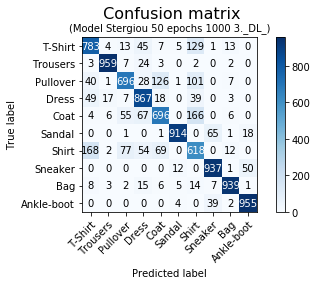

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/50
1000/1000 [==============================] - 19s 19ms/step - loss: 1.4994 - acc: 0.5490 - val_loss: 0.9916 - val_acc: 0.7158
Epoch 2/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.8720 - acc: 0.7080 - val_loss: 0.9511 - val_acc: 0.7484
Epoch 3/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.7908 - acc: 0.7350 - val_loss: 0.9906 - val_acc: 0.7650
Epoch 4/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.6810 - acc: 0.7720 - val_loss: 0.8123 - val_acc: 0.7631
Epoch 5/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.5373 - acc: 0.8190 - val_loss: 0.7696 - val_acc: 0.7900
Epoch 6/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.5004 - acc: 0.8280 - val_loss: 0.6653 - val_acc: 0.8054
Epoch 7/50
1000/1000 [===================

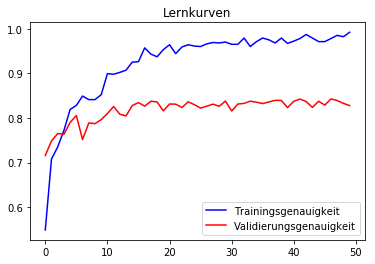

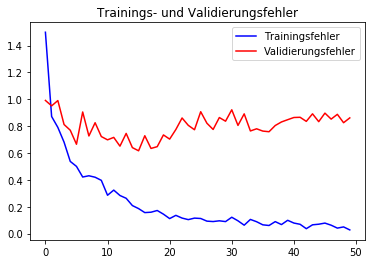

              precision    recall  f1-score   support

     T-shirt       0.77      0.74      0.76      1000
    Trousers       0.99      0.93      0.96      1000
    Pullover       0.66      0.83      0.74      1000
       Dress       0.86      0.82      0.84      1000
        Coat       0.80      0.62      0.70      1000
      Sandal       0.99      0.88      0.93      1000
       Shirt       0.54      0.62      0.58      1000
     Sneaker       0.89      0.94      0.91      1000
         Bag       0.97      0.92      0.94      1000
  Ankle-boot       0.91      0.96      0.93      1000

    accuracy                           0.83     10000
   macro avg       0.84      0.83      0.83     10000
weighted avg       0.84      0.83      0.83     10000



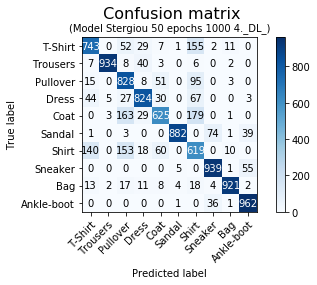

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/50
1000/1000 [==============================] - 19s 19ms/step - loss: 1.4718 - acc: 0.5460 - val_loss: 1.4534 - val_acc: 0.6302
Epoch 2/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.9525 - acc: 0.7040 - val_loss: 0.9106 - val_acc: 0.7376
Epoch 3/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.7331 - acc: 0.7480 - val_loss: 0.6496 - val_acc: 0.7787
Epoch 4/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.6390 - acc: 0.7660 - val_loss: 0.7737 - val_acc: 0.7498
Epoch 5/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.6550 - acc: 0.7730 - val_loss: 0.7024 - val_acc: 0.7898
Epoch 6/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.4942 - acc: 0.8340 - val_loss: 0.5436 - val_acc: 0.8157
Epoch 7/50
1000/1000 [===================

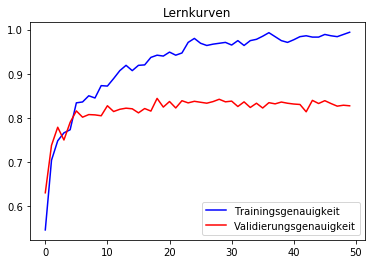

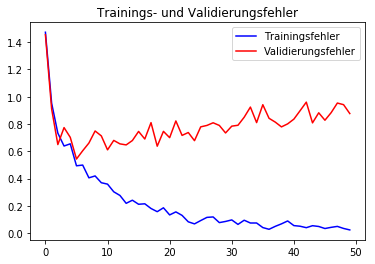

              precision    recall  f1-score   support

     T-shirt       0.77      0.67      0.72      1000
    Trousers       0.98      0.95      0.96      1000
    Pullover       0.78      0.73      0.76      1000
       Dress       0.88      0.81      0.84      1000
        Coat       0.73      0.78      0.76      1000
      Sandal       0.98      0.84      0.91      1000
       Shirt       0.53      0.65      0.58      1000
     Sneaker       0.86      0.92      0.89      1000
         Bag       0.96      0.94      0.95      1000
  Ankle-boot       0.90      0.97      0.93      1000

    accuracy                           0.83     10000
   macro avg       0.84      0.83      0.83     10000
weighted avg       0.84      0.83      0.83     10000



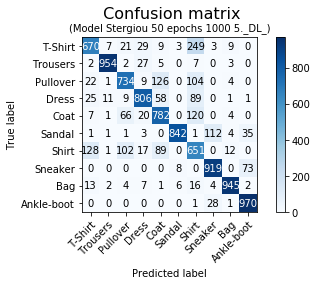

In [0]:
# 5mal Trainingsmenge 1000
runningModels_B(1,5,X_tr_1000, y_tr_1000, X_test, y_test, 1000)

In [0]:
downloader_opt_final_B(1000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 










Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 2000 samples, validate on 10000 samples
Epoch 1/50
2000/2000 [==============================] - 10s 5ms/step - loss: 1.1946 - acc: 0.6345 - val_loss: 0.9092 - val_acc: 0.7438
Epoch 2/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.8151 - acc: 0.7360 - val_loss: 0.6812 - val_acc: 0.7914
Epoch 3/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.6323 - acc: 0.7945 - val_loss: 0.5907 - val_acc: 0.8098
Epoch 4/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.5611 - acc: 0.8020 - val_loss: 0.7294 - val_acc: 0.7829
Epoch 5/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.4870 - ac

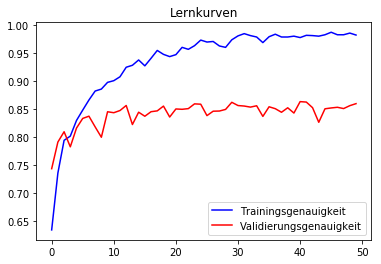

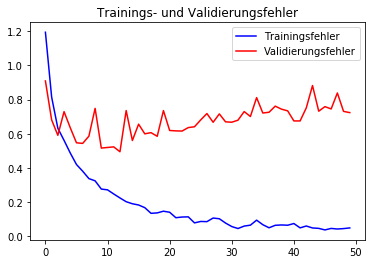

              precision    recall  f1-score   support

     T-shirt       0.78      0.81      0.80      1000
    Trousers       0.98      0.97      0.97      1000
    Pullover       0.79      0.79      0.79      1000
       Dress       0.88      0.85      0.87      1000
        Coat       0.74      0.81      0.77      1000
      Sandal       0.93      0.97      0.95      1000
       Shirt       0.66      0.61      0.63      1000
     Sneaker       0.92      0.93      0.93      1000
         Bag       0.98      0.94      0.96      1000
  Ankle-boot       0.96      0.92      0.94      1000

    accuracy                           0.86     10000
   macro avg       0.86      0.86      0.86     10000
weighted avg       0.86      0.86      0.86     10000



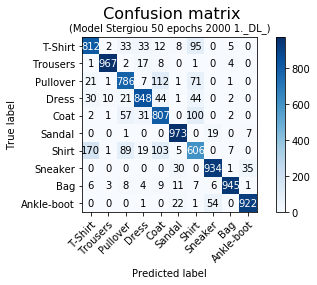

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/50
2000/2000 [==============================] - 4s 2ms/step - loss: 1.2043 - acc: 0.6225 - val_loss: 1.0284 - val_acc: 0.7254
Epoch 2/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.7796 - acc: 0.7430 - val_loss: 0.7579 - val_acc: 0.7808
Epoch 3/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.6343 - acc: 0.7860 - val_loss: 0.7061 - val_acc: 0.7804
Epoch 4/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.5998 - acc: 0.7855 - val_loss: 0.7461 - val_acc: 0.7726
Epoch 5/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.5423 - acc: 0.8115 - val_loss: 0.6396 - val_acc: 0.8042
Epoch 6/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.4718 - acc: 0.8375 - val_loss: 0.5386 - val_acc: 0.8267
Epoch 7/50
2000/2000 [=====================

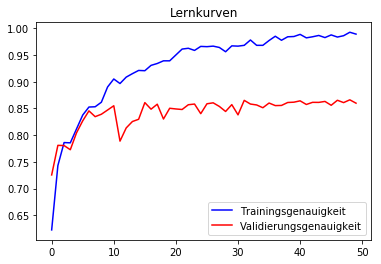

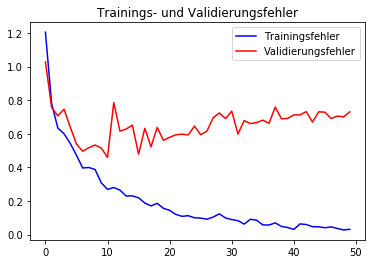

              precision    recall  f1-score   support

     T-shirt       0.80      0.80      0.80      1000
    Trousers       0.99      0.95      0.97      1000
    Pullover       0.80      0.78      0.79      1000
       Dress       0.88      0.85      0.86      1000
        Coat       0.76      0.77      0.76      1000
      Sandal       0.98      0.94      0.96      1000
       Shirt       0.60      0.66      0.63      1000
     Sneaker       0.91      0.96      0.93      1000
         Bag       0.96      0.96      0.96      1000
  Ankle-boot       0.95      0.94      0.95      1000

    accuracy                           0.86     10000
   macro avg       0.86      0.86      0.86     10000
weighted avg       0.86      0.86      0.86     10000



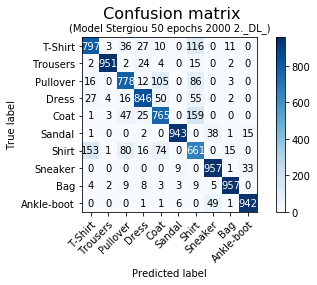

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/50
2000/2000 [==============================] - 4s 2ms/step - loss: 1.2221 - acc: 0.6190 - val_loss: 1.1820 - val_acc: 0.7401
Epoch 2/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.8018 - acc: 0.7385 - val_loss: 0.8268 - val_acc: 0.7824
Epoch 3/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.6558 - acc: 0.7795 - val_loss: 0.7958 - val_acc: 0.7535
Epoch 4/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.5856 - acc: 0.7935 - val_loss: 0.5907 - val_acc: 0.8229
Epoch 5/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.4927 - acc: 0.8245 - val_loss: 0.7154 - val_acc: 0.7788
Epoch 6/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.4479 - acc: 0.8395 - val_loss: 0.5513 - val_acc: 0.8206
Epoch 7/50
2000/2000 [=====================

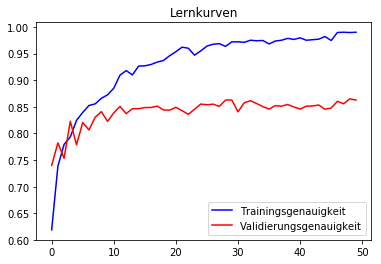

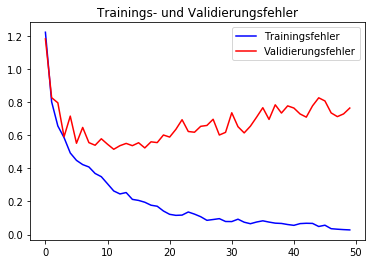

              precision    recall  f1-score   support

     T-shirt       0.80      0.82      0.81      1000
    Trousers       0.98      0.96      0.97      1000
    Pullover       0.76      0.85      0.81      1000
       Dress       0.87      0.87      0.87      1000
        Coat       0.82      0.69      0.75      1000
      Sandal       0.97      0.94      0.96      1000
       Shirt       0.62      0.65      0.63      1000
     Sneaker       0.91      0.95      0.93      1000
         Bag       0.97      0.94      0.96      1000
  Ankle-boot       0.94      0.95      0.95      1000

    accuracy                           0.86     10000
   macro avg       0.87      0.86      0.86     10000
weighted avg       0.87      0.86      0.86     10000



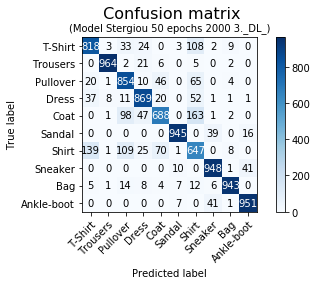

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/50
2000/2000 [==============================] - 5s 2ms/step - loss: 1.1593 - acc: 0.6305 - val_loss: 1.0146 - val_acc: 0.7071
Epoch 2/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.8351 - acc: 0.7380 - val_loss: 0.7268 - val_acc: 0.7636
Epoch 3/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.6461 - acc: 0.7720 - val_loss: 0.8167 - val_acc: 0.7699
Epoch 4/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.5607 - acc: 0.8045 - val_loss: 0.7379 - val_acc: 0.7807
Epoch 5/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.4916 - acc: 0.8245 - val_loss: 0.5389 - val_acc: 0.8292
Epoch 6/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.4347 - acc: 0.8440 - val_loss: 0.7913 - val_acc: 0.7812
Epoch 7/50
2000/2000 [=====================

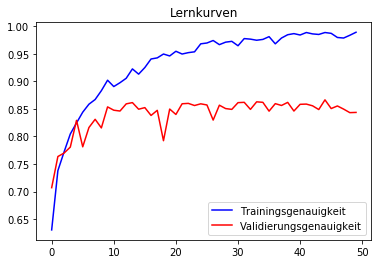

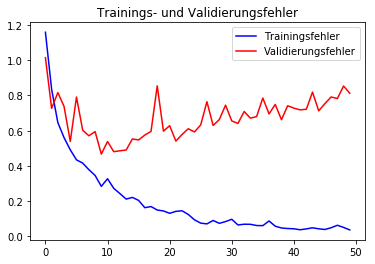

              precision    recall  f1-score   support

     T-shirt       0.82      0.70      0.75      1000
    Trousers       0.98      0.96      0.97      1000
    Pullover       0.84      0.72      0.78      1000
       Dress       0.86      0.87      0.87      1000
        Coat       0.75      0.73      0.74      1000
      Sandal       0.91      0.96      0.94      1000
       Shirt       0.54      0.70      0.61      1000
     Sneaker       0.89      0.97      0.93      1000
         Bag       0.97      0.93      0.95      1000
  Ankle-boot       0.98      0.88      0.93      1000

    accuracy                           0.84     10000
   macro avg       0.85      0.84      0.85     10000
weighted avg       0.85      0.84      0.85     10000



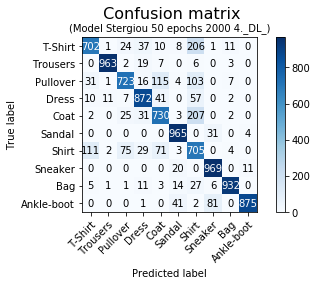

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/50
2000/2000 [==============================] - 5s 3ms/step - loss: 1.1252 - acc: 0.6480 - val_loss: 0.9678 - val_acc: 0.7145
Epoch 2/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.7394 - acc: 0.7525 - val_loss: 0.7315 - val_acc: 0.7843
Epoch 3/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.6531 - acc: 0.7880 - val_loss: 0.5742 - val_acc: 0.8086
Epoch 4/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.5354 - acc: 0.8205 - val_loss: 0.5187 - val_acc: 0.8286
Epoch 5/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.4790 - acc: 0.8280 - val_loss: 0.5933 - val_acc: 0.8182
Epoch 6/50
2000/2000 [==============================] - 2s 1ms/step - loss: 0.4318 - acc: 0.8485 - val_loss: 0.4979 - val_acc: 0.8418
Epoch 7/50
2000/2000 [=====================

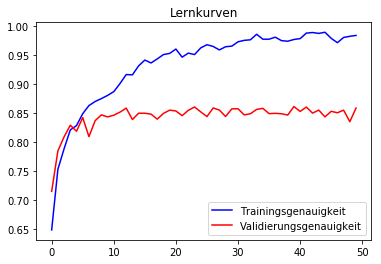

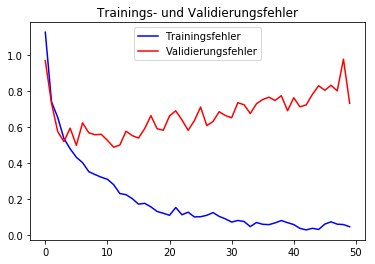

              precision    recall  f1-score   support

     T-shirt       0.79      0.78      0.78      1000
    Trousers       0.99      0.95      0.97      1000
    Pullover       0.82      0.77      0.80      1000
       Dress       0.89      0.85      0.87      1000
        Coat       0.75      0.79      0.77      1000
      Sandal       0.98      0.93      0.96      1000
       Shirt       0.60      0.64      0.62      1000
     Sneaker       0.90      0.96      0.93      1000
         Bag       0.94      0.97      0.95      1000
  Ankle-boot       0.95      0.94      0.94      1000

    accuracy                           0.86     10000
   macro avg       0.86      0.86      0.86     10000
weighted avg       0.86      0.86      0.86     10000



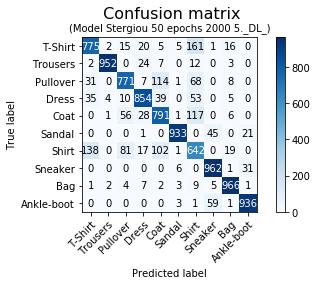

In [0]:
# 5mal Trainingsmenge 2000   
runningModels_B(1,5,X_tr_2000, y_tr_2000, X_test, y_test, 2000)

In [0]:
downloader_opt_final_B(2000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/50
5000/5000 [==============================] - 7s 1ms/step - loss: 0.9611 - acc: 0.6898 - val_loss: 0.7261 - val_acc: 0.7795
Epoch 2/50
5000/5000 [==============================] - 4s 763us/step - loss: 0.6295 - acc: 0.7810 - val_loss: 0.5224 - val_acc: 0.8325
Epoch 3/50
5000/5000 [==============================] - 4s 748us/step - loss: 0.5410 - acc: 0.8106 - val_loss: 0.4941 - val_acc: 0.8407
Epoch 4/50
5000/5000 [==============================] - 4s 758us/step - loss: 0.4655 - acc: 0.8388 - val_loss: 0.5244 - val_acc: 0.8339
Epoch 5/50
5000/5000 [==============================] - 4s 769us/step - loss: 0.3974 - acc: 0.8632 - val_loss: 0.3988 - val_acc: 0.8604
Epoch 6/50
5000/5000 [==============================] - 4s 770us/step - loss: 0.3770 - acc: 0.8640 - val_loss: 0.3980 - val_acc: 0.8637
Epoch 7/50
5000/5000 [===========

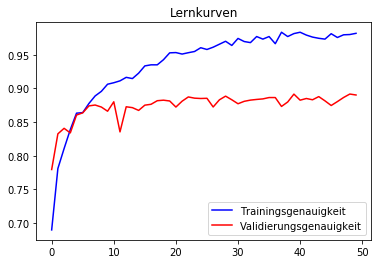

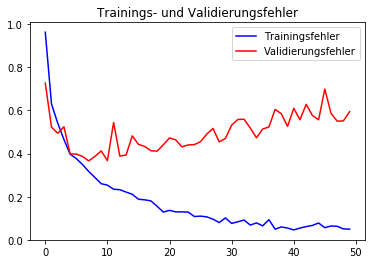

              precision    recall  f1-score   support

     T-shirt       0.81      0.85      0.83      1000
    Trousers       0.98      0.98      0.98      1000
    Pullover       0.85      0.85      0.85      1000
       Dress       0.90      0.87      0.88      1000
        Coat       0.79      0.88      0.83      1000
      Sandal       0.99      0.96      0.97      1000
       Shirt       0.75      0.66      0.70      1000
     Sneaker       0.96      0.92      0.94      1000
         Bag       0.98      0.96      0.97      1000
  Ankle-boot       0.91      0.98      0.94      1000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



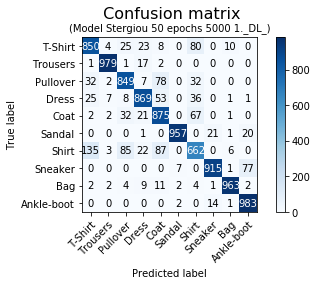

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/50
5000/5000 [==============================] - 8s 2ms/step - loss: 0.9522 - acc: 0.6952 - val_loss: 0.7294 - val_acc: 0.7713
Epoch 2/50
5000/5000 [==============================] - 4s 768us/step - loss: 0.6371 - acc: 0.7818 - val_loss: 0.5594 - val_acc: 0.8210
Epoch 3/50
5000/5000 [==============================] - 4s 756us/step - loss: 0.5164 - acc: 0.8234 - val_loss: 0.4178 - val_acc: 0.8554
Epoch 4/50
5000/5000 [==============================] - 4s 766us/step - loss: 0.4603 - acc: 0.8418 - val_loss: 0.4227 - val_acc: 0.8549
Epoch 5/50
5000/5000 [==============================] - 4s 772us/step - loss: 0.3981 - acc: 0.8554 - val_loss: 0.4016 - val_acc: 0.8630
Epoch 6/50
5000/5000 [==============================] - 4s 763us/step - loss: 0.3737 - acc: 0.8670 - val_loss: 0.4742 - val_acc: 0.8413
Epoch 7/50
5000/5000 [===========

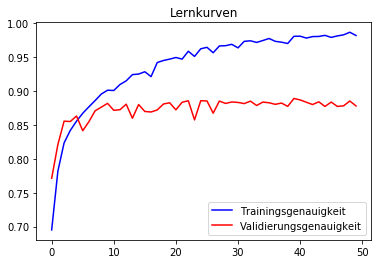

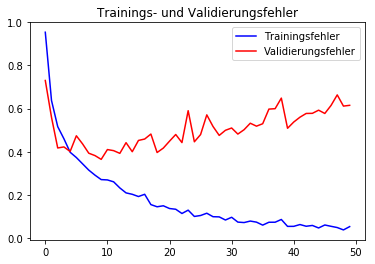

              precision    recall  f1-score   support

     T-shirt       0.81      0.79      0.80      1000
    Trousers       0.97      0.98      0.98      1000
    Pullover       0.78      0.87      0.82      1000
       Dress       0.91      0.84      0.88      1000
        Coat       0.81      0.81      0.81      1000
      Sandal       0.97      0.96      0.97      1000
       Shirt       0.69      0.67      0.68      1000
     Sneaker       0.90      0.98      0.94      1000
         Bag       0.98      0.96      0.97      1000
  Ankle-boot       0.98      0.91      0.94      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



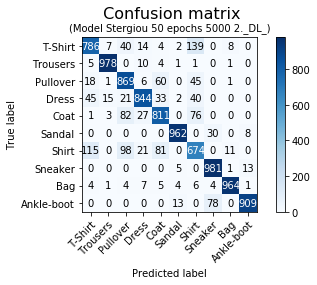

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/50
5000/5000 [==============================] - 8s 2ms/step - loss: 0.9344 - acc: 0.6968 - val_loss: 0.7620 - val_acc: 0.7696
Epoch 2/50
5000/5000 [==============================] - 4s 772us/step - loss: 0.6361 - acc: 0.7856 - val_loss: 0.5807 - val_acc: 0.8198
Epoch 3/50
5000/5000 [==============================] - 4s 775us/step - loss: 0.5269 - acc: 0.8192 - val_loss: 0.4338 - val_acc: 0.8472
Epoch 4/50
5000/5000 [==============================] - 4s 782us/step - loss: 0.4302 - acc: 0.8448 - val_loss: 0.4425 - val_acc: 0.8592
Epoch 5/50
5000/5000 [==============================] - 4s 773us/step - loss: 0.3937 - acc: 0.8578 - val_loss: 0.4097 - val_acc: 0.8691
Epoch 6/50
5000/5000 [==============================] - 4s 774us/step - loss: 0.3605 - acc: 0.8724 - val_loss: 0.5192 - val_acc: 0.8362
Epoch 7/50
5000/5000 [===========

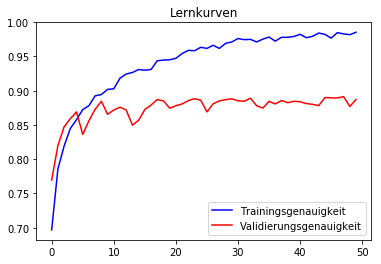

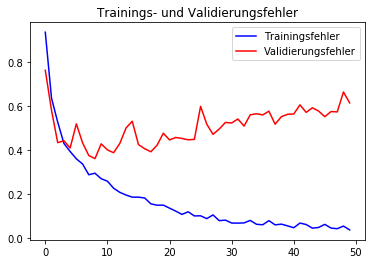

              precision    recall  f1-score   support

     T-shirt       0.78      0.87      0.82      1000
    Trousers       0.98      0.98      0.98      1000
    Pullover       0.86      0.83      0.85      1000
       Dress       0.92      0.83      0.87      1000
        Coat       0.79      0.85      0.82      1000
      Sandal       0.98      0.96      0.97      1000
       Shirt       0.70      0.65      0.68      1000
     Sneaker       0.95      0.96      0.95      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.95      0.96      0.96      1000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



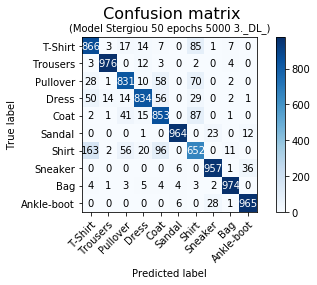

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/50
5000/5000 [==============================] - 9s 2ms/step - loss: 0.9621 - acc: 0.6910 - val_loss: 0.6578 - val_acc: 0.7968
Epoch 2/50
5000/5000 [==============================] - 4s 793us/step - loss: 0.6238 - acc: 0.7924 - val_loss: 0.4655 - val_acc: 0.8443
Epoch 3/50
5000/5000 [==============================] - 4s 779us/step - loss: 0.5081 - acc: 0.8242 - val_loss: 0.4975 - val_acc: 0.8478
Epoch 4/50
5000/5000 [==============================] - 4s 779us/step - loss: 0.4532 - acc: 0.8376 - val_loss: 0.5270 - val_acc: 0.8425
Epoch 5/50
5000/5000 [==============================] - 4s 780us/step - loss: 0.4034 - acc: 0.8594 - val_loss: 0.4305 - val_acc: 0.8623
Epoch 6/50
5000/5000 [==============================] - 4s 775us/step - loss: 0.3680 - acc: 0.8718 - val_loss: 0.4153 - val_acc: 0.8647
Epoch 7/50
5000/5000 [===========

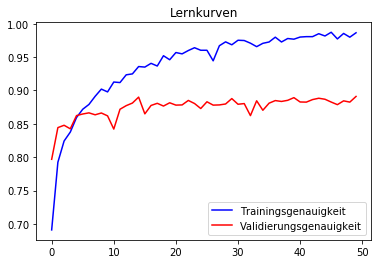

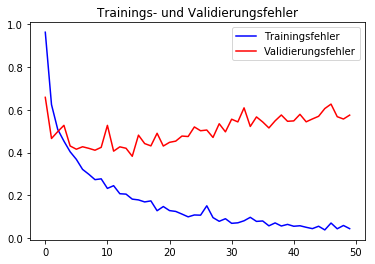

              precision    recall  f1-score   support

     T-shirt       0.85      0.82      0.84      1000
    Trousers       0.98      0.97      0.97      1000
    Pullover       0.84      0.85      0.85      1000
       Dress       0.87      0.92      0.89      1000
        Coat       0.78      0.86      0.82      1000
      Sandal       0.97      0.97      0.97      1000
       Shirt       0.75      0.65      0.70      1000
     Sneaker       0.94      0.94      0.94      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.95      0.95      0.95      1000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



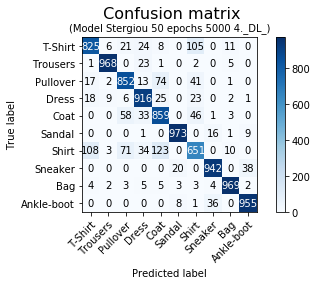

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/50
5000/5000 [==============================] - 10s 2ms/step - loss: 0.9635 - acc: 0.6946 - val_loss: 0.7637 - val_acc: 0.7723
Epoch 2/50
5000/5000 [==============================] - 4s 802us/step - loss: 0.6156 - acc: 0.7908 - val_loss: 0.5297 - val_acc: 0.8338
Epoch 3/50
5000/5000 [==============================] - 4s 803us/step - loss: 0.5167 - acc: 0.8258 - val_loss: 0.4692 - val_acc: 0.8376
Epoch 4/50
5000/5000 [==============================] - 4s 807us/step - loss: 0.4378 - acc: 0.8474 - val_loss: 0.4330 - val_acc: 0.8579
Epoch 5/50
5000/5000 [==============================] - 4s 801us/step - loss: 0.4112 - acc: 0.8558 - val_loss: 0.3856 - val_acc: 0.8709
Epoch 6/50
5000/5000 [==============================] - 4s 804us/step - loss: 0.3505 - acc: 0.8752 - val_loss: 0.3753 - val_acc: 0.8767
Epoch 7/50
5000/5000 [==========

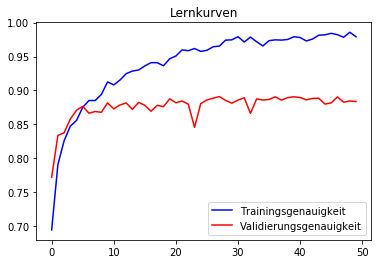

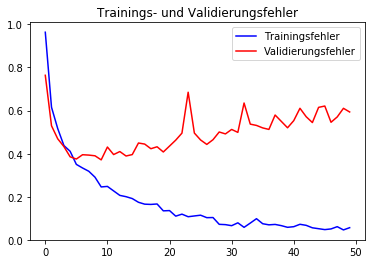

              precision    recall  f1-score   support

     T-shirt       0.85      0.82      0.84      1000
    Trousers       0.98      0.97      0.98      1000
    Pullover       0.80      0.87      0.83      1000
       Dress       0.90      0.88      0.89      1000
        Coat       0.83      0.78      0.81      1000
      Sandal       0.97      0.98      0.97      1000
       Shirt       0.67      0.70      0.69      1000
     Sneaker       0.97      0.90      0.93      1000
         Bag       0.99      0.95      0.97      1000
  Ankle-boot       0.91      0.97      0.94      1000

    accuracy                           0.88     10000
   macro avg       0.89      0.88      0.88     10000
weighted avg       0.89      0.88      0.88     10000



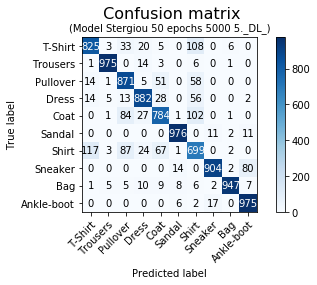

In [0]:
# 5mal Trainingsmenge 5000
runningModels_B(1,5,X_tr_5000, y_tr_5000, X_test, y_test, 5000)

In [0]:
downloader_opt_final_B(5000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 10000 samples, validate on 10000 samples
Epoch 1/50
10000/10000 [==============================] - 13s 1ms/step - loss: 0.7893 - acc: 0.7405 - val_loss: 0.6389 - val_acc: 0.7952
Epoch 2/50
10000/10000 [==============================] - 7s 673us/step - loss: 0.5201 - acc: 0.8231 - val_loss: 0.4890 - val_acc: 0.8372
Epoch 3/50
10000/10000 [==============================] - 7s 671us/step - loss: 0.4164 - acc: 0.8549 - val_loss: 0.4066 - val_acc: 0.8664
Epoch 4/50
10000/10000 [==============================] - 7s 673us/step - loss: 0.3661 - acc: 0.8693 - val_loss: 0.3578 - val_acc: 0.8751
Epoch 5/50
10000/10000 [==============================] - 7s 673us/step - loss: 0.3367 - acc: 0.8780 - val_loss: 0.3290 - val_acc: 0.8883
Epoch 6/50
10000/10000 [==============================] - 7s 670us/step - loss: 0.3189 - acc: 0.8862 - val_loss: 0.3295 - val_acc: 0.8891
Epoch 7/50
10000/10

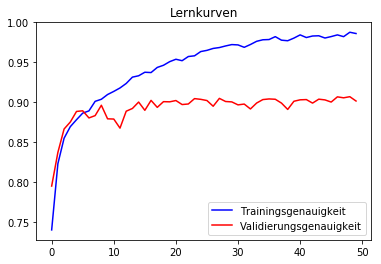

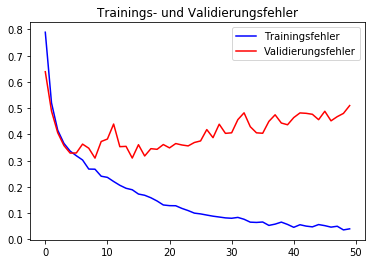

              precision    recall  f1-score   support

     T-shirt       0.89      0.81      0.85      1000
    Trousers       0.97      0.98      0.98      1000
    Pullover       0.90      0.80      0.84      1000
       Dress       0.88      0.91      0.90      1000
        Coat       0.77      0.91      0.84      1000
      Sandal       0.97      0.97      0.97      1000
       Shirt       0.74      0.75      0.74      1000
     Sneaker       0.93      0.98      0.96      1000
         Bag       0.99      0.96      0.98      1000
  Ankle-boot       0.98      0.94      0.96      1000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



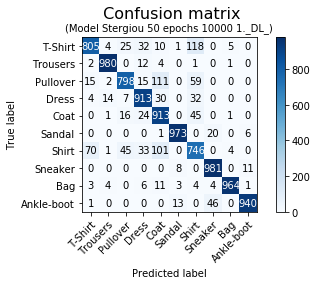

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 10000 samples, validate on 10000 samples
Epoch 1/50
10000/10000 [==============================] - 13s 1ms/step - loss: 0.7964 - acc: 0.7377 - val_loss: 0.5941 - val_acc: 0.7929
Epoch 2/50
10000/10000 [==============================] - 7s 670us/step - loss: 0.5163 - acc: 0.8212 - val_loss: 0.3963 - val_acc: 0.8615
Epoch 3/50
10000/10000 [==============================] - 7s 665us/step - loss: 0.4250 - acc: 0.8493 - val_loss: 0.3798 - val_acc: 0.8666
Epoch 4/50
10000/10000 [==============================] - 7s 666us/step - loss: 0.3847 - acc: 0.8643 - val_loss: 0.3761 - val_acc: 0.8686
Epoch 5/50
10000/10000 [==============================] - 7s 678us/step - loss: 0.3466 - acc: 0.8720 - val_loss: 0.3382 - val_acc: 0.8820
Epoch 6/50
10000/10000 [==============================] - 7s 672us/step - loss: 0.3173 - acc: 0.8838 - val_loss: 0.3399 - val_acc: 0.8796
Epoch 7/50
10000/10

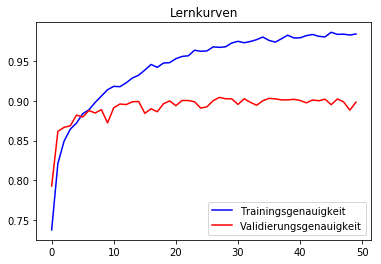

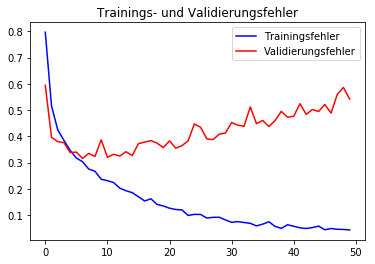

              precision    recall  f1-score   support

     T-shirt       0.83      0.83      0.83      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.87      0.84      0.86      1000
       Dress       0.92      0.88      0.90      1000
        Coat       0.78      0.91      0.84      1000
      Sandal       0.99      0.96      0.97      1000
       Shirt       0.74      0.68      0.71      1000
     Sneaker       0.94      0.96      0.95      1000
         Bag       0.98      0.98      0.98      1000
  Ankle-boot       0.96      0.96      0.96      1000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



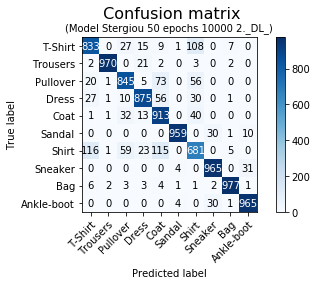

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 10000 samples, validate on 10000 samples
Epoch 1/50
10000/10000 [==============================] - 13s 1ms/step - loss: 0.7932 - acc: 0.7360 - val_loss: 0.5817 - val_acc: 0.8140
Epoch 2/50
10000/10000 [==============================] - 7s 676us/step - loss: 0.5096 - acc: 0.8174 - val_loss: 0.4951 - val_acc: 0.8332
Epoch 3/50
10000/10000 [==============================] - 7s 657us/step - loss: 0.4364 - acc: 0.8462 - val_loss: 0.4692 - val_acc: 0.8405
Epoch 4/50
10000/10000 [==============================] - 7s 666us/step - loss: 0.3773 - acc: 0.8676 - val_loss: 0.4044 - val_acc: 0.8563
Epoch 5/50
10000/10000 [==============================] - 7s 665us/step - loss: 0.3492 - acc: 0.8748 - val_loss: 0.3423 - val_acc: 0.8816
Epoch 6/50
10000/10000 [==============================] - 7s 665us/step - loss: 0.3166 - acc: 0.8871 - val_loss: 0.3562 - val_acc: 0.8702
Epoch 7/50
10000/10

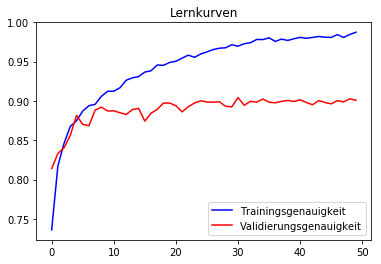

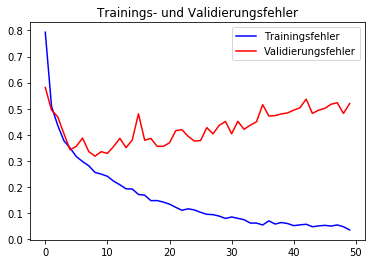

              precision    recall  f1-score   support

     T-shirt       0.87      0.82      0.84      1000
    Trousers       0.98      0.98      0.98      1000
    Pullover       0.80      0.89      0.85      1000
       Dress       0.91      0.87      0.89      1000
        Coat       0.87      0.82      0.84      1000
      Sandal       0.99      0.96      0.98      1000
       Shirt       0.72      0.73      0.73      1000
     Sneaker       0.95      0.96      0.96      1000
         Bag       0.97      0.99      0.98      1000
  Ankle-boot       0.96      0.97      0.96      1000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



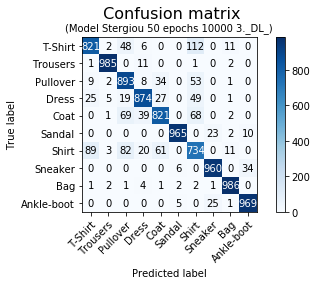

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 10000 samples, validate on 10000 samples
Epoch 1/50
10000/10000 [==============================] - 14s 1ms/step - loss: 0.7960 - acc: 0.7367 - val_loss: 0.5781 - val_acc: 0.8222
Epoch 2/50
10000/10000 [==============================] - 7s 683us/step - loss: 0.5117 - acc: 0.8208 - val_loss: 0.4347 - val_acc: 0.8544
Epoch 3/50
10000/10000 [==============================] - 7s 679us/step - loss: 0.4196 - acc: 0.8508 - val_loss: 0.4060 - val_acc: 0.8592
Epoch 4/50
10000/10000 [==============================] - 7s 677us/step - loss: 0.3912 - acc: 0.8620 - val_loss: 0.4457 - val_acc: 0.8486
Epoch 5/50
10000/10000 [==============================] - 7s 680us/step - loss: 0.3415 - acc: 0.8768 - val_loss: 0.3319 - val_acc: 0.8855
Epoch 6/50
10000/10000 [==============================] - 7s 676us/step - loss: 0.3115 - acc: 0.8881 - val_loss: 0.3422 - val_acc: 0.8807
Epoch 7/50
10000/10

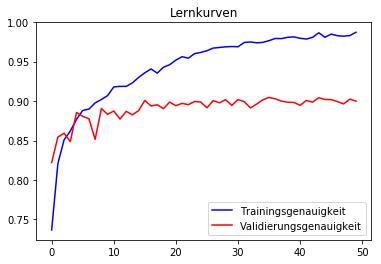

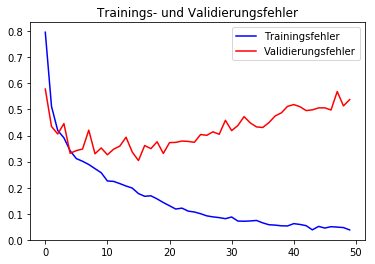

              precision    recall  f1-score   support

     T-shirt       0.85      0.83      0.84      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.86      0.83      0.85      1000
       Dress       0.89      0.91      0.90      1000
        Coat       0.86      0.81      0.83      1000
      Sandal       0.99      0.96      0.98      1000
       Shirt       0.69      0.77      0.72      1000
     Sneaker       0.95      0.96      0.96      1000
         Bag       0.98      0.98      0.98      1000
  Ankle-boot       0.96      0.97      0.97      1000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



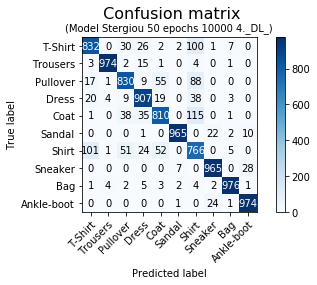

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 10000 samples, validate on 10000 samples
Epoch 1/50
10000/10000 [==============================] - 14s 1ms/step - loss: 0.7917 - acc: 0.7395 - val_loss: 0.5468 - val_acc: 0.8211
Epoch 2/50
10000/10000 [==============================] - 7s 674us/step - loss: 0.4984 - acc: 0.8239 - val_loss: 0.4646 - val_acc: 0.8399
Epoch 3/50
10000/10000 [==============================] - 7s 679us/step - loss: 0.4126 - acc: 0.8535 - val_loss: 0.4019 - val_acc: 0.8643
Epoch 4/50
10000/10000 [==============================] - 7s 677us/step - loss: 0.3790 - acc: 0.8666 - val_loss: 0.3625 - val_acc: 0.8760
Epoch 5/50
10000/10000 [==============================] - 7s 677us/step - loss: 0.3308 - acc: 0.8810 - val_loss: 0.3636 - val_acc: 0.8774
Epoch 6/50
10000/10000 [==============================] - 7s 667us/step - loss: 0.3131 - acc: 0.8890 - val_loss: 0.3953 - val_acc: 0.8652
Epoch 7/50
10000/10

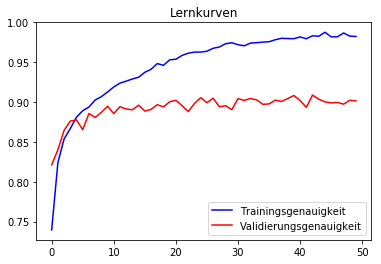

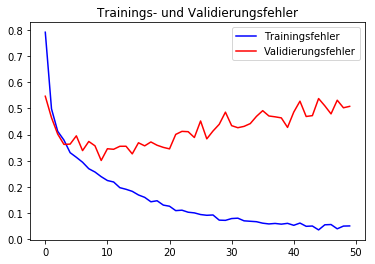

              precision    recall  f1-score   support

     T-shirt       0.90      0.77      0.83      1000
    Trousers       0.98      0.98      0.98      1000
    Pullover       0.83      0.89      0.86      1000
       Dress       0.88      0.92      0.90      1000
        Coat       0.86      0.84      0.85      1000
      Sandal       0.99      0.97      0.98      1000
       Shirt       0.71      0.76      0.74      1000
     Sneaker       0.93      0.98      0.95      1000
         Bag       0.98      0.98      0.98      1000
  Ankle-boot       0.97      0.94      0.96      1000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



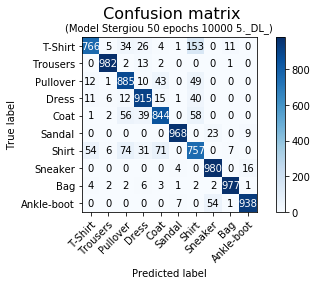

In [0]:
# 5mal Trainingsmenge 10000
runningModels_B(1,5,X_tr_10000, y_tr_10000, X_test, y_test, 10000)

In [0]:
downloader_opt_final_B(10000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 20000 samples, validate on 10000 samples
Epoch 1/50
20000/20000 [==============================] - 21s 1ms/step - loss: 0.6671 - acc: 0.7744 - val_loss: 0.5160 - val_acc: 0.8381
Epoch 2/50
20000/20000 [==============================] - 13s 632us/step - loss: 0.4220 - acc: 0.8491 - val_loss: 0.4333 - val_acc: 0.8490
Epoch 3/50
20000/20000 [==============================] - 13s 632us/step - loss: 0.3608 - acc: 0.8717 - val_loss: 0.3184 - val_acc: 0.8880
Epoch 4/50
20000/20000 [==============================] - 13s 631us/step - loss: 0.3253 - acc: 0.8836 - val_loss: 0.3056 - val_acc: 0.8894
Epoch 5/50
20000/20000 [==============================] - 13s 630us/step - loss: 0.3070 - acc: 0.8898 - val_loss: 0.3632 - val_acc: 0.8802
Epoch 6/50
20000/20000 [==============================] - 12s 624us/step - loss: 0.2851 - acc: 0.8971 - val_loss: 0.2834 - val_acc: 0.9012
Epoch 7/50
200

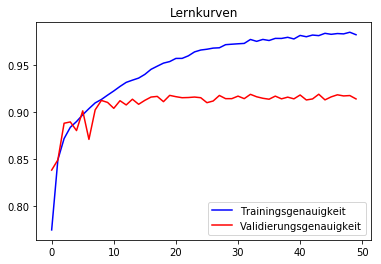

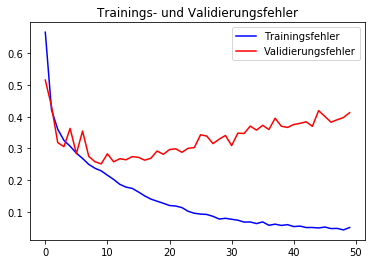

              precision    recall  f1-score   support

     T-shirt       0.86      0.87      0.87      1000
    Trousers       0.99      0.98      0.99      1000
    Pullover       0.94      0.81      0.87      1000
       Dress       0.93      0.89      0.91      1000
        Coat       0.85      0.89      0.87      1000
      Sandal       0.99      0.97      0.98      1000
       Shirt       0.71      0.80      0.76      1000
     Sneaker       0.94      0.98      0.96      1000
         Bag       0.98      0.98      0.98      1000
  Ankle-boot       0.97      0.96      0.96      1000

    accuracy                           0.91     10000
   macro avg       0.92      0.91      0.91     10000
weighted avg       0.92      0.91      0.91     10000



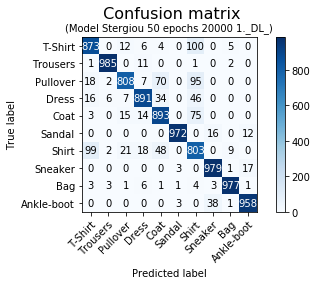

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 20000 samples, validate on 10000 samples
Epoch 1/50
20000/20000 [==============================] - 21s 1ms/step - loss: 0.6661 - acc: 0.7747 - val_loss: 0.4389 - val_acc: 0.8453
Epoch 2/50
20000/20000 [==============================] - 13s 628us/step - loss: 0.4248 - acc: 0.8470 - val_loss: 0.3788 - val_acc: 0.8614
Epoch 3/50
20000/20000 [==============================] - 12s 624us/step - loss: 0.3672 - acc: 0.8697 - val_loss: 0.3312 - val_acc: 0.8845
Epoch 4/50
20000/20000 [==============================] - 12s 622us/step - loss: 0.3276 - acc: 0.8813 - val_loss: 0.3064 - val_acc: 0.8917
Epoch 5/50
20000/20000 [==============================] - 13s 635us/step - loss: 0.3073 - acc: 0.8894 - val_loss: 0.2823 - val_acc: 0.9007
Epoch 6/50
20000/20000 [==============================] - 12s 618us/step - loss: 0.2886 - acc: 0.8976 - val_loss: 0.2795 - val_acc: 0.8989
Epoch 7/50
200

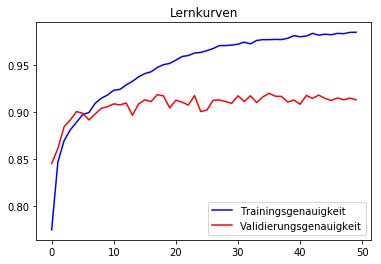

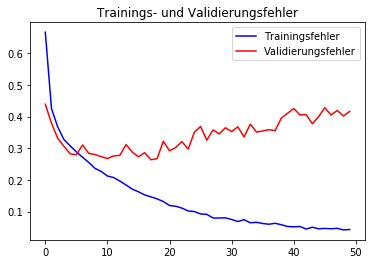

              precision    recall  f1-score   support

     T-shirt       0.88      0.83      0.85      1000
    Trousers       0.99      0.98      0.99      1000
    Pullover       0.87      0.88      0.88      1000
       Dress       0.93      0.90      0.91      1000
        Coat       0.83      0.91      0.87      1000
      Sandal       0.99      0.97      0.98      1000
       Shirt       0.75      0.76      0.75      1000
     Sneaker       0.94      0.98      0.96      1000
         Bag       0.98      0.98      0.98      1000
  Ankle-boot       0.97      0.96      0.97      1000

    accuracy                           0.91     10000
   macro avg       0.91      0.91      0.91     10000
weighted avg       0.91      0.91      0.91     10000



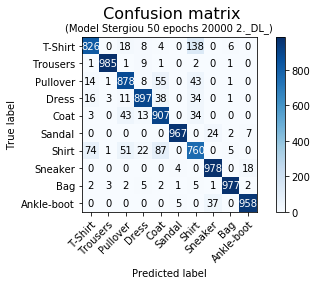

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 20000 samples, validate on 10000 samples
Epoch 1/50
20000/20000 [==============================] - 22s 1ms/step - loss: 0.6783 - acc: 0.7712 - val_loss: 0.3863 - val_acc: 0.8630
Epoch 2/50
20000/20000 [==============================] - 12s 611us/step - loss: 0.4354 - acc: 0.8463 - val_loss: 0.3372 - val_acc: 0.8785
Epoch 3/50
20000/20000 [==============================] - 12s 612us/step - loss: 0.3710 - acc: 0.8675 - val_loss: 0.3422 - val_acc: 0.8790
Epoch 4/50
20000/20000 [==============================] - 12s 618us/step - loss: 0.3305 - acc: 0.8818 - val_loss: 0.2904 - val_acc: 0.8974
Epoch 5/50
20000/20000 [==============================] - 12s 611us/step - loss: 0.3005 - acc: 0.8930 - val_loss: 0.3406 - val_acc: 0.8720
Epoch 6/50
20000/20000 [==============================] - 12s 615us/step - loss: 0.2874 - acc: 0.8994 - val_loss: 0.3388 - val_acc: 0.8821
Epoch 7/50
200

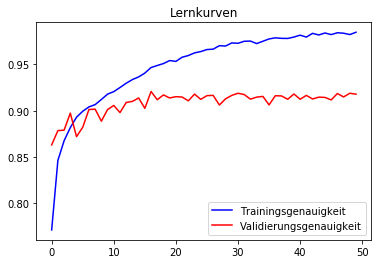

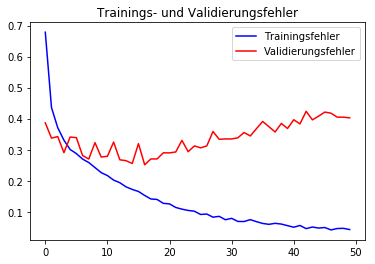

              precision    recall  f1-score   support

     T-shirt       0.87      0.85      0.86      1000
    Trousers       1.00      0.97      0.98      1000
    Pullover       0.85      0.90      0.87      1000
       Dress       0.90      0.93      0.91      1000
        Coat       0.90      0.84      0.87      1000
      Sandal       0.99      0.97      0.98      1000
       Shirt       0.78      0.79      0.78      1000
     Sneaker       0.95      0.98      0.97      1000
         Bag       0.98      0.98      0.98      1000
  Ankle-boot       0.97      0.96      0.97      1000

    accuracy                           0.92     10000
   macro avg       0.92      0.92      0.92     10000
weighted avg       0.92      0.92      0.92     10000



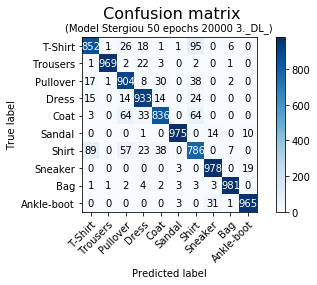

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 20000 samples, validate on 10000 samples
Epoch 1/50
20000/20000 [==============================] - 22s 1ms/step - loss: 0.6598 - acc: 0.7765 - val_loss: 0.5375 - val_acc: 0.8248
Epoch 2/50
20000/20000 [==============================] - 12s 617us/step - loss: 0.4295 - acc: 0.8478 - val_loss: 0.3593 - val_acc: 0.8772
Epoch 3/50
20000/20000 [==============================] - 12s 614us/step - loss: 0.3696 - acc: 0.8678 - val_loss: 0.3272 - val_acc: 0.8854
Epoch 4/50
20000/20000 [==============================] - 12s 618us/step - loss: 0.3345 - acc: 0.8803 - val_loss: 0.2993 - val_acc: 0.8932
Epoch 5/50
20000/20000 [==============================] - 12s 621us/step - loss: 0.3030 - acc: 0.8912 - val_loss: 0.2927 - val_acc: 0.8920
Epoch 6/50
20000/20000 [==============================] - 12s 614us/step - loss: 0.2851 - acc: 0.8983 - val_loss: 0.2752 - val_acc: 0.9026
Epoch 7/50
200

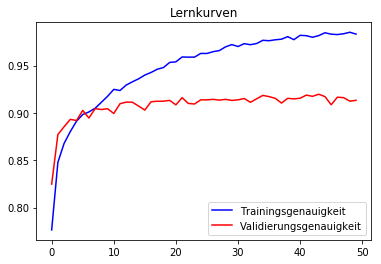

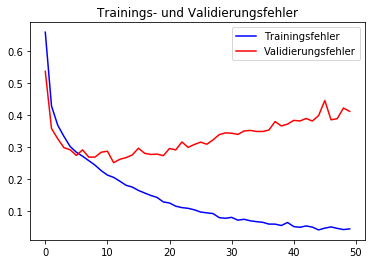

              precision    recall  f1-score   support

     T-shirt       0.81      0.91      0.86      1000
    Trousers       0.99      0.98      0.98      1000
    Pullover       0.84      0.90      0.87      1000
       Dress       0.93      0.89      0.91      1000
        Coat       0.87      0.87      0.87      1000
      Sandal       0.99      0.96      0.98      1000
       Shirt       0.83      0.70      0.76      1000
     Sneaker       0.94      0.98      0.96      1000
         Bag       0.99      0.98      0.98      1000
  Ankle-boot       0.97      0.96      0.97      1000

    accuracy                           0.91     10000
   macro avg       0.91      0.91      0.91     10000
weighted avg       0.91      0.91      0.91     10000



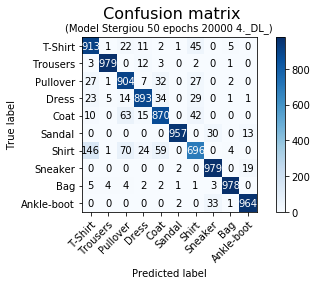

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 20000 samples, validate on 10000 samples
Epoch 1/50
20000/20000 [==============================] - 23s 1ms/step - loss: 0.6773 - acc: 0.7700 - val_loss: 0.3841 - val_acc: 0.8708
Epoch 2/50
20000/20000 [==============================] - 12s 622us/step - loss: 0.4321 - acc: 0.8474 - val_loss: 0.3544 - val_acc: 0.8687
Epoch 3/50
20000/20000 [==============================] - 12s 620us/step - loss: 0.3659 - acc: 0.8675 - val_loss: 0.3394 - val_acc: 0.8787
Epoch 4/50
20000/20000 [==============================] - 13s 630us/step - loss: 0.3264 - acc: 0.8828 - val_loss: 0.3251 - val_acc: 0.8864
Epoch 5/50
20000/20000 [==============================] - 12s 618us/step - loss: 0.3063 - acc: 0.8903 - val_loss: 0.2859 - val_acc: 0.8996
Epoch 6/50
20000/20000 [==============================] - 12s 616us/step - loss: 0.2897 - acc: 0.8972 - val_loss: 0.2558 - val_acc: 0.9040
Epoch 7/50
200

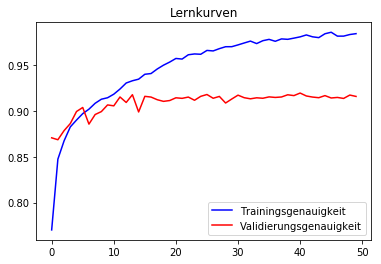

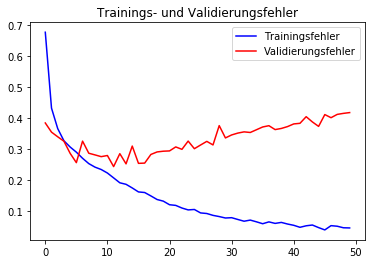

              precision    recall  f1-score   support

     T-shirt       0.87      0.85      0.86      1000
    Trousers       1.00      0.98      0.99      1000
    Pullover       0.88      0.89      0.88      1000
       Dress       0.92      0.92      0.92      1000
        Coat       0.87      0.87      0.87      1000
      Sandal       0.98      0.98      0.98      1000
       Shirt       0.74      0.77      0.75      1000
     Sneaker       0.94      0.98      0.96      1000
         Bag       0.99      0.98      0.98      1000
  Ankle-boot       0.98      0.94      0.96      1000

    accuracy                           0.92     10000
   macro avg       0.92      0.92      0.92     10000
weighted avg       0.92      0.92      0.92     10000



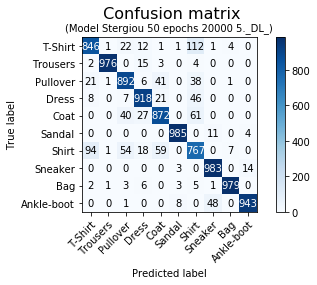

In [0]:
# 5mal Trainingsmenge 20000
runningModels_B(1,5,X_tr_20000, y_tr_20000, X_test, y_test, 20000)

In [0]:
downloader_opt_final_B(20000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 40000 samples, validate on 10000 samples
Epoch 1/50
40000/40000 [==============================] - 24s 602us/step - loss: 0.5449 - acc: 0.8138 - val_loss: 0.3498 - val_acc: 0.8748
Epoch 2/50
40000/40000 [==============================] - 19s 467us/step - loss: 0.3563 - acc: 0.8721 - val_loss: 0.2955 - val_acc: 0.8922
Epoch 3/50
40000/40000 [==============================] - 19s 468us/step - loss: 0.3152 - acc: 0.8875 - val_loss: 0.2691 - val_acc: 0.9035
Epoch 4/50
40000/40000 [==============================] - 19s 474us/step - loss: 0.2884 - acc: 0.8971 - val_loss: 0.3250 - val_acc: 0.8810
Epoch 5/50
40000/40000 [==============================] - 19s 467us/step - loss: 0.2679 - acc: 0.9019 - val_loss: 0.2671 - val_acc: 0.9024
Epoch 6/50
40000/40000 [==============================] - 19s 482us/step - loss: 0.2470 - acc: 0.9104 - val_loss: 0.2500 - val_acc: 0.9123
Epoch 7/50
4

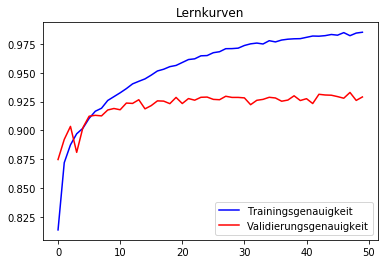

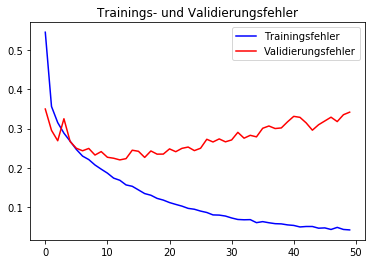

              precision    recall  f1-score   support

     T-shirt       0.90      0.87      0.88      1000
    Trousers       0.99      0.99      0.99      1000
    Pullover       0.86      0.93      0.90      1000
       Dress       0.91      0.93      0.92      1000
        Coat       0.92      0.86      0.89      1000
      Sandal       0.99      0.98      0.99      1000
       Shirt       0.79      0.79      0.79      1000
     Sneaker       0.97      0.98      0.97      1000
         Bag       0.99      0.98      0.99      1000
  Ankle-boot       0.98      0.97      0.97      1000

    accuracy                           0.93     10000
   macro avg       0.93      0.93      0.93     10000
weighted avg       0.93      0.93      0.93     10000



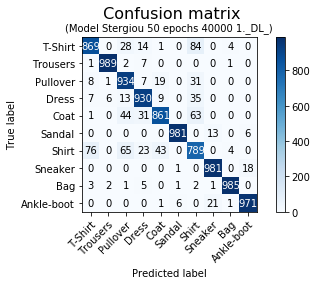

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 40000 samples, validate on 10000 samples
Epoch 1/50
40000/40000 [==============================] - 25s 613us/step - loss: 0.5361 - acc: 0.8144 - val_loss: 0.3707 - val_acc: 0.8693
Epoch 2/50
40000/40000 [==============================] - 19s 466us/step - loss: 0.3561 - acc: 0.8730 - val_loss: 0.3205 - val_acc: 0.8874
Epoch 3/50
40000/40000 [==============================] - 19s 468us/step - loss: 0.3175 - acc: 0.8858 - val_loss: 0.2663 - val_acc: 0.9054
Epoch 4/50
40000/40000 [==============================] - 19s 465us/step - loss: 0.2900 - acc: 0.8968 - val_loss: 0.2661 - val_acc: 0.9025
Epoch 5/50
40000/40000 [==============================] - 19s 482us/step - loss: 0.2669 - acc: 0.9036 - val_loss: 0.2566 - val_acc: 0.9071
Epoch 6/50
40000/40000 [==============================] - 18s 450us/step - loss: 0.2499 - acc: 0.9100 - val_loss: 0.2904 - val_acc: 0.9018
Epoch 7/50
4

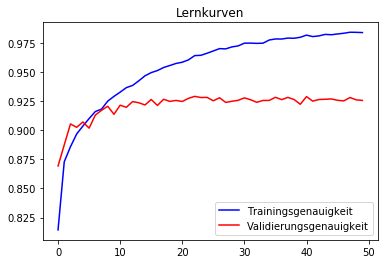

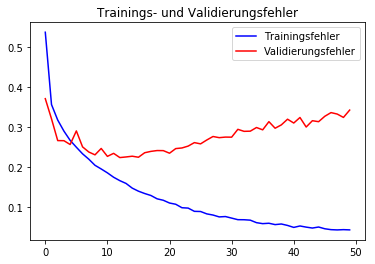

              precision    recall  f1-score   support

     T-shirt       0.87      0.88      0.88      1000
    Trousers       0.99      0.99      0.99      1000
    Pullover       0.82      0.94      0.88      1000
       Dress       0.93      0.93      0.93      1000
        Coat       0.91      0.84      0.88      1000
      Sandal       0.99      0.98      0.99      1000
       Shirt       0.82      0.74      0.78      1000
     Sneaker       0.96      0.99      0.97      1000
         Bag       0.99      0.99      0.99      1000
  Ankle-boot       0.98      0.97      0.97      1000

    accuracy                           0.93     10000
   macro avg       0.93      0.93      0.93     10000
weighted avg       0.93      0.93      0.93     10000



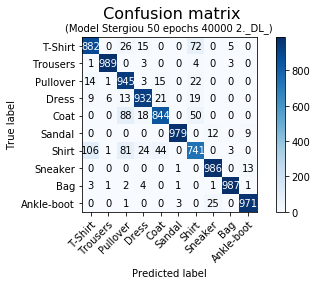

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 40000 samples, validate on 10000 samples
Epoch 1/50
40000/40000 [==============================] - 24s 594us/step - loss: 0.5386 - acc: 0.8158 - val_loss: 0.4442 - val_acc: 0.8478
Epoch 2/50
40000/40000 [==============================] - 18s 462us/step - loss: 0.3587 - acc: 0.8713 - val_loss: 0.3171 - val_acc: 0.8858
Epoch 3/50
40000/40000 [==============================] - 18s 462us/step - loss: 0.3142 - acc: 0.8866 - val_loss: 0.2863 - val_acc: 0.8932
Epoch 4/50
40000/40000 [==============================] - 19s 467us/step - loss: 0.2893 - acc: 0.8952 - val_loss: 0.3344 - val_acc: 0.8776
Epoch 5/50
40000/40000 [==============================] - 19s 467us/step - loss: 0.2707 - acc: 0.9018 - val_loss: 0.2673 - val_acc: 0.9030
Epoch 6/50
40000/40000 [==============================] - 19s 467us/step - loss: 0.2497 - acc: 0.9099 - val_loss: 0.2393 - val_acc: 0.9135
Epoch 7/50
4

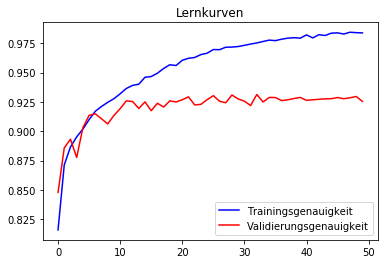

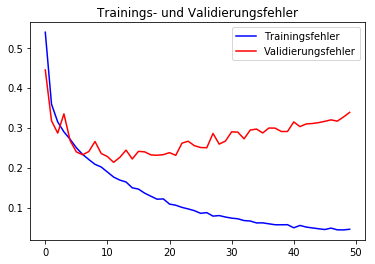

              precision    recall  f1-score   support

     T-shirt       0.87      0.90      0.89      1000
    Trousers       0.99      0.99      0.99      1000
    Pullover       0.84      0.92      0.88      1000
       Dress       0.92      0.94      0.93      1000
        Coat       0.89      0.85      0.87      1000
      Sandal       0.99      0.98      0.99      1000
       Shirt       0.82      0.75      0.79      1000
     Sneaker       0.98      0.96      0.97      1000
         Bag       0.99      0.99      0.99      1000
  Ankle-boot       0.96      0.98      0.97      1000

    accuracy                           0.93     10000
   macro avg       0.93      0.93      0.92     10000
weighted avg       0.93      0.93      0.92     10000



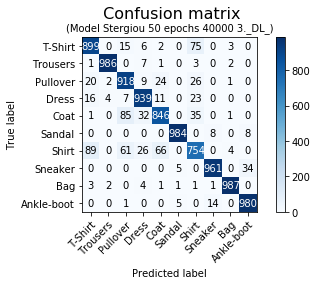

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 40000 samples, validate on 10000 samples
Epoch 1/50
40000/40000 [==============================] - 29s 713us/step - loss: 0.5505 - acc: 0.8108 - val_loss: 0.4001 - val_acc: 0.8562
Epoch 2/50
40000/40000 [==============================] - 22s 547us/step - loss: 0.3630 - acc: 0.8708 - val_loss: 0.3141 - val_acc: 0.8856
Epoch 3/50
40000/40000 [==============================] - 20s 500us/step - loss: 0.3169 - acc: 0.8866 - val_loss: 0.2756 - val_acc: 0.9031
Epoch 4/50
40000/40000 [==============================] - 21s 529us/step - loss: 0.2876 - acc: 0.8965 - val_loss: 0.2785 - val_acc: 0.8981
Epoch 5/50
40000/40000 [==============================] - 20s 501us/step - loss: 0.2687 - acc: 0.9026 - val_loss: 0.2417 - val_acc: 0.9096
Epoch 6/50
40000/40000 [==============================] - 22s 552us/step - loss: 0.2528 - acc: 0.9074 - val_loss: 0.2365 - val_acc: 0.9142
Epoch 7/50
4

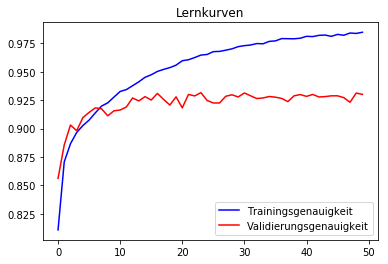

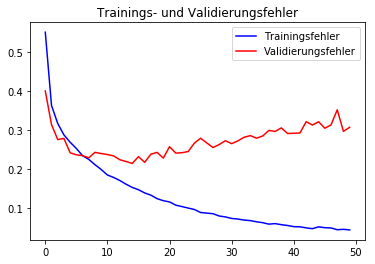

              precision    recall  f1-score   support

     T-shirt       0.89      0.87      0.88      1000
    Trousers       1.00      0.98      0.99      1000
    Pullover       0.93      0.90      0.91      1000
       Dress       0.93      0.92      0.93      1000
        Coat       0.89      0.90      0.89      1000
      Sandal       0.99      0.98      0.99      1000
       Shirt       0.77      0.83      0.80      1000
     Sneaker       0.95      0.98      0.97      1000
         Bag       0.99      0.99      0.99      1000
  Ankle-boot       0.98      0.96      0.97      1000

    accuracy                           0.93     10000
   macro avg       0.93      0.93      0.93     10000
weighted avg       0.93      0.93      0.93     10000



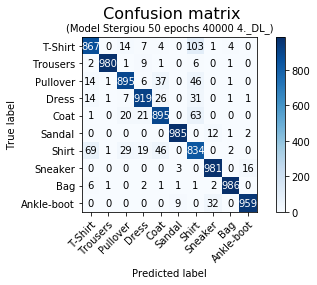

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 40000 samples, validate on 10000 samples
Epoch 1/50
40000/40000 [==============================] - 30s 749us/step - loss: 0.5423 - acc: 0.8146 - val_loss: 0.3513 - val_acc: 0.8812
Epoch 2/50
40000/40000 [==============================] - 23s 582us/step - loss: 0.3551 - acc: 0.8732 - val_loss: 0.3125 - val_acc: 0.8905
Epoch 3/50
40000/40000 [==============================] - 24s 594us/step - loss: 0.3153 - acc: 0.8860 - val_loss: 0.3055 - val_acc: 0.8905
Epoch 4/50
40000/40000 [==============================] - 24s 608us/step - loss: 0.2855 - acc: 0.8963 - val_loss: 0.2498 - val_acc: 0.9081
Epoch 5/50
40000/40000 [==============================] - 23s 573us/step - loss: 0.2708 - acc: 0.9034 - val_loss: 0.2554 - val_acc: 0.9079
Epoch 6/50
40000/40000 [==============================] - 23s 565us/step - loss: 0.2530 - acc: 0.9081 - val_loss: 0.2340 - val_acc: 0.9122
Epoch 7/50
4

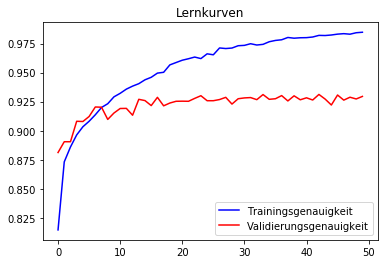

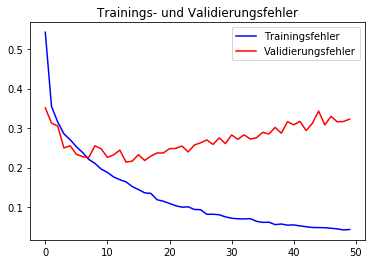

              precision    recall  f1-score   support

     T-shirt       0.89      0.87      0.88      1000
    Trousers       1.00      0.99      0.99      1000
    Pullover       0.89      0.90      0.90      1000
       Dress       0.93      0.94      0.93      1000
        Coat       0.89      0.89      0.89      1000
      Sandal       0.99      0.99      0.99      1000
       Shirt       0.78      0.79      0.78      1000
     Sneaker       0.97      0.98      0.98      1000
         Bag       0.98      0.99      0.99      1000
  Ankle-boot       0.97      0.97      0.97      1000

    accuracy                           0.93     10000
   macro avg       0.93      0.93      0.93     10000
weighted avg       0.93      0.93      0.93     10000



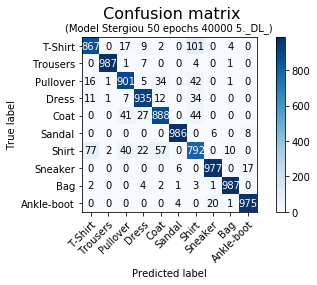

In [0]:
# 5mal Trainingsmenge 40000
runningModels_B(1,5,X_tr_40000, y_tr_40000, X_test, y_test, 40000)

In [0]:
downloader_opt_final_B(40000)

In [0]:
def downloader_opt_final_B(number_trainingdata):
  for i in range(1, 6):
    file_name = str(i)+"._"+str(number_trainingdata)+"_"
    file_name2 = str(i)+"._DL_"+str(number_trainingdata)+"_"
    files.download(file_name+"Lernkurve_FM_6Conv_acc.png")
    files.download(file_name+"Lernkurve_FM_6Conv_loss.png")
    files.download(file_name2+"Confusion_matrix.png")
    files.download(file_name2+"Testzeiten.csv")
    files.download(file_name2+"Trainingszeiten.csv")
    files.download(file_name2+"CNN_6Conv_epochs50_B.hdf5")
    files.download(file_name2+"CNN_6Conv_epochs50_B_weights.hdf5")
    #files.download(file_name2+"beste_Epoche_full.csv")
    files.download(file_name2+"metrics.csv")
    files.download(file_name2+"precision_recall_fscore.csv")
    files.download(file_name2+"roc_auc_score_single_class.npy")
    files.download(file_name2+"y_pred_label.npy")

In [0]:
###########################################################################################################
###   "Beginn Training Split-Mengen C"
###    3. AUFTEILUNG   !!!!
###    Trainingsdatensätze unterschiedlicher Größe erstellen
###########################################################################################################

X_tr_40000, y_tr_40000, X_tr_20000, y_tr_20000, X_tr_10000, y_tr_10000, X_tr_5000, y_tr_5000, X_tr_2000, y_tr_2000, X_tr_1000, y_tr_1000, X_tr_500, y_tr_500 = make_subsets_training_data_C(X_train, y_train)

In [0]:
###########################################################################################################
###########   ohne Data Augmentation
###########   pro Trainingsmenge 5 Durchläufe
###########################################################################################################

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/50
500/500 [==============================] - 13s 25ms/step - loss: 1.8271 - acc: 0.4420 - val_loss: 1.5020 - val_acc: 0.6235
Epoch 2/50
500/500 [==============================] - 2s 4ms/step - loss: 1.1039 - acc: 0.6620 - val_loss: 0.9858 - val_acc: 0.7163
Epoch 3/50
500/500 [==============================] - 2s 4ms/step - loss: 0.8658 - acc: 0.7280 - val_loss: 1.0425 - val_acc: 0.7134
Epoch 4/50
500/500 [==============================] - 2s 4ms/step - loss: 0.7014 - acc: 0.7560 - val_loss: 0.9085 - val_acc: 0.7387
Epoch 5/50
500/500 [==============================] - 2s 4ms/step - loss: 0.5912 - acc: 0.7760 - val_loss: 1.0566 - val_acc: 0.6966
Epoch 6/50
500/500 [==============================] - 2s 4ms/step - loss: 0.6636 - acc: 0.7800 - val_loss: 0.9986 - val_acc: 0.7410
Epoch 7/50
500/500 [==============================] - 

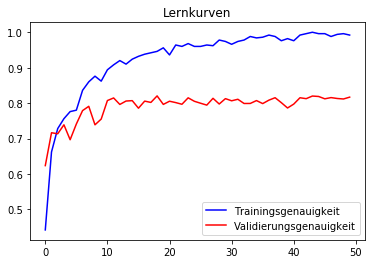

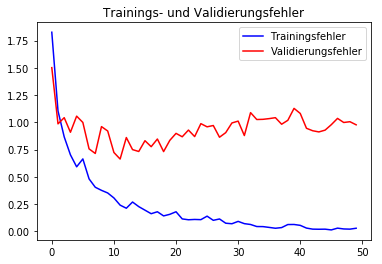

              precision    recall  f1-score   support

     T-shirt       0.79      0.70      0.74      1000
    Trousers       0.99      0.93      0.96      1000
    Pullover       0.75      0.66      0.70      1000
       Dress       0.83      0.81      0.82      1000
        Coat       0.66      0.79      0.72      1000
      Sandal       0.97      0.89      0.93      1000
       Shirt       0.52      0.57      0.54      1000
     Sneaker       0.87      0.93      0.90      1000
         Bag       0.94      0.94      0.94      1000
  Ankle-boot       0.92      0.95      0.94      1000

    accuracy                           0.82     10000
   macro avg       0.82      0.82      0.82     10000
weighted avg       0.82      0.82      0.82     10000



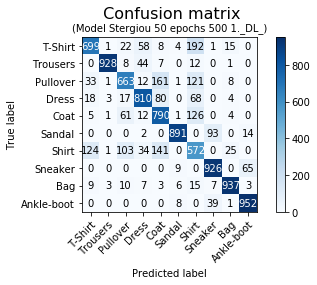

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/50
500/500 [==============================] - 13s 26ms/step - loss: 1.8174 - acc: 0.4320 - val_loss: 1.1539 - val_acc: 0.6700
Epoch 2/50
500/500 [==============================] - 2s 4ms/step - loss: 0.9953 - acc: 0.6580 - val_loss: 0.8289 - val_acc: 0.7448
Epoch 3/50
500/500 [==============================] - 2s 4ms/step - loss: 0.7371 - acc: 0.7280 - val_loss: 0.8630 - val_acc: 0.7392
Epoch 4/50
500/500 [==============================] - 2s 4ms/step - loss: 0.6805 - acc: 0.7560 - val_loss: 0.8326 - val_acc: 0.7603
Epoch 5/50
500/500 [==============================] - 2s 4ms/step - loss: 0.5095 - acc: 0.8140 - val_loss: 1.0234 - val_acc: 0.7377
Epoch 6/50
500/500 [==============================] - 2s 4ms/step - loss: 0.5052 - acc: 0.8280 - val_loss: 0.7196 - val_acc: 0.7860
Epoch 7/50
500/500 [==============================] - 

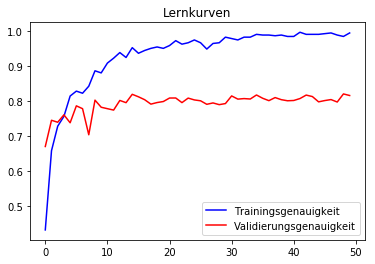

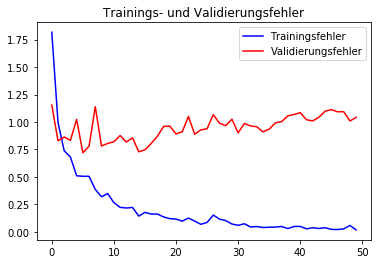

              precision    recall  f1-score   support

     T-shirt       0.72      0.79      0.75      1000
    Trousers       0.97      0.95      0.96      1000
    Pullover       0.71      0.67      0.69      1000
       Dress       0.75      0.90      0.81      1000
        Coat       0.67      0.78      0.72      1000
      Sandal       0.98      0.83      0.90      1000
       Shirt       0.62      0.41      0.49      1000
     Sneaker       0.83      0.96      0.89      1000
         Bag       0.96      0.93      0.94      1000
  Ankle-boot       0.94      0.94      0.94      1000

    accuracy                           0.82     10000
   macro avg       0.82      0.82      0.81     10000
weighted avg       0.82      0.82      0.81     10000



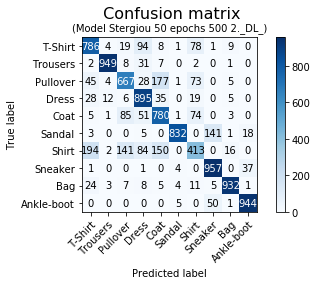

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/50
500/500 [==============================] - 13s 27ms/step - loss: 1.7186 - acc: 0.4980 - val_loss: 1.0972 - val_acc: 0.6466
Epoch 2/50
500/500 [==============================] - 2s 4ms/step - loss: 1.0466 - acc: 0.6660 - val_loss: 1.0699 - val_acc: 0.7141
Epoch 3/50
500/500 [==============================] - 2s 4ms/step - loss: 0.8047 - acc: 0.7420 - val_loss: 0.9536 - val_acc: 0.7091
Epoch 4/50
500/500 [==============================] - 2s 4ms/step - loss: 0.6964 - acc: 0.7480 - val_loss: 1.1729 - val_acc: 0.6948
Epoch 5/50
500/500 [==============================] - 2s 4ms/step - loss: 0.6581 - acc: 0.7700 - val_loss: 1.3694 - val_acc: 0.6388
Epoch 6/50
500/500 [==============================] - 2s 4ms/step - loss: 0.6465 - acc: 0.7780 - val_loss: 0.7743 - val_acc: 0.7509
Epoch 7/50
500/500 [==============================] - 

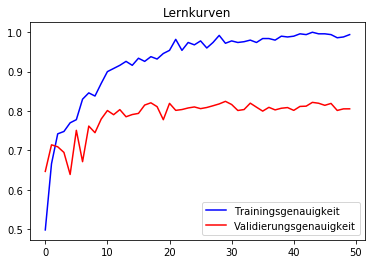

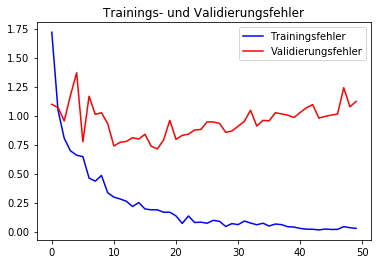

              precision    recall  f1-score   support

     T-shirt       0.77      0.64      0.70      1000
    Trousers       0.99      0.92      0.96      1000
    Pullover       0.78      0.62      0.69      1000
       Dress       0.83      0.82      0.82      1000
        Coat       0.67      0.80      0.73      1000
      Sandal       0.96      0.88      0.92      1000
       Shirt       0.50      0.60      0.55      1000
     Sneaker       0.88      0.84      0.86      1000
         Bag       0.93      0.95      0.94      1000
  Ankle-boot       0.85      0.96      0.90      1000

    accuracy                           0.81     10000
   macro avg       0.82      0.81      0.81     10000
weighted avg       0.82      0.81      0.81     10000



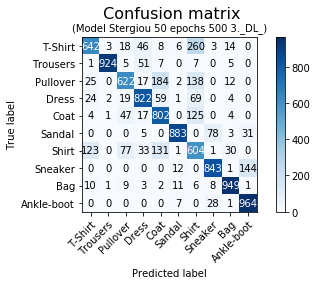

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/50
500/500 [==============================] - 14s 28ms/step - loss: 1.7491 - acc: 0.4880 - val_loss: 1.3415 - val_acc: 0.5959
Epoch 2/50
500/500 [==============================] - 2s 4ms/step - loss: 1.0533 - acc: 0.6440 - val_loss: 1.0292 - val_acc: 0.7055
Epoch 3/50
500/500 [==============================] - 2s 4ms/step - loss: 0.7885 - acc: 0.7240 - val_loss: 0.8477 - val_acc: 0.7449
Epoch 4/50
500/500 [==============================] - 2s 4ms/step - loss: 0.6988 - acc: 0.7600 - val_loss: 0.7706 - val_acc: 0.7566
Epoch 5/50
500/500 [==============================] - 2s 4ms/step - loss: 0.6245 - acc: 0.7920 - val_loss: 0.8452 - val_acc: 0.7574
Epoch 6/50
500/500 [==============================] - 2s 4ms/step - loss: 0.5930 - acc: 0.7920 - val_loss: 1.0177 - val_acc: 0.7469
Epoch 7/50
500/500 [==============================] - 

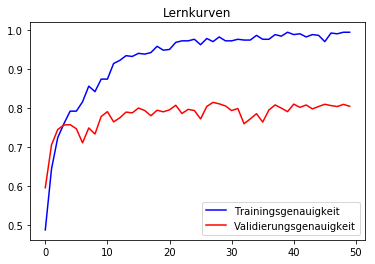

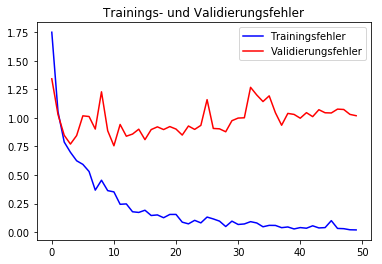

              precision    recall  f1-score   support

     T-shirt       0.81      0.62      0.70      1000
    Trousers       0.96      0.94      0.95      1000
    Pullover       0.63      0.77      0.69      1000
       Dress       0.83      0.77      0.80      1000
        Coat       0.69      0.73      0.71      1000
      Sandal       0.98      0.86      0.92      1000
       Shirt       0.51      0.54      0.52      1000
     Sneaker       0.85      0.92      0.89      1000
         Bag       0.94      0.94      0.94      1000
  Ankle-boot       0.91      0.94      0.92      1000

    accuracy                           0.80     10000
   macro avg       0.81      0.80      0.81     10000
weighted avg       0.81      0.80      0.81     10000



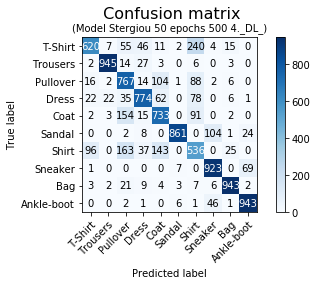

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/50
500/500 [==============================] - 15s 29ms/step - loss: 1.7750 - acc: 0.4560 - val_loss: 1.5225 - val_acc: 0.6430
Epoch 2/50
500/500 [==============================] - 2s 4ms/step - loss: 1.0423 - acc: 0.6760 - val_loss: 1.0555 - val_acc: 0.7067
Epoch 3/50
500/500 [==============================] - 2s 4ms/step - loss: 0.8837 - acc: 0.6880 - val_loss: 0.8742 - val_acc: 0.7386
Epoch 4/50
500/500 [==============================] - 2s 4ms/step - loss: 0.7765 - acc: 0.7300 - val_loss: 1.1857 - val_acc: 0.7002
Epoch 5/50
500/500 [==============================] - 2s 4ms/step - loss: 0.6170 - acc: 0.7720 - val_loss: 1.0029 - val_acc: 0.7310
Epoch 6/50
500/500 [==============================] - 2s 4ms/step - loss: 0.5739 - acc: 0.7900 - val_loss: 0.9426 - val_acc: 0.7478
Epoch 7/50
500/500 [==============================] - 

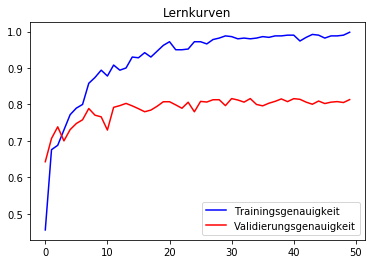

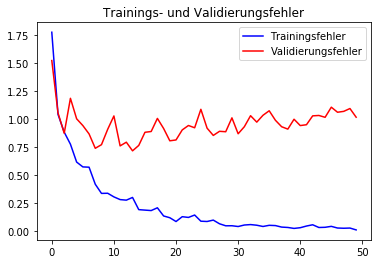

              precision    recall  f1-score   support

     T-shirt       0.75      0.73      0.74      1000
    Trousers       0.97      0.95      0.96      1000
    Pullover       0.67      0.75      0.71      1000
       Dress       0.85      0.80      0.82      1000
        Coat       0.69      0.68      0.68      1000
      Sandal       0.95      0.90      0.93      1000
       Shirt       0.53      0.52      0.52      1000
     Sneaker       0.88      0.92      0.90      1000
         Bag       0.93      0.94      0.94      1000
  Ankle-boot       0.92      0.94      0.93      1000

    accuracy                           0.81     10000
   macro avg       0.82      0.81      0.81     10000
weighted avg       0.82      0.81      0.81     10000



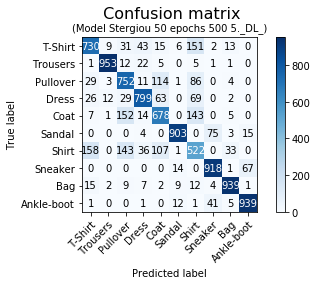

In [0]:
# 5mal Trainingsmenge 500
runningModels_C(1,5,X_tr_500, y_tr_500, X_test, y_test, 500)

In [0]:
downloader_opt_final_C(500)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/50
1000/1000 [==============================] - 16s 16ms/step - loss: 1.4538 - acc: 0.5690 - val_loss: 1.3599 - val_acc: 0.6344
Epoch 2/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.9438 - acc: 0.6930 - val_loss: 0.7506 - val_acc: 0.7539
Epoch 3/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.6977 - acc: 0.7560 - val_loss: 0.8334 - val_acc: 0.7627
Epoch 4/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.6467 - acc: 0.7740 - val_loss: 0.6907 - val_acc: 0.7787
Epoch 5/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.5261 - acc: 0.8130 - val_loss: 0.8533 - val_acc: 0.7648
Epoch 6/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.5209 - acc: 0.8200 - val_loss: 0.6783 - val_acc: 0.8172
Epoch 7/50
1000/1000 [===================

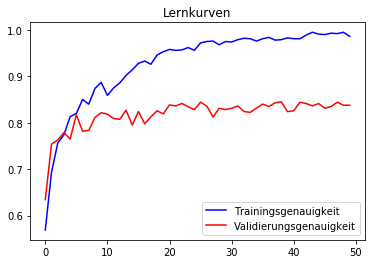

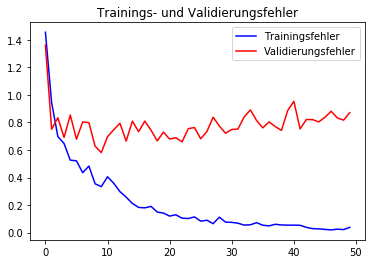

              precision    recall  f1-score   support

     T-shirt       0.83      0.65      0.73      1000
    Trousers       0.98      0.94      0.96      1000
    Pullover       0.77      0.74      0.76      1000
       Dress       0.83      0.86      0.85      1000
        Coat       0.66      0.85      0.75      1000
      Sandal       0.97      0.92      0.95      1000
       Shirt       0.58      0.57      0.57      1000
     Sneaker       0.89      0.96      0.92      1000
         Bag       0.96      0.94      0.95      1000
  Ankle-boot       0.95      0.94      0.94      1000

    accuracy                           0.84     10000
   macro avg       0.84      0.84      0.84     10000
weighted avg       0.84      0.84      0.84     10000



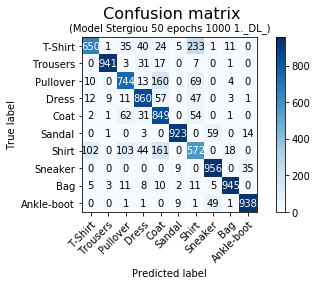

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/50
1000/1000 [==============================] - 16s 16ms/step - loss: 1.3701 - acc: 0.5960 - val_loss: 0.8559 - val_acc: 0.7428
Epoch 2/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.7975 - acc: 0.7370 - val_loss: 1.2815 - val_acc: 0.7090
Epoch 3/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.7181 - acc: 0.7560 - val_loss: 0.8185 - val_acc: 0.7687
Epoch 4/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.6809 - acc: 0.7740 - val_loss: 0.7141 - val_acc: 0.7846
Epoch 5/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.5467 - acc: 0.8080 - val_loss: 0.8414 - val_acc: 0.7746
Epoch 6/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.5210 - acc: 0.8180 - val_loss: 0.6557 - val_acc: 0.8163
Epoch 7/50
1000/1000 [===================

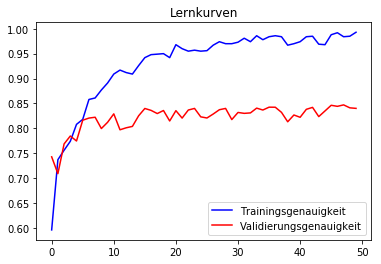

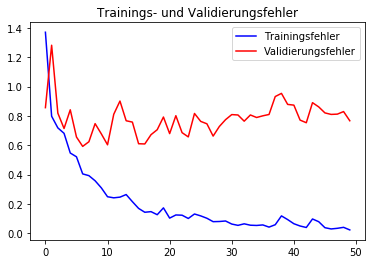

              precision    recall  f1-score   support

     T-shirt       0.81      0.74      0.78      1000
    Trousers       0.99      0.94      0.97      1000
    Pullover       0.79      0.72      0.75      1000
       Dress       0.83      0.86      0.84      1000
        Coat       0.70      0.78      0.74      1000
      Sandal       0.96      0.92      0.94      1000
       Shirt       0.59      0.59      0.59      1000
     Sneaker       0.89      0.94      0.92      1000
         Bag       0.91      0.97      0.94      1000
  Ankle-boot       0.95      0.93      0.94      1000

    accuracy                           0.84     10000
   macro avg       0.84      0.84      0.84     10000
weighted avg       0.84      0.84      0.84     10000



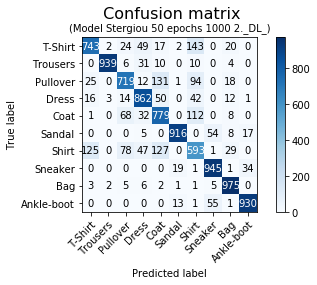

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/50
1000/1000 [==============================] - 16s 16ms/step - loss: 1.3999 - acc: 0.5570 - val_loss: 1.6624 - val_acc: 0.6256
Epoch 2/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.8460 - acc: 0.7230 - val_loss: 1.0657 - val_acc: 0.7036
Epoch 3/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.7775 - acc: 0.7470 - val_loss: 0.9421 - val_acc: 0.7286
Epoch 4/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.6459 - acc: 0.7780 - val_loss: 0.7703 - val_acc: 0.7738
Epoch 5/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.5591 - acc: 0.8140 - val_loss: 1.0654 - val_acc: 0.7361
Epoch 6/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.5971 - acc: 0.8060 - val_loss: 0.7602 - val_acc: 0.7803
Epoch 7/50
1000/1000 [===================

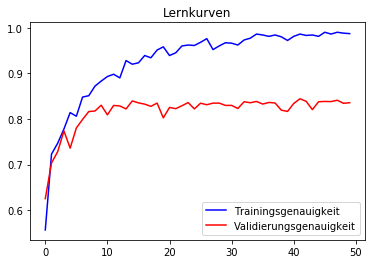

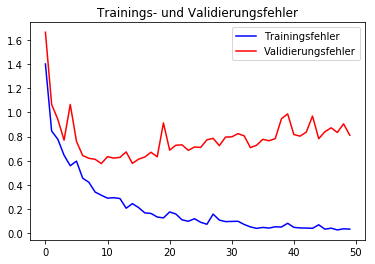

              precision    recall  f1-score   support

     T-shirt       0.82      0.73      0.77      1000
    Trousers       1.00      0.93      0.96      1000
    Pullover       0.79      0.73      0.76      1000
       Dress       0.79      0.90      0.84      1000
        Coat       0.71      0.76      0.74      1000
      Sandal       0.95      0.92      0.93      1000
       Shirt       0.57      0.61      0.59      1000
     Sneaker       0.90      0.89      0.89      1000
         Bag       0.96      0.95      0.95      1000
  Ankle-boot       0.91      0.94      0.93      1000

    accuracy                           0.84     10000
   macro avg       0.84      0.84      0.84     10000
weighted avg       0.84      0.84      0.84     10000



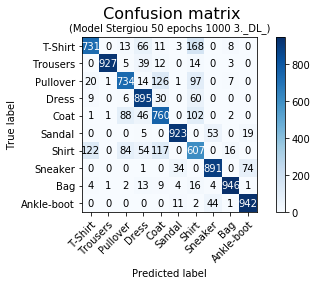

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/50
1000/1000 [==============================] - 17s 17ms/step - loss: 1.4175 - acc: 0.5570 - val_loss: 1.1819 - val_acc: 0.7315
Epoch 2/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.9292 - acc: 0.7020 - val_loss: 1.4219 - val_acc: 0.6516
Epoch 3/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.7201 - acc: 0.7570 - val_loss: 1.0530 - val_acc: 0.7128
Epoch 4/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.6262 - acc: 0.7820 - val_loss: 0.7750 - val_acc: 0.7788
Epoch 5/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.5650 - acc: 0.8150 - val_loss: 0.6413 - val_acc: 0.8044
Epoch 6/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.5248 - acc: 0.8220 - val_loss: 0.6408 - val_acc: 0.8062
Epoch 7/50
1000/1000 [===================

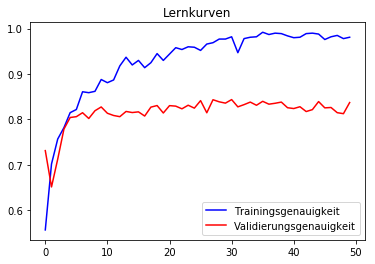

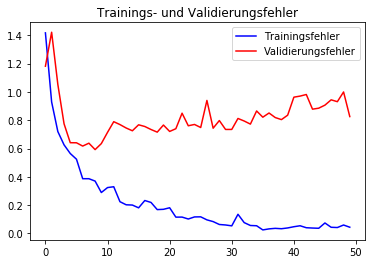

              precision    recall  f1-score   support

     T-shirt       0.84      0.71      0.77      1000
    Trousers       0.98      0.95      0.96      1000
    Pullover       0.70      0.81      0.75      1000
       Dress       0.89      0.81      0.85      1000
        Coat       0.72      0.79      0.75      1000
      Sandal       0.94      0.92      0.93      1000
       Shirt       0.56      0.58      0.57      1000
     Sneaker       0.88      0.93      0.90      1000
         Bag       0.96      0.95      0.96      1000
  Ankle-boot       0.94      0.93      0.93      1000

    accuracy                           0.84     10000
   macro avg       0.84      0.84      0.84     10000
weighted avg       0.84      0.84      0.84     10000



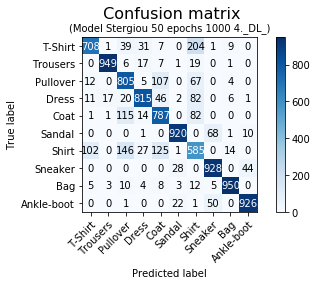

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/50
1000/1000 [==============================] - 18s 18ms/step - loss: 1.4099 - acc: 0.5620 - val_loss: 0.8745 - val_acc: 0.7440
Epoch 2/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.8668 - acc: 0.7170 - val_loss: 0.8849 - val_acc: 0.7288
Epoch 3/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.7251 - acc: 0.7630 - val_loss: 0.7640 - val_acc: 0.7730
Epoch 4/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.5815 - acc: 0.8010 - val_loss: 0.7952 - val_acc: 0.7709
Epoch 5/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.5698 - acc: 0.8120 - val_loss: 0.6483 - val_acc: 0.8145
Epoch 6/50
1000/1000 [==============================] - 2s 2ms/step - loss: 0.5067 - acc: 0.8230 - val_loss: 0.6511 - val_acc: 0.8011
Epoch 7/50
1000/1000 [===================

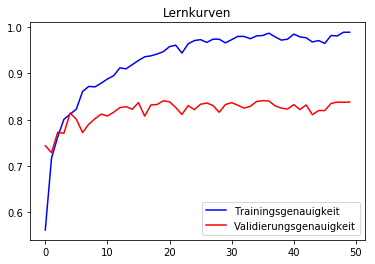

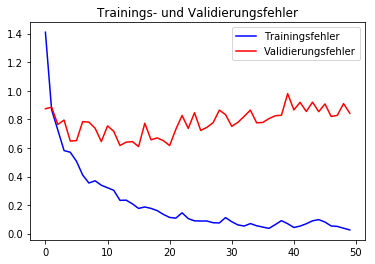

              precision    recall  f1-score   support

     T-shirt       0.71      0.87      0.78      1000
    Trousers       0.97      0.95      0.96      1000
    Pullover       0.76      0.75      0.76      1000
       Dress       0.90      0.81      0.85      1000
        Coat       0.71      0.78      0.74      1000
      Sandal       0.92      0.92      0.92      1000
       Shirt       0.65      0.50      0.57      1000
     Sneaker       0.86      0.96      0.91      1000
         Bag       0.94      0.96      0.95      1000
  Ankle-boot       0.97      0.89      0.93      1000

    accuracy                           0.84     10000
   macro avg       0.84      0.84      0.84     10000
weighted avg       0.84      0.84      0.84     10000



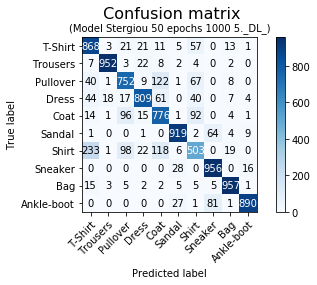

In [0]:
# 5mal Trainingsmenge 1000
runningModels_C(1,5,X_tr_1000, y_tr_1000, X_test, y_test, 1000)

In [0]:
downloader_opt_final_C(1000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/50
2000/2000 [==============================] - 19s 9ms/step - loss: 1.1843 - acc: 0.6360 - val_loss: 0.9944 - val_acc: 0.7125
Epoch 2/50
2000/2000 [==============================] - 3s 1ms/step - loss: 0.7631 - acc: 0.7340 - val_loss: 0.7424 - val_acc: 0.7673
Epoch 3/50
2000/2000 [==============================] - 3s 1ms/step - loss: 0.6222 - acc: 0.7900 - val_loss: 0.8505 - val_acc: 0.7804
Epoch 4/50
2000/2000 [==============================] - 3s 1ms/step - loss: 0.5538 - acc: 0.7980 - val_loss: 0.6356 - val_acc: 0.7948
Epoch 5/50
2000/2000 [==============================] - 3s 1ms/step - loss: 0.4794 - acc: 0.8330 - val_loss: 0.6192 - val_acc: 0.8140
Epoch 6/50
2000/2000 [==============================] - 3s 1ms/step - loss: 0.3821 - acc: 0.8670 - val_loss: 0.6031 - val_acc: 0.8251
Epoch 7/50
2000/2000 [====================

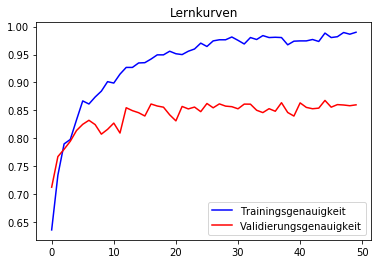

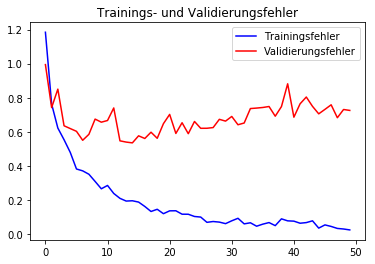

              precision    recall  f1-score   support

     T-shirt       0.84      0.76      0.80      1000
    Trousers       0.97      0.96      0.97      1000
    Pullover       0.77      0.81      0.79      1000
       Dress       0.88      0.85      0.87      1000
        Coat       0.72      0.84      0.78      1000
      Sandal       0.97      0.91      0.94      1000
       Shirt       0.65      0.60      0.63      1000
     Sneaker       0.89      0.96      0.92      1000
         Bag       0.97      0.96      0.96      1000
  Ankle-boot       0.95      0.94      0.94      1000

    accuracy                           0.86     10000
   macro avg       0.86      0.86      0.86     10000
weighted avg       0.86      0.86      0.86     10000



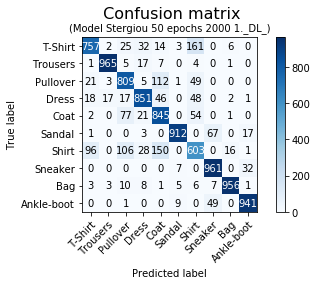

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/50
2000/2000 [==============================] - 19s 10ms/step - loss: 1.2034 - acc: 0.6200 - val_loss: 0.8569 - val_acc: 0.7528
Epoch 2/50
2000/2000 [==============================] - 3s 1ms/step - loss: 0.7715 - acc: 0.7380 - val_loss: 0.7659 - val_acc: 0.7738
Epoch 3/50
2000/2000 [==============================] - 3s 1ms/step - loss: 0.6387 - acc: 0.7730 - val_loss: 0.6482 - val_acc: 0.7885
Epoch 4/50
2000/2000 [==============================] - 3s 1ms/step - loss: 0.6191 - acc: 0.7840 - val_loss: 0.5963 - val_acc: 0.8139
Epoch 5/50
2000/2000 [==============================] - 3s 1ms/step - loss: 0.5214 - acc: 0.8130 - val_loss: 0.6181 - val_acc: 0.8082
Epoch 6/50
2000/2000 [==============================] - 3s 1ms/step - loss: 0.4392 - acc: 0.8450 - val_loss: 0.6625 - val_acc: 0.8103
Epoch 7/50
2000/2000 [===================

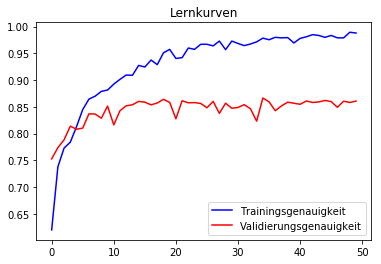

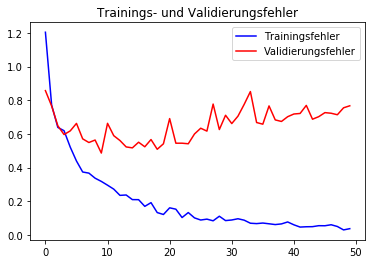

              precision    recall  f1-score   support

     T-shirt       0.79      0.84      0.82      1000
    Trousers       0.98      0.96      0.97      1000
    Pullover       0.75      0.84      0.79      1000
       Dress       0.86      0.86      0.86      1000
        Coat       0.76      0.76      0.76      1000
      Sandal       0.97      0.93      0.95      1000
       Shirt       0.71      0.53      0.60      1000
     Sneaker       0.91      0.95      0.93      1000
         Bag       0.92      0.97      0.94      1000
  Ankle-boot       0.94      0.95      0.95      1000

    accuracy                           0.86     10000
   macro avg       0.86      0.86      0.86     10000
weighted avg       0.86      0.86      0.86     10000



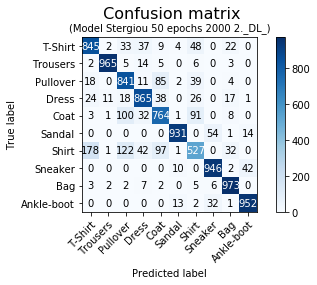

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/50
2000/2000 [==============================] - 20s 10ms/step - loss: 1.1319 - acc: 0.6275 - val_loss: 1.2754 - val_acc: 0.7170
Epoch 2/50
2000/2000 [==============================] - 3s 1ms/step - loss: 0.6942 - acc: 0.7505 - val_loss: 0.6999 - val_acc: 0.7887
Epoch 3/50
2000/2000 [==============================] - 3s 2ms/step - loss: 0.6156 - acc: 0.7890 - val_loss: 0.5949 - val_acc: 0.8160
Epoch 4/50
2000/2000 [==============================] - 3s 1ms/step - loss: 0.5291 - acc: 0.8080 - val_loss: 0.7606 - val_acc: 0.8066
Epoch 5/50
2000/2000 [==============================] - 3s 1ms/step - loss: 0.4787 - acc: 0.8295 - val_loss: 0.6471 - val_acc: 0.7955
Epoch 6/50
2000/2000 [==============================] - 3s 1ms/step - loss: 0.4125 - acc: 0.8450 - val_loss: 0.8339 - val_acc: 0.8009
Epoch 7/50
2000/2000 [===================

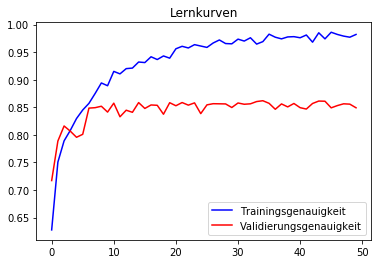

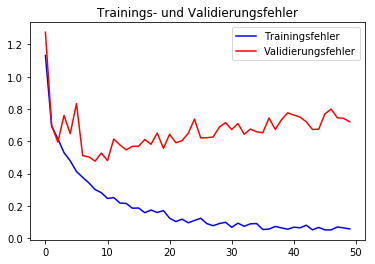

              precision    recall  f1-score   support

     T-shirt       0.81      0.74      0.77      1000
    Trousers       0.98      0.96      0.97      1000
    Pullover       0.71      0.83      0.77      1000
       Dress       0.93      0.80      0.86      1000
        Coat       0.76      0.74      0.75      1000
      Sandal       0.93      0.97      0.95      1000
       Shirt       0.58      0.65      0.61      1000
     Sneaker       0.93      0.93      0.93      1000
         Bag       0.97      0.93      0.95      1000
  Ankle-boot       0.96      0.94      0.95      1000

    accuracy                           0.85     10000
   macro avg       0.86      0.85      0.85     10000
weighted avg       0.86      0.85      0.85     10000



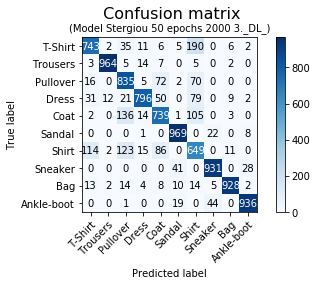

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/50
2000/2000 [==============================] - 20s 10ms/step - loss: 1.1737 - acc: 0.6200 - val_loss: 1.0677 - val_acc: 0.7011
Epoch 2/50
2000/2000 [==============================] - 3s 2ms/step - loss: 0.7254 - acc: 0.7475 - val_loss: 0.7629 - val_acc: 0.7738
Epoch 3/50
2000/2000 [==============================] - 3s 1ms/step - loss: 0.6033 - acc: 0.7925 - val_loss: 0.6389 - val_acc: 0.8052
Epoch 4/50
2000/2000 [==============================] - 3s 1ms/step - loss: 0.5590 - acc: 0.8070 - val_loss: 0.7153 - val_acc: 0.8034
Epoch 5/50
2000/2000 [==============================] - 3s 1ms/step - loss: 0.4841 - acc: 0.8275 - val_loss: 0.6240 - val_acc: 0.8091
Epoch 6/50
2000/2000 [==============================] - 3s 1ms/step - loss: 0.4334 - acc: 0.8425 - val_loss: 0.6266 - val_acc: 0.8075
Epoch 7/50
2000/2000 [===================

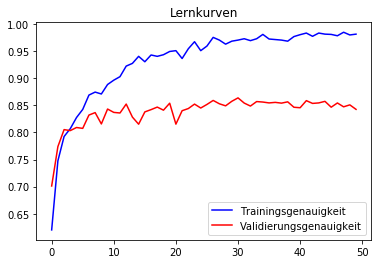

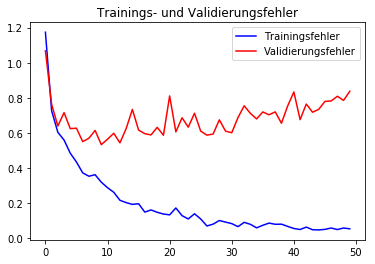

              precision    recall  f1-score   support

     T-shirt       0.81      0.77      0.79      1000
    Trousers       0.98      0.97      0.97      1000
    Pullover       0.70      0.87      0.77      1000
       Dress       0.82      0.91      0.86      1000
        Coat       0.86      0.52      0.65      1000
      Sandal       0.98      0.89      0.93      1000
       Shirt       0.62      0.62      0.62      1000
     Sneaker       0.89      0.95      0.92      1000
         Bag       0.90      0.97      0.93      1000
  Ankle-boot       0.92      0.96      0.94      1000

    accuracy                           0.84     10000
   macro avg       0.85      0.84      0.84     10000
weighted avg       0.85      0.84      0.84     10000



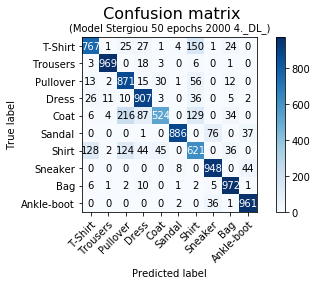

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/50
2000/2000 [==============================] - 21s 10ms/step - loss: 1.2489 - acc: 0.6165 - val_loss: 1.0670 - val_acc: 0.6987
Epoch 2/50
2000/2000 [==============================] - 3s 2ms/step - loss: 0.7514 - acc: 0.7395 - val_loss: 0.7203 - val_acc: 0.7590
Epoch 3/50
2000/2000 [==============================] - 3s 2ms/step - loss: 0.6269 - acc: 0.7750 - val_loss: 0.8297 - val_acc: 0.7757
Epoch 4/50
2000/2000 [==============================] - 3s 2ms/step - loss: 0.5448 - acc: 0.8075 - val_loss: 0.5842 - val_acc: 0.8230
Epoch 5/50
2000/2000 [==============================] - 3s 2ms/step - loss: 0.4715 - acc: 0.8200 - val_loss: 0.6596 - val_acc: 0.8001
Epoch 6/50
2000/2000 [==============================] - 3s 2ms/step - loss: 0.4388 - acc: 0.8500 - val_loss: 0.6986 - val_acc: 0.7923
Epoch 7/50
2000/2000 [===================

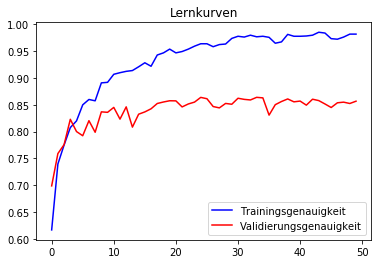

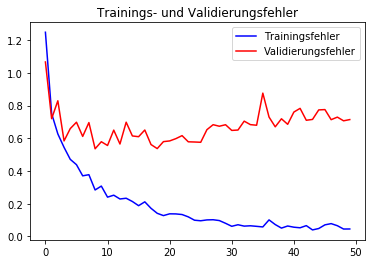

              precision    recall  f1-score   support

     T-shirt       0.83      0.76      0.80      1000
    Trousers       0.99      0.96      0.97      1000
    Pullover       0.76      0.80      0.78      1000
       Dress       0.85      0.90      0.87      1000
        Coat       0.79      0.75      0.77      1000
      Sandal       0.97      0.93      0.95      1000
       Shirt       0.62      0.62      0.62      1000
     Sneaker       0.87      0.97      0.92      1000
         Bag       0.93      0.97      0.95      1000
  Ankle-boot       0.98      0.90      0.94      1000

    accuracy                           0.86     10000
   macro avg       0.86      0.86      0.86     10000
weighted avg       0.86      0.86      0.86     10000



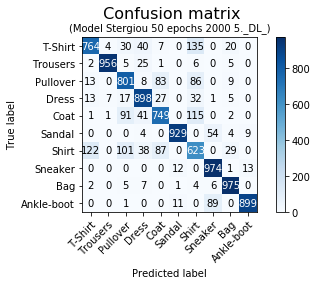

In [0]:
# 5mal Trainingsmenge 2000
runningModels_C(1,5,X_tr_2000, y_tr_2000, X_test, y_test, 2000)

In [0]:
downloader_opt_final_C(2000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/50
5000/5000 [==============================] - 23s 5ms/step - loss: 0.9354 - acc: 0.6944 - val_loss: 0.6440 - val_acc: 0.7959
Epoch 2/50
5000/5000 [==============================] - 5s 985us/step - loss: 0.6201 - acc: 0.7888 - val_loss: 0.5240 - val_acc: 0.8225
Epoch 3/50
5000/5000 [==============================] - 5s 975us/step - loss: 0.4987 - acc: 0.8298 - val_loss: 0.4797 - val_acc: 0.8480
Epoch 4/50
5000/5000 [==============================] - 5s 965us/step - loss: 0.4490 - acc: 0.8388 - val_loss: 0.5126 - val_acc: 0.8329
Epoch 5/50
5000/5000 [==============================] - 5s 977us/step - loss: 0.4024 - acc: 0.8478 - val_loss: 0.5095 - val_acc: 0.8379
Epoch 6/50
5000/5000 [==============================] - 5s 968us/step - loss: 0.3603 - acc: 0.8684 - val_loss: 0.4217 - val_acc: 0.8525
Epoch 7/50
5000/5000 [==========

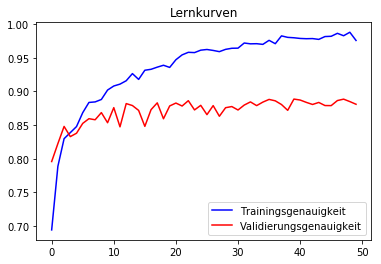

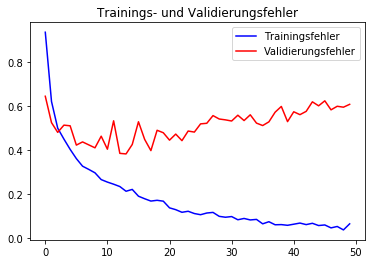

              precision    recall  f1-score   support

     T-shirt       0.86      0.75      0.80      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.85      0.77      0.81      1000
       Dress       0.87      0.87      0.87      1000
        Coat       0.77      0.87      0.81      1000
      Sandal       0.98      0.96      0.97      1000
       Shirt       0.65      0.72      0.69      1000
     Sneaker       0.93      0.98      0.95      1000
         Bag       0.96      0.98      0.97      1000
  Ankle-boot       0.99      0.94      0.97      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



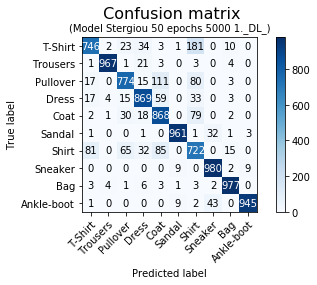

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/50
5000/5000 [==============================] - 24s 5ms/step - loss: 0.9531 - acc: 0.6916 - val_loss: 0.8124 - val_acc: 0.7807
Epoch 2/50
5000/5000 [==============================] - 5s 972us/step - loss: 0.6245 - acc: 0.7820 - val_loss: 0.5272 - val_acc: 0.8145
Epoch 3/50
5000/5000 [==============================] - 5s 991us/step - loss: 0.5140 - acc: 0.8198 - val_loss: 0.5171 - val_acc: 0.8322
Epoch 4/50
5000/5000 [==============================] - 5s 1ms/step - loss: 0.4471 - acc: 0.8392 - val_loss: 0.4618 - val_acc: 0.8395
Epoch 5/50
5000/5000 [==============================] - 5s 986us/step - loss: 0.4100 - acc: 0.8472 - val_loss: 0.4424 - val_acc: 0.8585
Epoch 6/50
5000/5000 [==============================] - 5s 982us/step - loss: 0.3719 - acc: 0.8714 - val_loss: 0.4059 - val_acc: 0.8591
Epoch 7/50
5000/5000 [============

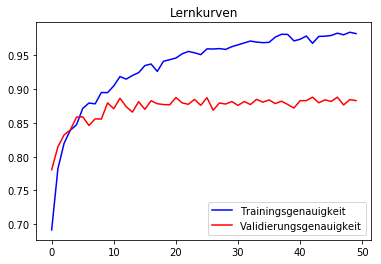

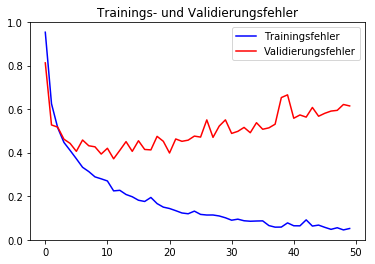

              precision    recall  f1-score   support

     T-shirt       0.83      0.85      0.84      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.84      0.80      0.82      1000
       Dress       0.85      0.92      0.88      1000
        Coat       0.86      0.74      0.80      1000
      Sandal       0.97      0.96      0.97      1000
       Shirt       0.65      0.71      0.68      1000
     Sneaker       0.94      0.95      0.95      1000
         Bag       0.97      0.98      0.97      1000
  Ankle-boot       0.96      0.96      0.96      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



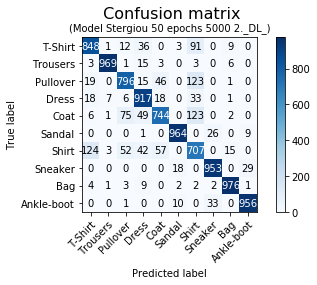

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/50
5000/5000 [==============================] - 24s 5ms/step - loss: 1.0040 - acc: 0.6758 - val_loss: 0.8883 - val_acc: 0.7469
Epoch 2/50
5000/5000 [==============================] - 5s 987us/step - loss: 0.5977 - acc: 0.7910 - val_loss: 0.5053 - val_acc: 0.8377
Epoch 3/50
5000/5000 [==============================] - 5s 983us/step - loss: 0.5026 - acc: 0.8258 - val_loss: 0.4530 - val_acc: 0.8464
Epoch 4/50
5000/5000 [==============================] - 5s 1ms/step - loss: 0.4653 - acc: 0.8328 - val_loss: 0.6114 - val_acc: 0.7965
Epoch 5/50
5000/5000 [==============================] - 5s 986us/step - loss: 0.4159 - acc: 0.8498 - val_loss: 0.4044 - val_acc: 0.8613
Epoch 6/50
5000/5000 [==============================] - 5s 979us/step - loss: 0.3835 - acc: 0.8600 - val_loss: 0.4057 - val_acc: 0.8632
Epoch 7/50
5000/5000 [============

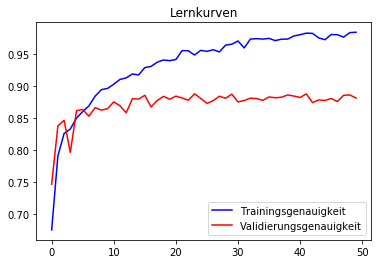

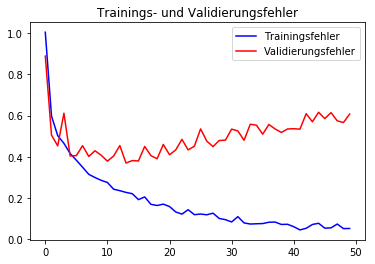

              precision    recall  f1-score   support

     T-shirt       0.84      0.83      0.84      1000
    Trousers       0.98      0.98      0.98      1000
    Pullover       0.71      0.91      0.80      1000
       Dress       0.89      0.87      0.88      1000
        Coat       0.83      0.76      0.79      1000
      Sandal       0.97      0.96      0.96      1000
       Shirt       0.74      0.62      0.68      1000
     Sneaker       0.93      0.96      0.95      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.97      0.95      0.96      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



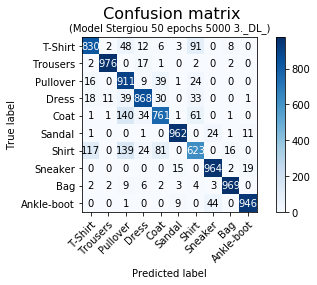

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/50
5000/5000 [==============================] - 25s 5ms/step - loss: 0.9632 - acc: 0.6838 - val_loss: 0.8668 - val_acc: 0.7528
Epoch 2/50
5000/5000 [==============================] - 5s 1ms/step - loss: 0.6069 - acc: 0.7834 - val_loss: 0.7328 - val_acc: 0.7828
Epoch 3/50
5000/5000 [==============================] - 5s 990us/step - loss: 0.5041 - acc: 0.8210 - val_loss: 0.4743 - val_acc: 0.8416
Epoch 4/50
5000/5000 [==============================] - 5s 993us/step - loss: 0.4409 - acc: 0.8436 - val_loss: 0.4530 - val_acc: 0.8523
Epoch 5/50
5000/5000 [==============================] - 5s 992us/step - loss: 0.3998 - acc: 0.8586 - val_loss: 0.4011 - val_acc: 0.8690
Epoch 6/50
5000/5000 [==============================] - 5s 1000us/step - loss: 0.3648 - acc: 0.8622 - val_loss: 0.4736 - val_acc: 0.8477
Epoch 7/50
5000/5000 [===========

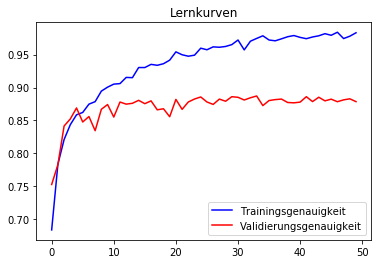

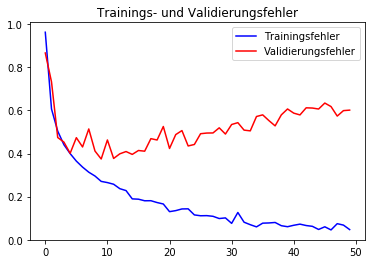

              precision    recall  f1-score   support

     T-shirt       0.87      0.76      0.81      1000
    Trousers       1.00      0.96      0.98      1000
    Pullover       0.87      0.75      0.81      1000
       Dress       0.85      0.90      0.88      1000
        Coat       0.77      0.85      0.81      1000
      Sandal       0.98      0.95      0.97      1000
       Shirt       0.64      0.73      0.68      1000
     Sneaker       0.94      0.95      0.94      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.94      0.96      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



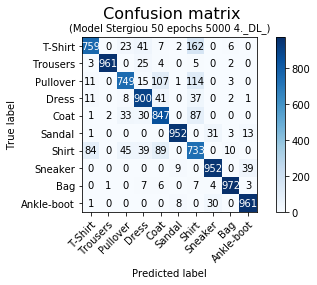

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/50
5000/5000 [==============================] - 25s 5ms/step - loss: 0.9612 - acc: 0.6862 - val_loss: 0.7334 - val_acc: 0.7911
Epoch 2/50
5000/5000 [==============================] - 5s 1ms/step - loss: 0.5940 - acc: 0.7932 - val_loss: 0.5806 - val_acc: 0.8059
Epoch 3/50
5000/5000 [==============================] - 5s 980us/step - loss: 0.4953 - acc: 0.8294 - val_loss: 0.5129 - val_acc: 0.8319
Epoch 4/50
5000/5000 [==============================] - 5s 984us/step - loss: 0.4393 - acc: 0.8424 - val_loss: 0.4993 - val_acc: 0.8408
Epoch 5/50
5000/5000 [==============================] - 5s 986us/step - loss: 0.4071 - acc: 0.8514 - val_loss: 0.4871 - val_acc: 0.8460
Epoch 6/50
5000/5000 [==============================] - 5s 991us/step - loss: 0.3716 - acc: 0.8654 - val_loss: 0.3961 - val_acc: 0.8696
Epoch 7/50
5000/5000 [============

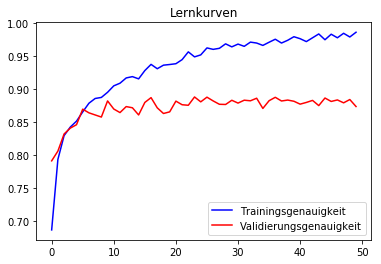

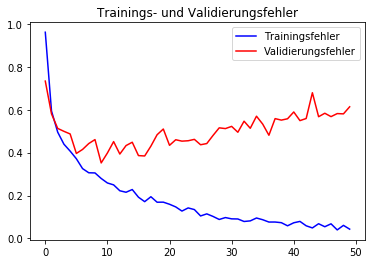

              precision    recall  f1-score   support

     T-shirt       0.88      0.73      0.80      1000
    Trousers       0.98      0.96      0.97      1000
    Pullover       0.86      0.76      0.80      1000
       Dress       0.90      0.84      0.87      1000
        Coat       0.75      0.83      0.79      1000
      Sandal       0.98      0.95      0.97      1000
       Shirt       0.61      0.77      0.68      1000
     Sneaker       0.92      0.97      0.95      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.97      0.95      0.96      1000

    accuracy                           0.87     10000
   macro avg       0.88      0.87      0.88     10000
weighted avg       0.88      0.87      0.88     10000



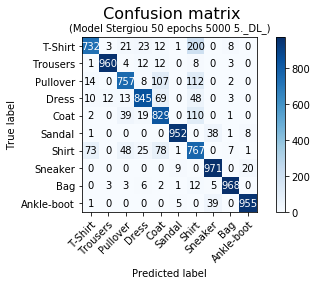

In [0]:
# 5mal Trainingsmenge 5000
runningModels_C(1,5,X_tr_5000, y_tr_5000, X_test, y_test, 5000)

In [0]:
downloader_opt_final_C(5000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 10000 samples, validate on 10000 samples
Epoch 1/50
10000/10000 [==============================] - 29s 3ms/step - loss: 0.7780 - acc: 0.7374 - val_loss: 0.6161 - val_acc: 0.8050
Epoch 2/50
10000/10000 [==============================] - 8s 810us/step - loss: 0.4897 - acc: 0.8296 - val_loss: 0.4415 - val_acc: 0.8466
Epoch 3/50
10000/10000 [==============================] - 8s 818us/step - loss: 0.4074 - acc: 0.8547 - val_loss: 0.4144 - val_acc: 0.8527
Epoch 4/50
10000/10000 [==============================] - 8s 816us/step - loss: 0.3651 - acc: 0.8681 - val_loss: 0.4582 - val_acc: 0.8430
Epoch 5/50
10000/10000 [==============================] - 8s 810us/step - loss: 0.3387 - acc: 0.8781 - val_loss: 0.3587 - val_acc: 0.8723
Epoch 6/50
10000/10000 [==============================] - 8s 819us/step - loss: 0.3189 - acc: 0.8804 - val_loss: 0.3581 - val_acc: 0.8780
Epoch 7/50
10000/10

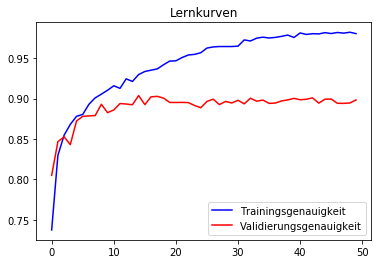

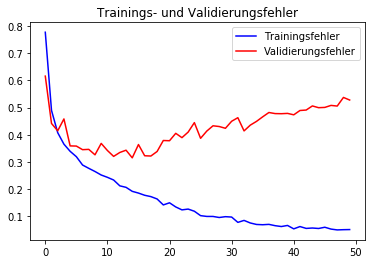

              precision    recall  f1-score   support

     T-shirt       0.84      0.86      0.85      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.82      0.88      0.85      1000
       Dress       0.89      0.91      0.90      1000
        Coat       0.86      0.82      0.84      1000
      Sandal       0.98      0.97      0.98      1000
       Shirt       0.72      0.68      0.70      1000
     Sneaker       0.93      0.98      0.95      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.97      0.95      0.96      1000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



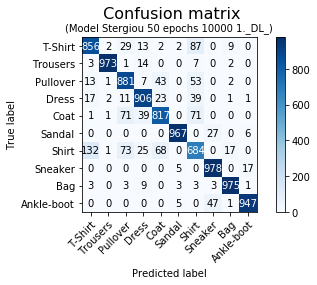

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 10000 samples, validate on 10000 samples
Epoch 1/50
10000/10000 [==============================] - 29s 3ms/step - loss: 0.7853 - acc: 0.7307 - val_loss: 0.5055 - val_acc: 0.8357
Epoch 2/50
10000/10000 [==============================] - 8s 812us/step - loss: 0.5083 - acc: 0.8205 - val_loss: 0.4135 - val_acc: 0.8580
Epoch 3/50
10000/10000 [==============================] - 8s 811us/step - loss: 0.4263 - acc: 0.8459 - val_loss: 0.4059 - val_acc: 0.8593
Epoch 4/50
10000/10000 [==============================] - 8s 830us/step - loss: 0.3784 - acc: 0.8628 - val_loss: 0.3775 - val_acc: 0.8699
Epoch 5/50
10000/10000 [==============================] - 8s 807us/step - loss: 0.3418 - acc: 0.8791 - val_loss: 0.3822 - val_acc: 0.8654
Epoch 6/50
10000/10000 [==============================] - 8s 814us/step - loss: 0.3205 - acc: 0.8822 - val_loss: 0.3274 - val_acc: 0.8855
Epoch 7/50
10000/10

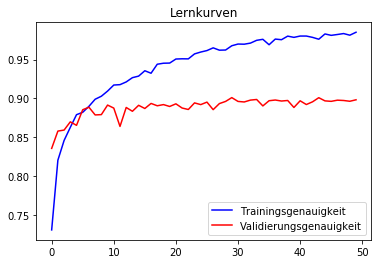

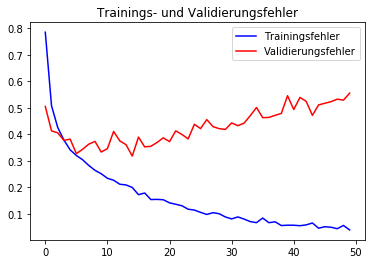

              precision    recall  f1-score   support

     T-shirt       0.86      0.83      0.84      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.86      0.84      0.85      1000
       Dress       0.88      0.92      0.90      1000
        Coat       0.80      0.89      0.84      1000
      Sandal       0.98      0.95      0.97      1000
       Shirt       0.75      0.69      0.72      1000
     Sneaker       0.92      0.98      0.95      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.97      0.94      0.96      1000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



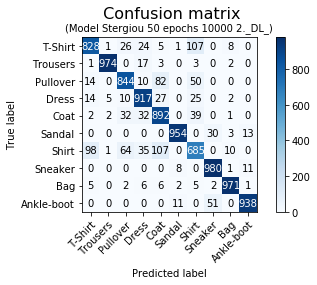

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 10000 samples, validate on 10000 samples
Epoch 1/50
10000/10000 [==============================] - 29s 3ms/step - loss: 0.7816 - acc: 0.7368 - val_loss: 0.6443 - val_acc: 0.7928
Epoch 2/50
10000/10000 [==============================] - 8s 834us/step - loss: 0.5108 - acc: 0.8187 - val_loss: 0.4616 - val_acc: 0.8424
Epoch 3/50
10000/10000 [==============================] - 8s 809us/step - loss: 0.4190 - acc: 0.8479 - val_loss: 0.3662 - val_acc: 0.8669
Epoch 4/50
10000/10000 [==============================] - 8s 814us/step - loss: 0.3697 - acc: 0.8652 - val_loss: 0.4235 - val_acc: 0.8504
Epoch 5/50
10000/10000 [==============================] - 8s 814us/step - loss: 0.3392 - acc: 0.8794 - val_loss: 0.3370 - val_acc: 0.8832
Epoch 6/50
10000/10000 [==============================] - 8s 826us/step - loss: 0.3181 - acc: 0.8879 - val_loss: 0.3573 - val_acc: 0.8800
Epoch 7/50
10000/10

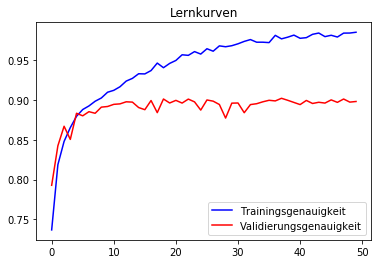

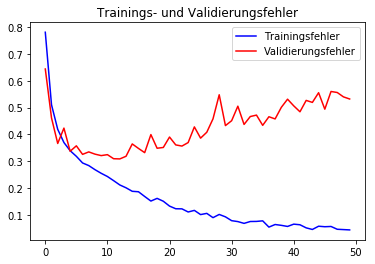

              precision    recall  f1-score   support

     T-shirt       0.87      0.82      0.84      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.83      0.87      0.85      1000
       Dress       0.84      0.94      0.89      1000
        Coat       0.86      0.83      0.85      1000
      Sandal       0.99      0.95      0.97      1000
       Shirt       0.73      0.69      0.71      1000
     Sneaker       0.92      0.99      0.95      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.98      0.94      0.96      1000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



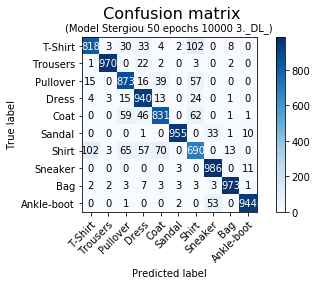

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 10000 samples, validate on 10000 samples
Epoch 1/50
10000/10000 [==============================] - 30s 3ms/step - loss: 0.7779 - acc: 0.7360 - val_loss: 0.6086 - val_acc: 0.7999
Epoch 2/50
10000/10000 [==============================] - 8s 844us/step - loss: 0.5179 - acc: 0.8158 - val_loss: 0.3975 - val_acc: 0.8592
Epoch 3/50
10000/10000 [==============================] - 8s 829us/step - loss: 0.4223 - acc: 0.8470 - val_loss: 0.5638 - val_acc: 0.8086
Epoch 4/50
10000/10000 [==============================] - 8s 827us/step - loss: 0.3670 - acc: 0.8692 - val_loss: 0.4213 - val_acc: 0.8562
Epoch 5/50
10000/10000 [==============================] - 8s 826us/step - loss: 0.3470 - acc: 0.8767 - val_loss: 0.4171 - val_acc: 0.8449
Epoch 6/50
10000/10000 [==============================] - 8s 824us/step - loss: 0.3123 - acc: 0.8886 - val_loss: 0.3231 - val_acc: 0.8914
Epoch 7/50
10000/10

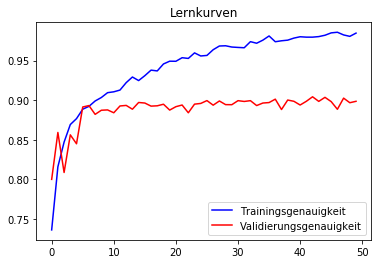

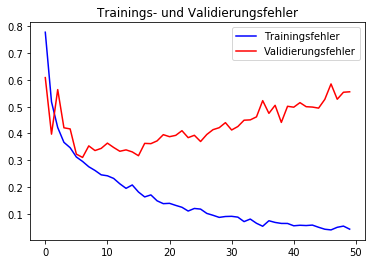

              precision    recall  f1-score   support

     T-shirt       0.80      0.89      0.85      1000
    Trousers       0.98      0.98      0.98      1000
    Pullover       0.78      0.91      0.84      1000
       Dress       0.91      0.89      0.90      1000
        Coat       0.85      0.81      0.83      1000
      Sandal       0.97      0.98      0.98      1000
       Shirt       0.80      0.64      0.71      1000
     Sneaker       0.95      0.97      0.96      1000
         Bag       0.99      0.96      0.97      1000
  Ankle-boot       0.98      0.96      0.97      1000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



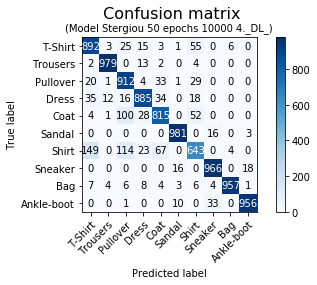

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 10000 samples, validate on 10000 samples
Epoch 1/50
10000/10000 [==============================] - 31s 3ms/step - loss: 0.8301 - acc: 0.7222 - val_loss: 0.6595 - val_acc: 0.7787
Epoch 2/50
10000/10000 [==============================] - 8s 829us/step - loss: 0.5168 - acc: 0.8200 - val_loss: 0.4365 - val_acc: 0.8538
Epoch 3/50
10000/10000 [==============================] - 8s 828us/step - loss: 0.4233 - acc: 0.8505 - val_loss: 0.3664 - val_acc: 0.8756
Epoch 4/50
10000/10000 [==============================] - 8s 835us/step - loss: 0.3668 - acc: 0.8656 - val_loss: 0.3554 - val_acc: 0.8757
Epoch 5/50
10000/10000 [==============================] - 8s 829us/step - loss: 0.3458 - acc: 0.8763 - val_loss: 0.4224 - val_acc: 0.8507
Epoch 6/50
10000/10000 [==============================] - 8s 822us/step - loss: 0.3275 - acc: 0.8840 - val_loss: 0.4350 - val_acc: 0.8610
Epoch 7/50
10000/10

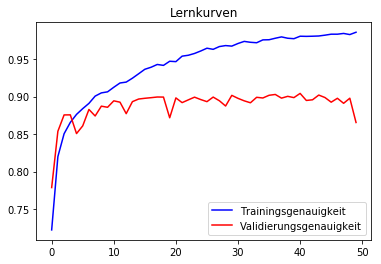

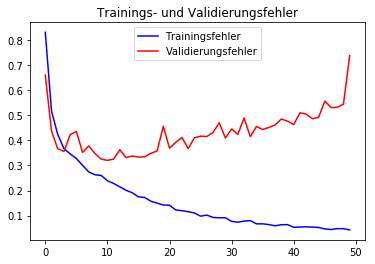

              precision    recall  f1-score   support

     T-shirt       0.84      0.84      0.84      1000
    Trousers       0.96      0.99      0.97      1000
    Pullover       0.59      0.94      0.73      1000
       Dress       0.92      0.82      0.87      1000
        Coat       0.89      0.56      0.69      1000
      Sandal       0.98      0.98      0.98      1000
       Shirt       0.74      0.61      0.67      1000
     Sneaker       0.95      0.97      0.96      1000
         Bag       0.97      0.98      0.97      1000
  Ankle-boot       0.97      0.95      0.96      1000

    accuracy                           0.87     10000
   macro avg       0.88      0.87      0.86     10000
weighted avg       0.88      0.87      0.86     10000



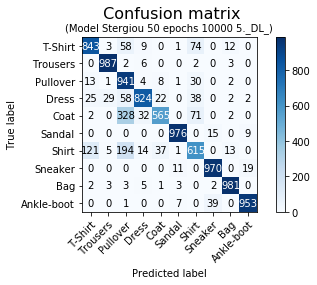

In [0]:
# 5mal Trainingsmenge 10000
runningModels_C(1,5,X_tr_10000, y_tr_10000, X_test, y_test, 10000)

In [0]:
downloader_opt_final_C(10000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 20000 samples, validate on 10000 samples
Epoch 1/50
20000/20000 [==============================] - 37s 2ms/step - loss: 0.6448 - acc: 0.7793 - val_loss: 0.4602 - val_acc: 0.8373
Epoch 2/50
20000/20000 [==============================] - 15s 734us/step - loss: 0.4136 - acc: 0.8552 - val_loss: 0.3640 - val_acc: 0.8724
Epoch 3/50
20000/20000 [==============================] - 14s 724us/step - loss: 0.3572 - acc: 0.8720 - val_loss: 0.3664 - val_acc: 0.8750
Epoch 4/50
20000/20000 [==============================] - 14s 723us/step - loss: 0.3244 - acc: 0.8840 - val_loss: 0.3745 - val_acc: 0.8614
Epoch 5/50
20000/20000 [==============================] - 14s 725us/step - loss: 0.2992 - acc: 0.8945 - val_loss: 0.2941 - val_acc: 0.8923
Epoch 6/50
20000/20000 [==============================] - 15s 728us/step - loss: 0.2856 - acc: 0.8981 - val_loss: 0.2925 - val_acc: 0.8952
Epoch 7/50
200

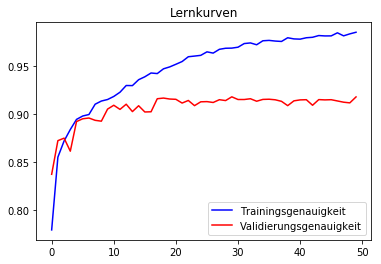

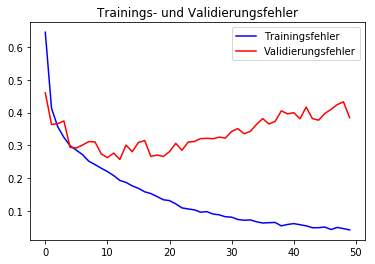

              precision    recall  f1-score   support

     T-shirt       0.88      0.86      0.87      1000
    Trousers       0.99      0.98      0.99      1000
    Pullover       0.88      0.89      0.88      1000
       Dress       0.91      0.91      0.91      1000
        Coat       0.85      0.88      0.86      1000
      Sandal       0.98      0.98      0.98      1000
       Shirt       0.78      0.76      0.77      1000
     Sneaker       0.96      0.98      0.97      1000
         Bag       0.98      0.98      0.98      1000
  Ankle-boot       0.97      0.96      0.97      1000

    accuracy                           0.92     10000
   macro avg       0.92      0.92      0.92     10000
weighted avg       0.92      0.92      0.92     10000



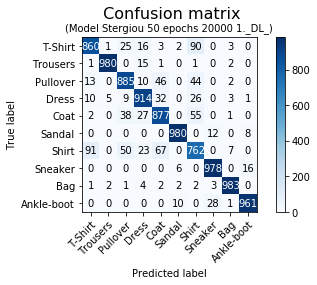

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 20000 samples, validate on 10000 samples
Epoch 1/50
20000/20000 [==============================] - 38s 2ms/step - loss: 0.6539 - acc: 0.7764 - val_loss: 0.4960 - val_acc: 0.8349
Epoch 2/50
20000/20000 [==============================] - 15s 736us/step - loss: 0.4224 - acc: 0.8474 - val_loss: 0.3411 - val_acc: 0.8782
Epoch 3/50
20000/20000 [==============================] - 15s 751us/step - loss: 0.3602 - acc: 0.8695 - val_loss: 0.4090 - val_acc: 0.8620
Epoch 4/50
20000/20000 [==============================] - 15s 739us/step - loss: 0.3235 - acc: 0.8808 - val_loss: 0.3221 - val_acc: 0.8888
Epoch 5/50
20000/20000 [==============================] - 15s 744us/step - loss: 0.2999 - acc: 0.8923 - val_loss: 0.3649 - val_acc: 0.8835
Epoch 6/50
20000/20000 [==============================] - 15s 740us/step - loss: 0.2806 - acc: 0.8998 - val_loss: 0.2921 - val_acc: 0.8965
Epoch 7/50
200

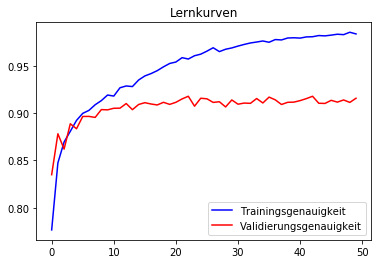

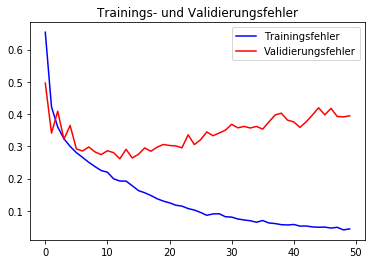

              precision    recall  f1-score   support

     T-shirt       0.86      0.88      0.87      1000
    Trousers       0.99      0.98      0.98      1000
    Pullover       0.88      0.86      0.87      1000
       Dress       0.92      0.92      0.92      1000
        Coat       0.85      0.90      0.87      1000
      Sandal       0.98      0.97      0.98      1000
       Shirt       0.77      0.74      0.75      1000
     Sneaker       0.96      0.97      0.96      1000
         Bag       0.98      0.98      0.98      1000
  Ankle-boot       0.97      0.97      0.97      1000

    accuracy                           0.92     10000
   macro avg       0.92      0.92      0.92     10000
weighted avg       0.92      0.92      0.92     10000



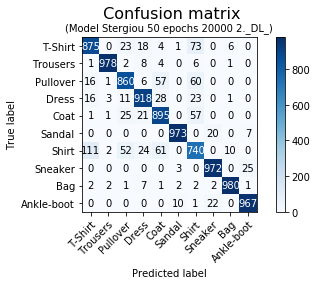

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 20000 samples, validate on 10000 samples
Epoch 1/50
20000/20000 [==============================] - 39s 2ms/step - loss: 0.6576 - acc: 0.7802 - val_loss: 0.4999 - val_acc: 0.8447
Epoch 2/50
20000/20000 [==============================] - 15s 741us/step - loss: 0.4259 - acc: 0.8484 - val_loss: 0.3777 - val_acc: 0.8712
Epoch 3/50
20000/20000 [==============================] - 15s 753us/step - loss: 0.3556 - acc: 0.8726 - val_loss: 0.3220 - val_acc: 0.8837
Epoch 4/50
20000/20000 [==============================] - 15s 740us/step - loss: 0.3261 - acc: 0.8813 - val_loss: 0.3329 - val_acc: 0.8799
Epoch 5/50
20000/20000 [==============================] - 15s 755us/step - loss: 0.3011 - acc: 0.8928 - val_loss: 0.2906 - val_acc: 0.8972
Epoch 6/50
20000/20000 [==============================] - 15s 742us/step - loss: 0.2815 - acc: 0.8980 - val_loss: 0.3020 - val_acc: 0.8931
Epoch 7/50
200

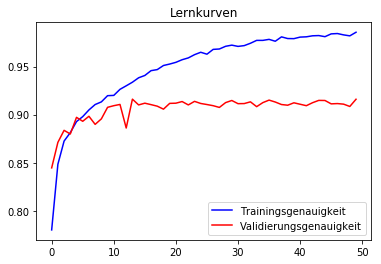

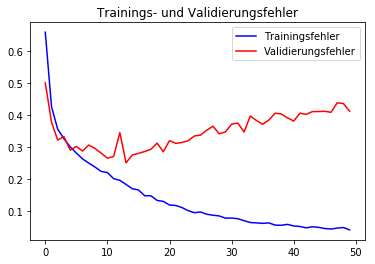

              precision    recall  f1-score   support

     T-shirt       0.87      0.88      0.87      1000
    Trousers       0.99      0.98      0.99      1000
    Pullover       0.89      0.87      0.88      1000
       Dress       0.90      0.93      0.91      1000
        Coat       0.87      0.87      0.87      1000
      Sandal       0.98      0.98      0.98      1000
       Shirt       0.76      0.74      0.75      1000
     Sneaker       0.97      0.97      0.97      1000
         Bag       0.98      0.98      0.98      1000
  Ankle-boot       0.96      0.97      0.97      1000

    accuracy                           0.92     10000
   macro avg       0.92      0.92      0.92     10000
weighted avg       0.92      0.92      0.92     10000



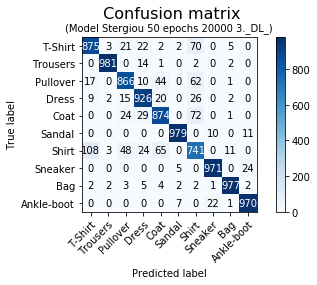

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 20000 samples, validate on 10000 samples
Epoch 1/50
20000/20000 [==============================] - 39s 2ms/step - loss: 0.6435 - acc: 0.7849 - val_loss: 0.4347 - val_acc: 0.8497
Epoch 2/50
20000/20000 [==============================] - 15s 740us/step - loss: 0.4110 - acc: 0.8570 - val_loss: 0.3599 - val_acc: 0.8723
Epoch 3/50
20000/20000 [==============================] - 15s 751us/step - loss: 0.3436 - acc: 0.8766 - val_loss: 0.3177 - val_acc: 0.8852
Epoch 4/50
20000/20000 [==============================] - 15s 735us/step - loss: 0.3147 - acc: 0.8886 - val_loss: 0.3212 - val_acc: 0.8870
Epoch 5/50
20000/20000 [==============================] - 15s 734us/step - loss: 0.2984 - acc: 0.8922 - val_loss: 0.3191 - val_acc: 0.8846
Epoch 6/50
20000/20000 [==============================] - 15s 737us/step - loss: 0.2795 - acc: 0.8977 - val_loss: 0.3111 - val_acc: 0.8914
Epoch 7/50
200

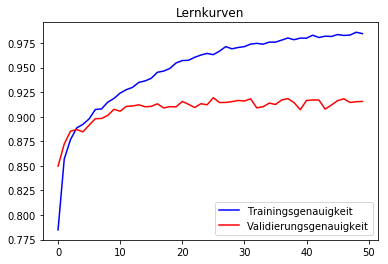

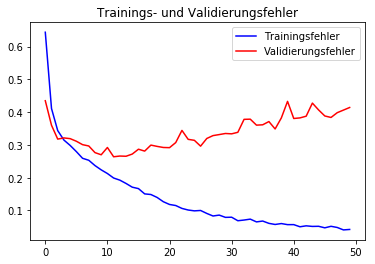

              precision    recall  f1-score   support

     T-shirt       0.89      0.85      0.87      1000
    Trousers       1.00      0.97      0.98      1000
    Pullover       0.90      0.85      0.88      1000
       Dress       0.89      0.93      0.91      1000
        Coat       0.87      0.88      0.87      1000
      Sandal       0.99      0.96      0.98      1000
       Shirt       0.74      0.80      0.77      1000
     Sneaker       0.94      0.98      0.96      1000
         Bag       0.98      0.98      0.98      1000
  Ankle-boot       0.97      0.96      0.97      1000

    accuracy                           0.92     10000
   macro avg       0.92      0.92      0.92     10000
weighted avg       0.92      0.92      0.92     10000



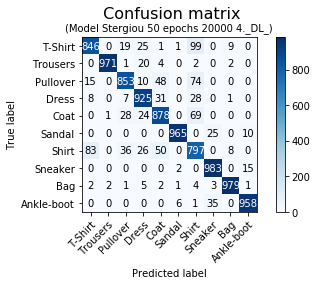

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 20000 samples, validate on 10000 samples
Epoch 1/50
20000/20000 [==============================] - 39s 2ms/step - loss: 0.6373 - acc: 0.7875 - val_loss: 0.4500 - val_acc: 0.8493
Epoch 2/50
20000/20000 [==============================] - 15s 748us/step - loss: 0.4116 - acc: 0.8552 - val_loss: 0.3968 - val_acc: 0.8614
Epoch 3/50
20000/20000 [==============================] - 15s 754us/step - loss: 0.3589 - acc: 0.8699 - val_loss: 0.3427 - val_acc: 0.8794
Epoch 4/50
20000/20000 [==============================] - 15s 748us/step - loss: 0.3274 - acc: 0.8819 - val_loss: 0.3256 - val_acc: 0.8864
Epoch 5/50
20000/20000 [==============================] - 15s 743us/step - loss: 0.3046 - acc: 0.8889 - val_loss: 0.2815 - val_acc: 0.9024
Epoch 6/50
20000/20000 [==============================] - 15s 750us/step - loss: 0.2778 - acc: 0.8986 - val_loss: 0.3063 - val_acc: 0.8933
Epoch 7/50
200

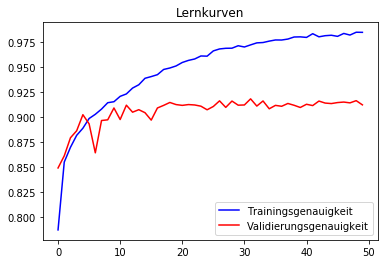

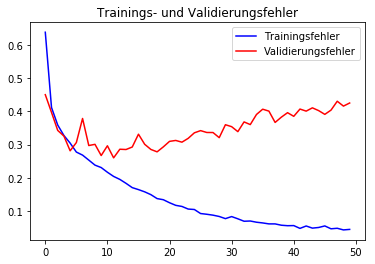

              precision    recall  f1-score   support

     T-shirt       0.89      0.82      0.86      1000
    Trousers       0.99      0.99      0.99      1000
    Pullover       0.91      0.85      0.88      1000
       Dress       0.92      0.91      0.92      1000
        Coat       0.88      0.85      0.86      1000
      Sandal       0.99      0.97      0.98      1000
       Shirt       0.69      0.81      0.75      1000
     Sneaker       0.93      0.99      0.96      1000
         Bag       0.98      0.98      0.98      1000
  Ankle-boot       0.99      0.94      0.96      1000

    accuracy                           0.91     10000
   macro avg       0.92      0.91      0.91     10000
weighted avg       0.92      0.91      0.91     10000



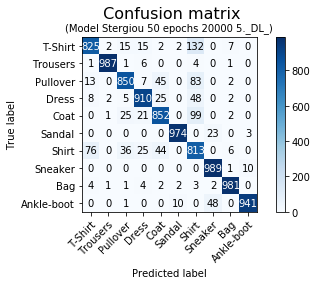

In [0]:
# 5mal Trainingsmenge 20000
runningModels_C(1,5,X_tr_20000, y_tr_20000, X_test, y_test, 20000)

In [0]:
downloader_opt_final_C(20000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 40000 samples, validate on 10000 samples
Epoch 1/50
40000/40000 [==============================] - 53s 1ms/step - loss: 0.5436 - acc: 0.8110 - val_loss: 0.3670 - val_acc: 0.8722
Epoch 2/50
40000/40000 [==============================] - 28s 699us/step - loss: 0.3584 - acc: 0.8724 - val_loss: 0.2923 - val_acc: 0.8937
Epoch 3/50
40000/40000 [==============================] - 28s 700us/step - loss: 0.3155 - acc: 0.8856 - val_loss: 0.2775 - val_acc: 0.8947
Epoch 4/50
40000/40000 [==============================] - 28s 702us/step - loss: 0.2855 - acc: 0.8981 - val_loss: 0.2705 - val_acc: 0.9054
Epoch 5/50
40000/40000 [==============================] - 28s 707us/step - loss: 0.2686 - acc: 0.9055 - val_loss: 0.2670 - val_acc: 0.9039
Epoch 6/50
40000/40000 [==============================] - 28s 703us/step - loss: 0.2493 - acc: 0.9098 - val_loss: 0.2515 - val_acc: 0.9104
Epoch 7/50
400

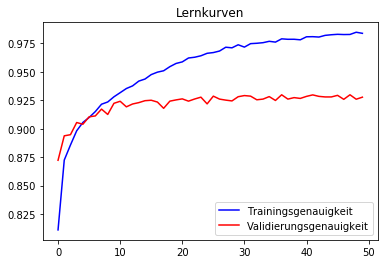

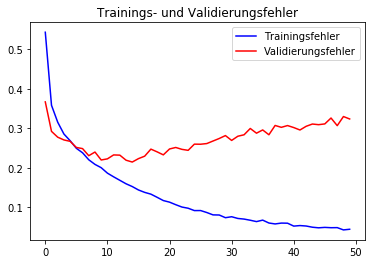

              precision    recall  f1-score   support

     T-shirt       0.90      0.86      0.88      1000
    Trousers       1.00      0.98      0.99      1000
    Pullover       0.92      0.88      0.90      1000
       Dress       0.92      0.94      0.93      1000
        Coat       0.89      0.89      0.89      1000
      Sandal       0.99      0.98      0.98      1000
       Shirt       0.77      0.82      0.79      1000
     Sneaker       0.96      0.97      0.97      1000
         Bag       0.98      0.99      0.99      1000
  Ankle-boot       0.97      0.97      0.97      1000

    accuracy                           0.93     10000
   macro avg       0.93      0.93      0.93     10000
weighted avg       0.93      0.93      0.93     10000



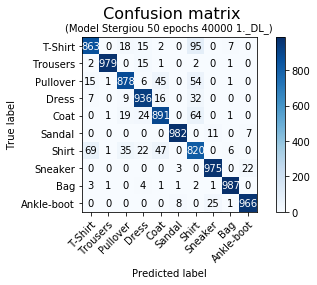

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 40000 samples, validate on 10000 samples
Epoch 1/50
40000/40000 [==============================] - 54s 1ms/step - loss: 0.5315 - acc: 0.8175 - val_loss: 0.3784 - val_acc: 0.8676
Epoch 2/50
40000/40000 [==============================] - 28s 705us/step - loss: 0.3543 - acc: 0.8739 - val_loss: 0.3229 - val_acc: 0.8765
Epoch 3/50
40000/40000 [==============================] - 28s 711us/step - loss: 0.3119 - acc: 0.8871 - val_loss: 0.3099 - val_acc: 0.8894
Epoch 4/50
40000/40000 [==============================] - 28s 702us/step - loss: 0.2915 - acc: 0.8950 - val_loss: 0.2828 - val_acc: 0.9033
Epoch 5/50
40000/40000 [==============================] - 28s 703us/step - loss: 0.2662 - acc: 0.9041 - val_loss: 0.2604 - val_acc: 0.9043
Epoch 6/50
40000/40000 [==============================] - 28s 703us/step - loss: 0.2479 - acc: 0.9095 - val_loss: 0.2464 - val_acc: 0.9097
Epoch 7/50
400

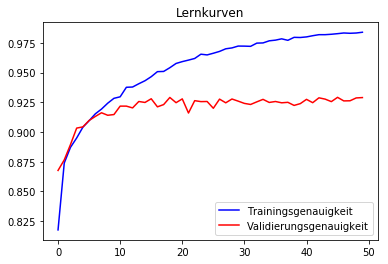

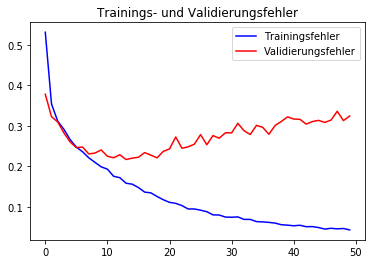

              precision    recall  f1-score   support

     T-shirt       0.89      0.87      0.88      1000
    Trousers       0.99      0.99      0.99      1000
    Pullover       0.90      0.90      0.90      1000
       Dress       0.90      0.95      0.92      1000
        Coat       0.88      0.89      0.89      1000
      Sandal       0.99      0.99      0.99      1000
       Shirt       0.79      0.77      0.78      1000
     Sneaker       0.96      0.98      0.97      1000
         Bag       0.99      0.98      0.99      1000
  Ankle-boot       0.98      0.97      0.97      1000

    accuracy                           0.93     10000
   macro avg       0.93      0.93      0.93     10000
weighted avg       0.93      0.93      0.93     10000



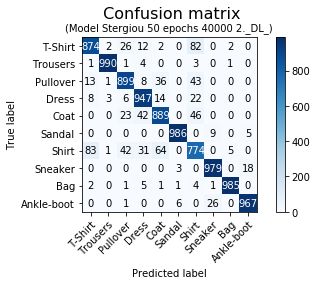

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 40000 samples, validate on 10000 samples
Epoch 1/50
40000/40000 [==============================] - 54s 1ms/step - loss: 0.5454 - acc: 0.8124 - val_loss: 0.3670 - val_acc: 0.8745
Epoch 2/50
40000/40000 [==============================] - 28s 695us/step - loss: 0.3551 - acc: 0.8729 - val_loss: 0.3032 - val_acc: 0.8955
Epoch 3/50
40000/40000 [==============================] - 28s 693us/step - loss: 0.3186 - acc: 0.8865 - val_loss: 0.2730 - val_acc: 0.9014
Epoch 4/50
40000/40000 [==============================] - 28s 696us/step - loss: 0.2873 - acc: 0.8964 - val_loss: 0.2566 - val_acc: 0.9077
Epoch 5/50
40000/40000 [==============================] - 28s 709us/step - loss: 0.2635 - acc: 0.9051 - val_loss: 0.2620 - val_acc: 0.9047
Epoch 6/50
40000/40000 [==============================] - 28s 698us/step - loss: 0.2513 - acc: 0.9088 - val_loss: 0.2458 - val_acc: 0.9132
Epoch 7/50
400

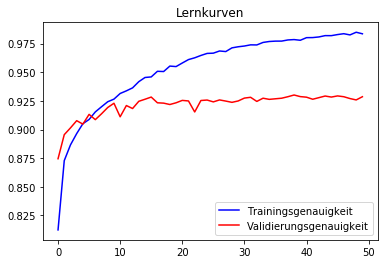

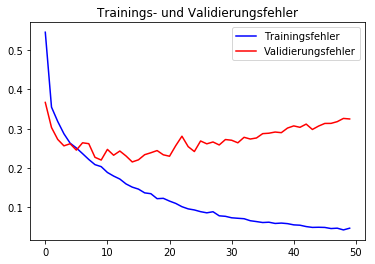

              precision    recall  f1-score   support

     T-shirt       0.90      0.86      0.88      1000
    Trousers       1.00      0.99      0.99      1000
    Pullover       0.87      0.92      0.90      1000
       Dress       0.92      0.93      0.92      1000
        Coat       0.92      0.86      0.89      1000
      Sandal       0.99      0.99      0.99      1000
       Shirt       0.78      0.81      0.80      1000
     Sneaker       0.95      0.98      0.97      1000
         Bag       0.98      0.99      0.99      1000
  Ankle-boot       0.98      0.95      0.97      1000

    accuracy                           0.93     10000
   macro avg       0.93      0.93      0.93     10000
weighted avg       0.93      0.93      0.93     10000



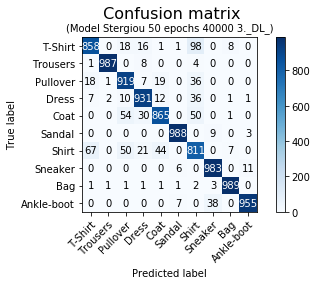

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 40000 samples, validate on 10000 samples
Epoch 1/50
40000/40000 [==============================] - 55s 1ms/step - loss: 0.5342 - acc: 0.8156 - val_loss: 0.3529 - val_acc: 0.8739
Epoch 2/50
40000/40000 [==============================] - 28s 703us/step - loss: 0.3508 - acc: 0.8739 - val_loss: 0.2836 - val_acc: 0.8993
Epoch 3/50
40000/40000 [==============================] - 28s 711us/step - loss: 0.3090 - acc: 0.8886 - val_loss: 0.2725 - val_acc: 0.9021
Epoch 4/50
40000/40000 [==============================] - 28s 706us/step - loss: 0.2858 - acc: 0.8978 - val_loss: 0.2632 - val_acc: 0.9095
Epoch 5/50
40000/40000 [==============================] - 28s 706us/step - loss: 0.2675 - acc: 0.9044 - val_loss: 0.2691 - val_acc: 0.9042
Epoch 6/50
40000/40000 [==============================] - 28s 702us/step - loss: 0.2470 - acc: 0.9102 - val_loss: 0.2506 - val_acc: 0.9102
Epoch 7/50
400

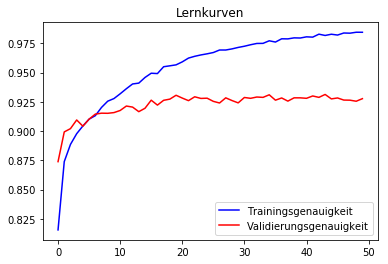

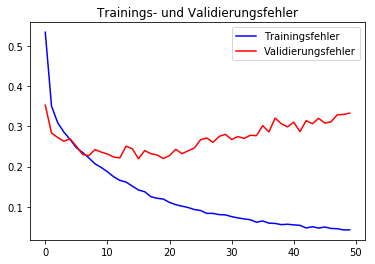

              precision    recall  f1-score   support

     T-shirt       0.90      0.87      0.88      1000
    Trousers       0.99      0.99      0.99      1000
    Pullover       0.89      0.90      0.90      1000
       Dress       0.93      0.93      0.93      1000
        Coat       0.84      0.94      0.89      1000
      Sandal       0.99      0.98      0.99      1000
       Shirt       0.82      0.73      0.77      1000
     Sneaker       0.97      0.97      0.97      1000
         Bag       0.98      0.99      0.99      1000
  Ankle-boot       0.97      0.97      0.97      1000

    accuracy                           0.93     10000
   macro avg       0.93      0.93      0.93     10000
weighted avg       0.93      0.93      0.93     10000



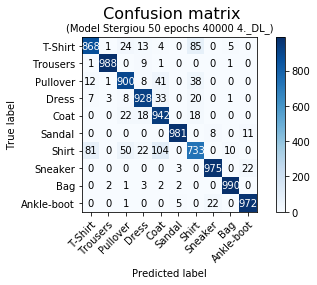

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 40000 samples, validate on 10000 samples
Epoch 1/50
40000/40000 [==============================] - 55s 1ms/step - loss: 0.5500 - acc: 0.8113 - val_loss: 0.3990 - val_acc: 0.8619
Epoch 2/50
40000/40000 [==============================] - 28s 702us/step - loss: 0.3530 - acc: 0.8734 - val_loss: 0.3102 - val_acc: 0.8856
Epoch 3/50
40000/40000 [==============================] - 28s 704us/step - loss: 0.3081 - acc: 0.8888 - val_loss: 0.2756 - val_acc: 0.9017
Epoch 4/50
40000/40000 [==============================] - 28s 702us/step - loss: 0.2841 - acc: 0.8994 - val_loss: 0.2504 - val_acc: 0.9099
Epoch 5/50
40000/40000 [==============================] - 28s 708us/step - loss: 0.2642 - acc: 0.9056 - val_loss: 0.2439 - val_acc: 0.9109
Epoch 6/50
40000/40000 [==============================] - 28s 700us/step - loss: 0.2485 - acc: 0.9091 - val_loss: 0.2512 - val_acc: 0.9086
Epoch 7/50
400

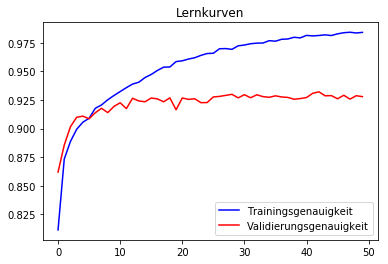

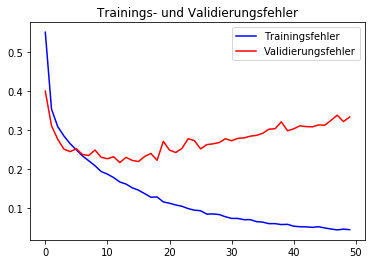

              precision    recall  f1-score   support

     T-shirt       0.85      0.90      0.87      1000
    Trousers       1.00      0.98      0.99      1000
    Pullover       0.91      0.90      0.90      1000
       Dress       0.91      0.94      0.93      1000
        Coat       0.85      0.93      0.89      1000
      Sandal       0.99      0.99      0.99      1000
       Shirt       0.84      0.71      0.77      1000
     Sneaker       0.97      0.97      0.97      1000
         Bag       0.99      0.98      0.99      1000
  Ankle-boot       0.97      0.97      0.97      1000

    accuracy                           0.93     10000
   macro avg       0.93      0.93      0.93     10000
weighted avg       0.93      0.93      0.93     10000



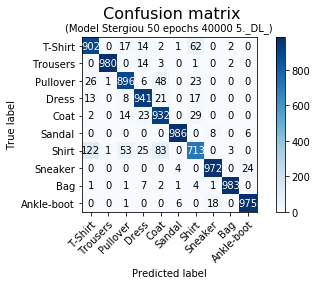

In [0]:
# 5mal Trainingsmenge 40000
runningModels_C(1,5,X_tr_40000, y_tr_40000, X_test, y_test, 40000)

In [0]:
downloader_opt_final_C(40000)

In [0]:
def downloader_opt_final_C(number_trainingdata):
  for i in range(1, 6):
    file_name = str(i)+"._"+str(number_trainingdata)+"_"
    file_name2 = str(i)+"._DL_"+str(number_trainingdata)+"_"
    files.download(file_name+"Lernkurve_FM_6Conv_acc.png")
    files.download(file_name+"Lernkurve_FM_6Conv_loss.png")
    files.download(file_name2+"Confusion_matrix.png")
    files.download(file_name2+"Testzeiten.csv")
    files.download(file_name2+"Trainingszeiten.csv")
    files.download(file_name2+"CNN_6Conv_epochs50_C.hdf5")
    files.download(file_name2+"CNN_6Conv_epochs50_C_weights.hdf5")
    #files.download(file_name2+"beste_Epoche_full.csv")
    files.download(file_name2+"metrics.csv")
    files.download(file_name2+"precision_recall_fscore.csv")
    files.download(file_name2+"roc_auc_score_single_class.npy")
    files.download(file_name2+"y_pred_label.npy")